In [1]:
# setup 
!pip install -r requirements.txt
import psutil ; print(list(psutil.virtual_memory())[0:2])
import statistics 
import numpy as np
import pandas as pd
from scipy import stats

import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('ggplot')

import xgboost as xgb

import pickle

import gc
gc.collect()
print(list(psutil.virtual_memory())[0:2])

You should consider upgrading via the '/Users/melaniequ/opt/anaconda3/bin/python -m pip install --upgrade pip' command.
[8589934592, 1933398016]
[8589934592, 1902800896]


In [2]:

columns = ['Credit_Score', 'First_Payment_Date', 'First_Time_Homebuyer_Flag', 'Maturity_Date', 'MSA', 'MI_Percentage', 'Number_of_Units', 'Occupancy_Status', 'Original_Combined_Loan_to_Value(CLTV)', 'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB', 'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate', 'Channel', 'Prepayment_Penalty_Mortgage (PPM) Flag', 'Product_Type', 'Property_State', 'Property_Type', 'Postal_Code', 'Loan_Sequence_Number','Loan_Purpose', 'Original_Loan_Term', 'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name', 'Super_Conforming_Flag', 'Program_Indicator']
data = pd.read_table('/Users/melaniequ/Downloads/historical_data1_1999/historical_data1_Q11999/historical_data1_Q11999.txt', sep="|", names=columns)
print(data.head())

   Credit_Score  First_Payment_Date First_Time_Homebuyer_Flag  Maturity_Date  \
0           751              199910                         N         202909   
1           733              199909                         N         202908   
2           755              199905                         N         202904   
3           669              200206                         N         202901   
4           732              199904                         N         202903   

       MSA  MI_Percentage  Number_of_Units Occupancy_Status  \
0      NaN              0                1                P   
1  29540.0              0                1                P   
2  29540.0             30                1                P   
3      NaN              0                1                P   
4  17140.0              0                1                P   

   Original_Combined_Loan_to_Value(CLTV)  Original_Debt_to_Income (DTI) Ratio  \
0                                     71                   

In [3]:
# the column 'First_Payment_Date' was split to 'First_Payment_Year' and 'First_Payment_Month'

data['First_Payment_Date'].dtype
data['First_Payment_Year']= np.floor(data['First_Payment_Date']/100)
data['First_Payment_Month']= data['First_Payment_Date'] % 100
data= data.drop(['First_Payment_Date'], axis=1)

In [4]:
data.head(5)

,Credit_Score,First_Time_Homebuyer_Flag,Maturity_Date,MSA,MI_Percentage,Number_of_Units,Occupancy_Status,Original_Combined_Loan_to_Value(CLTV),Original_Debt_to_Income (DTI) Ratio,Original_UPB,...,Loan_Sequence_Number,Loan_Purpose,Original_Loan_Term,Number_of_Borrowers,Seller_Name,Servicer_Name,Super_Conforming_Flag,Program_Indicator,First_Payment_Year,First_Payment_Month
0,751,N,202909,NaN,0,1,P,71,20,180000,...,F199Q1000001,P,360,2,Other sellers,Other servicers,NaN,9,1999.0,10
1,733,N,202908,29540.0,0,1,P,51,999,116000,...,F199Q1000002,P,360,1,Other sellers,Other servicers,NaN,9,1999.0,9
2,755,N,202904,29540.0,30,1,P,95,38,138000,...,F199Q1000003,P,360,2,Other sellers,Other servicers,NaN,9,1999.0,5
3,669,N,202901,NaN,0,1,P,80,33,162000,...,F199Q1000004,P,320,2,Other sellers,Other servicers,NaN,9,2002.0,6
4,732,N,202903,17140.0,0,1,P,25,10,53000,...,F199Q1000005,N,360,1,Other sellers,Other servicers,NaN,9,1999.0,4


In [5]:
data['Maturity_Date'].dtype
data['Maturity_Year']= np.floor(data['Maturity_Date']/100)
data['Maturity_Month']= data['Maturity_Date'] % 100
data= data.drop(['Maturity_Date'], axis=1)

In [6]:
data.head(5)

,Credit_Score,First_Time_Homebuyer_Flag,MSA,MI_Percentage,Number_of_Units,Occupancy_Status,Original_Combined_Loan_to_Value(CLTV),Original_Debt_to_Income (DTI) Ratio,Original_UPB,Original_Loan_to_Value(LTV),...,Original_Loan_Term,Number_of_Borrowers,Seller_Name,Servicer_Name,Super_Conforming_Flag,Program_Indicator,First_Payment_Year,First_Payment_Month,Maturity_Year,Maturity_Month
0,751,N,NaN,0,1,P,71,20,180000,71,...,360,2,Other sellers,Other servicers,NaN,9,1999.0,10,2029.0,9
1,733,N,29540.0,0,1,P,51,999,116000,51,...,360,1,Other sellers,Other servicers,NaN,9,1999.0,9,2029.0,8
2,755,N,29540.0,30,1,P,95,38,138000,95,...,360,2,Other sellers,Other servicers,NaN,9,1999.0,5,2029.0,4
3,669,N,NaN,0,1,P,80,33,162000,80,...,320,2,Other sellers,Other servicers,NaN,9,2002.0,6,2029.0,1
4,732,N,17140.0,0,1,P,25,10,53000,25,...,360,1,Other sellers,Other servicers,NaN,9,1999.0,4,2029.0,3


In [7]:
# Testing to see if the column 'Credit_Score' has any null values
data['Credit_Score'].isnull().sum().sum()

0

In [8]:
# Testing to see if the column 'First_Payment_Year' has any null values
data['First_Payment_Year'].isnull().sum().sum()

0

In [9]:
# Testing to see if the column 'First_Payment_Month' has any null values
data['First_Payment_Month'].isnull().sum().sum()

0

In [10]:
# Testing to see if the column 'First_Time_Homebuyer_Flag' has any null values
data['First_Time_Homebuyer_Flag'].isnull().sum().sum()
print(data['First_Time_Homebuyer_Flag'].value_counts())
data = pd.concat([data, pd.get_dummies(pd.Series(data['First_Time_Homebuyer_Flag']), prefix='First_Time_Homebuyer_Flag')], axis=1)
#data['First_Time_Homebuyer_Flag'] = pd.get_dummies(data['First_Time_Homebuyer_Flag'])
#print(data['First_Time_Homebuyer_Flag'].value_counts())
data = data.drop(['First_Time_Homebuyer_Flag'], axis =1 )
data.head()

N    243884
9    114067
Y     34894
Name: First_Time_Homebuyer_Flag, dtype: int64


,Credit_Score,MSA,MI_Percentage,Number_of_Units,Occupancy_Status,Original_Combined_Loan_to_Value(CLTV),Original_Debt_to_Income (DTI) Ratio,Original_UPB,Original_Loan_to_Value(LTV),Original_Interest_Rate,...,Servicer_Name,Super_Conforming_Flag,Program_Indicator,First_Payment_Year,First_Payment_Month,Maturity_Year,Maturity_Month,First_Time_Homebuyer_Flag_9,First_Time_Homebuyer_Flag_N,First_Time_Homebuyer_Flag_Y
0,751,NaN,0,1,P,71,20,180000,71,6.30,...,Other servicers,NaN,9,1999.0,10,2029.0,9,0,1,0
1,733,29540.0,0,1,P,51,999,116000,51,6.30,...,Other servicers,NaN,9,1999.0,9,2029.0,8,0,1,0
2,755,29540.0,30,1,P,95,38,138000,95,6.60,...,Other servicers,NaN,9,1999.0,5,2029.0,4,0,1,0
3,669,NaN,0,1,P,80,33,162000,80,7.12,...,Other servicers,NaN,9,2002.0,6,2029.0,1,0,1,0
4,732,17140.0,0,1,P,25,10,53000,25,6.50,...,Other servicers,NaN,9,1999.0,4,2029.0,3,0,1,0


In [11]:
# Testing to see if the column 'Maturnity_Year' has any null values
data['Maturity_Year'].isnull().sum().sum()

0

In [12]:
# Testing to see if the column 'Maturnity_Month' has any null values
data['Maturity_Month'].isnull().sum().sum()

0

In [13]:
# Testing to see if the column 'MSA' has any null values
data['MSA'].isnull().sum().sum()
data.loc[data['MSA'].isnull(),'MSA'] = np.mean(data['MSA'])

print(data['MSA'].isnull().sum().sum())
print(np.mean(data['MSA']))
print(data['MSA'].describe())

0
31077.24254256972
count    392845.000000
mean      31077.242543
std       10494.116306
min       10180.000000
25%       21780.000000
50%       31077.242543
75%       39900.000000
max       49740.000000
Name: MSA, dtype: float64


In [14]:
# Testing to see if the column 'MI_Percentage' has any null values
data['MI_Percentage'].isnull().sum().sum()

0

In [15]:
# Testing to see if the column 'Number_of_Units' has any null values
data['Number_of_Units'].isnull().sum().sum()

0

In [16]:
# Testing to see if the column 'Occupancy_Status' has any null values

data['Occupancy_Status'].isnull().sum().sum()
print(data['Occupancy_Status'].value_counts())
data = pd.concat([data, pd.get_dummies(pd.Series(data['Occupancy_Status']), prefix='Occupancy_Status')], axis=1)

data = data.drop(['Occupancy_Status'], axis =1 )
data.head()

P    370520
I     13149
S      9176
Name: Occupancy_Status, dtype: int64


,Credit_Score,MSA,MI_Percentage,Number_of_Units,Original_Combined_Loan_to_Value(CLTV),Original_Debt_to_Income (DTI) Ratio,Original_UPB,Original_Loan_to_Value(LTV),Original_Interest_Rate,Channel,...,First_Payment_Year,First_Payment_Month,Maturity_Year,Maturity_Month,First_Time_Homebuyer_Flag_9,First_Time_Homebuyer_Flag_N,First_Time_Homebuyer_Flag_Y,Occupancy_Status_I,Occupancy_Status_P,Occupancy_Status_S
0,751,31077.242543,0,1,71,20,180000,71,6.30,R,...,1999.0,10,2029.0,9,0,1,0,0,1,0
1,733,29540.000000,0,1,51,999,116000,51,6.30,R,...,1999.0,9,2029.0,8,0,1,0,0,1,0
2,755,29540.000000,30,1,95,38,138000,95,6.60,R,...,1999.0,5,2029.0,4,0,1,0,0,1,0
3,669,31077.242543,0,1,80,33,162000,80,7.12,R,...,2002.0,6,2029.0,1,0,1,0,0,1,0
4,732,17140.000000,0,1,25,10,53000,25,6.50,R,...,1999.0,4,2029.0,3,0,1,0,0,1,0


In [17]:
# Testing to see if the column 'Original_Combined_Loan_to_Value(CLTV)' has any null values
data['Original_Combined_Loan_to_Value(CLTV)'].isnull().sum().sum()
print(data['Original_Combined_Loan_to_Value(CLTV)'].value_counts())

80     83467
95     37294
90     30980
75     27963
79     11390
       ...  
102        8
101        6
999        5
104        4
110        3
Name: Original_Combined_Loan_to_Value(CLTV), Length: 102, dtype: int64


In [18]:
# Testing to see if the column 'Original_Debt_to_Income (DTI) Ratio' has any null values
data['Original_Debt_to_Income (DTI) Ratio'].isnull().sum().sum()

0

In [19]:
# Testing to see if the column 'Original_UPB' has any null values
data['Original_UPB'].isnull().sum().sum()

0

In [20]:
# Testing to see if the column 'Original_Loan_to_Value(LTV)' has any null values
data['Original_Loan_to_Value(LTV)'].isnull().sum().sum()

0

In [21]:
# Testing to see if the column 'Original_Interest_Rate' has any null values
data['Original_Interest_Rate'].isnull().sum().sum()

0

In [22]:
# Testing to see if the column 'Channel' has any null values

data['Channel'].isnull().sum().sum()
print(data['Channel'].value_counts())
data = pd.concat([data, pd.get_dummies(pd.Series(data['Channel']), prefix='Channel')], axis=1)

data = data.drop(['Channel'], axis =1 )
data.head()

T    215417
R    176838
C       415
B       175
Name: Channel, dtype: int64


,Credit_Score,MSA,MI_Percentage,Number_of_Units,Original_Combined_Loan_to_Value(CLTV),Original_Debt_to_Income (DTI) Ratio,Original_UPB,Original_Loan_to_Value(LTV),Original_Interest_Rate,Prepayment_Penalty_Mortgage (PPM) Flag,...,First_Time_Homebuyer_Flag_9,First_Time_Homebuyer_Flag_N,First_Time_Homebuyer_Flag_Y,Occupancy_Status_I,Occupancy_Status_P,Occupancy_Status_S,Channel_B,Channel_C,Channel_R,Channel_T
0,751,31077.242543,0,1,71,20,180000,71,6.30,N,...,0,1,0,0,1,0,0,0,1,0
1,733,29540.000000,0,1,51,999,116000,51,6.30,N,...,0,1,0,0,1,0,0,0,1,0
2,755,29540.000000,30,1,95,38,138000,95,6.60,N,...,0,1,0,0,1,0,0,0,1,0
3,669,31077.242543,0,1,80,33,162000,80,7.12,N,...,0,1,0,0,1,0,0,0,1,0
4,732,17140.000000,0,1,25,10,53000,25,6.50,N,...,0,1,0,0,1,0,0,0,1,0


In [23]:
# Testing to see if the column 'Prepayment_Penalty_Mortgage (PPM) Flag' has any null values

data['Prepayment_Penalty_Mortgage (PPM) Flag'].isnull().sum().sum()
print(data['Prepayment_Penalty_Mortgage (PPM) Flag'].value_counts())
data = pd.concat([data, pd.get_dummies(pd.Series(data['Prepayment_Penalty_Mortgage (PPM) Flag']), prefix='Prepayment_Penalty_Mortgage (PPM) Flag')], axis=1)

data = data.drop(['Prepayment_Penalty_Mortgage (PPM) Flag'], axis =1 )
data.head()

N    379789
Y      4388
Name: Prepayment_Penalty_Mortgage (PPM) Flag, dtype: int64


,Credit_Score,MSA,MI_Percentage,Number_of_Units,Original_Combined_Loan_to_Value(CLTV),Original_Debt_to_Income (DTI) Ratio,Original_UPB,Original_Loan_to_Value(LTV),Original_Interest_Rate,Product_Type,...,First_Time_Homebuyer_Flag_Y,Occupancy_Status_I,Occupancy_Status_P,Occupancy_Status_S,Channel_B,Channel_C,Channel_R,Channel_T,Prepayment_Penalty_Mortgage (PPM) Flag_N,Prepayment_Penalty_Mortgage (PPM) Flag_Y
0,751,31077.242543,0,1,71,20,180000,71,6.30,FRM,...,0,0,1,0,0,0,1,0,1,0
1,733,29540.000000,0,1,51,999,116000,51,6.30,FRM,...,0,0,1,0,0,0,1,0,1,0
2,755,29540.000000,30,1,95,38,138000,95,6.60,FRM,...,0,0,1,0,0,0,1,0,1,0
3,669,31077.242543,0,1,80,33,162000,80,7.12,FRM,...,0,0,1,0,0,0,1,0,1,0
4,732,17140.000000,0,1,25,10,53000,25,6.50,FRM,...,0,0,1,0,0,0,1,0,1,0


In [24]:
# Testing to see if the column 'Product_Type' has any null values
data['Product_Type'].isnull().sum().sum()
print(data['Product_Type'].value_counts())

# Since the whole column consists of 'FRM' (Fixed Rate Mortgage), we don't really need this column.
data= data.drop(['Product_Type'], axis=1)

FRM    392845
Name: Product_Type, dtype: int64


In [25]:
# Testing to see if the column 'Product_State' has any null values

data['Property_State'].isnull().sum().sum()
print(data['Property_State'].value_counts())
data['Property_State'] = pd.get_dummies(data['Property_State'])
print(data['Property_State'].value_counts())

CA    65181
FL    23246
MI    20111
IL    18633
TX    16134
WA    15001
OH    14924
CO    13468
GA    12634
NC    12352
AZ    12231
NY    10572
VA    10423
MA     9944
PA     9890
NJ     9806
OR     9767
MN     8576
IN     7965
MO     7437
MD     7403
WI     7105
UT     6413
TN     5537
SC     5368
KY     5351
NV     4841
AL     4779
CT     4426
KS     3077
ID     3043
IA     2618
LA     2565
NM     2535
OK     2154
NH     1968
NE     1917
AR     1308
ME     1293
MT     1241
VT     1203
DE     1114
MS     1054
RI     1027
HI      969
PR      897
WV      653
DC      626
WY      626
SD      553
ND      452
AK      341
GU       93
Name: Property_State, dtype: int64
0    392504
1       341
Name: Property_State, dtype: int64


In [26]:
# Testing to see if the column 'Property_Type' has any null values

print(data['Property_Type'].value_counts())
data['Property_Type'].isnull().sum().sum()
print(data['Property_Type'].value_counts())
data = pd.concat([data, pd.get_dummies(pd.Series(data['Property_Type']), prefix='Property_Type')], axis=1)

data = data.drop(['Property_Type'], axis =1 )
data.head()

SF    330390
PU     37735
CO     23646
MH       845
CP       207
99        22
Name: Property_Type, dtype: int64
SF    330390
PU     37735
CO     23646
MH       845
CP       207
99        22
Name: Property_Type, dtype: int64


,Credit_Score,MSA,MI_Percentage,Number_of_Units,Original_Combined_Loan_to_Value(CLTV),Original_Debt_to_Income (DTI) Ratio,Original_UPB,Original_Loan_to_Value(LTV),Original_Interest_Rate,Property_State,...,Channel_R,Channel_T,Prepayment_Penalty_Mortgage (PPM) Flag_N,Prepayment_Penalty_Mortgage (PPM) Flag_Y,Property_Type_99,Property_Type_CO,Property_Type_CP,Property_Type_MH,Property_Type_PU,Property_Type_SF
0,751,31077.242543,0,1,71,20,180000,71,6.30,0,...,1,0,1,0,0,0,0,0,0,1
1,733,29540.000000,0,1,51,999,116000,51,6.30,0,...,1,0,1,0,0,0,0,0,0,1
2,755,29540.000000,30,1,95,38,138000,95,6.60,0,...,1,0,1,0,0,0,0,0,0,1
3,669,31077.242543,0,1,80,33,162000,80,7.12,0,...,1,0,1,0,0,0,0,0,0,1
4,732,17140.000000,0,1,25,10,53000,25,6.50,0,...,1,0,1,0,0,0,0,0,0,1


In [27]:
# Testing to see if the column 'Postal_Code' has any null values
print(data['Postal_Code'].isnull().sum().sum())
data.loc[data['Postal_Code'].isnull(),'Postal_Code']=np.mean(data['Postal_Code'])
print(data['Postal_Code'].isnull().sum().sum())
print(data['Postal_Code'].value_counts())

9
0
94500.0    6219
30000.0    4631
85200.0    4398
92600.0    4056
48100.0    3785
           ... 
34500.0       1
84200.0       1
87200.0       1
41800.0       1
77200.0       1
Name: Postal_Code, Length: 893, dtype: int64


In [28]:
data['Loan_Purpose'].isnull().sum().sum()
print(data['Loan_Purpose'].value_counts())
data['Loan_Purpose']= pd.get_dummies(data['Loan_Purpose'])
print(data['Loan_Purpose'].value_counts())

N    152263
P    151781
C     88801
Name: Loan_Purpose, dtype: int64
0    304044
1     88801
Name: Loan_Purpose, dtype: int64


In [29]:
print(data['Original_Loan_Term'].isnull().sum().sum())
print(data['Original_Loan_Term'].value_counts())

0
360    389817
354       503
336       281
348       154
324       141
        ...  
303         9
301         9
304         8
302         7
361         2
Name: Original_Loan_Term, Length: 61, dtype: int64


In [30]:
print(data['Number_of_Borrowers'].isnull().sum().sum())
print(data['Number_of_Borrowers'].value_counts())

0
2     256448
1     136053
99       344
Name: Number_of_Borrowers, dtype: int64


In [31]:
print(data['Seller_Name'].isnull().sum().sum())
print(data['Seller_Name'].value_counts())
data['Seller_Name']= pd.get_dummies(data['Seller_Name'])
print(data['Seller_Name'].value_counts())

0
Other sellers                               104162
NORWEST MORTGAGE, INC.                       46291
COUNTRYWIDE HOME LOANS, INC.                 34964
STANDARD FEDERAL BANK                        23130
FIRST UNION CAPITAL MARKETS GROUP            20559
NAMCO ASSET MANAGEMENT, INC                  15184
FLAGSTAR BANK, FSB                           13912
NATIONSBANC MORTGAGE CORPORATION             11959
FLEET MORTGAGE CORPORATION                   11668
OLD KENT MORTGAGE COMPANY                     9828
CROSSLAND MORTGAGE CORPORATION                8473
PRINCIPAL RESIDENTIAL MORTGAGE, INC.          7654
PNC MORTGAGE CORPORATION OF AMERICA           7305
BANKAMERICA MORTGAGE, FSB                     7105
FT MORTGAGE COMPANIES                         6923
GMAC MORTGAGE CORPORATION                     6581
BISHOP'S GATE RESIDENTIAL MORTGAGE TRUST      6407
NATIONAL CITY MORTGAGE COMPANY                6404
WASHINGTON MUTUAL BANK, F.A.                  5634
ACCUBANC MORTGAGE CORPORATION

In [32]:
#data['Servicer_Name'].isnull().sum().sum()
print(data['Servicer_Name'].isnull().sum().sum())
print(data['Servicer_Name'].value_counts())
data['Servicer_Name']= pd.get_dummies(data['Servicer_Name'])
print(data['Servicer_Name'].value_counts())

0
Other servicers                                               100381
WELLS FARGO HOME MORTGAGE, INC.                                40625
WASHINGTON MUTUAL BANK, F.A.                                   36974
BANK OF AMERICA, N.A.                                          34486
COUNTRYWIDE HOME LOANS SERVICING, L.P.                         23103
CHASE MANHATTAN MORTGAGE CORPORATION                           17373
ABN AMRO MORTGAGE GROUP, INC.                                  15205
BA MORTGAGE, LLC                                               15114
GMAC MORTGAGE CORPORATION                                      14847
CHASE MORTGAGE COMPANY                                         13450
WELLS FARGO BANK, N.A.                                         13033
NATIONAL CITY MORTGAGE CO.                                      9750
FT MORTGAGE SERVICES, INC.                                      9058
CITIMORTGAGE, INC.                                              8335
SUNTRUST MORTGAGE, INC.         

In [33]:
print(data['Super_Conforming_Flag'].isnull().sum().sum())
print(data['Super_Conforming_Flag'].value_counts())
data= data.drop(['Super_Conforming_Flag'], axis=1)

392845
Series([], Name: Super_Conforming_Flag, dtype: int64)


In [34]:
label_cols = ['Program_Indicator']
data_cols = list(data.columns[(data.columns != 'Program_Indicator') & (data.columns != 'Loan_Sequence_Number')])

print(data_cols)
print('# of data columns: ',len(data_cols))

['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units', 'Original_Combined_Loan_to_Value(CLTV)', 'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB', 'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate', 'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term', 'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name', 'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year', 'Maturity_Month', 'First_Time_Homebuyer_Flag_9', 'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y', 'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S', 'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T', 'Prepayment_Penalty_Mortgage (PPM) Flag_N', 'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99', 'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH', 'Property_Type_PU', 'Property_Type_SF']
# of data columns:  38


In [35]:
data.groupby('Program_Indicator')['Program_Indicator'].count()

Program_Indicator
9    392845
Name: Program_Indicator, dtype: int64

In [36]:
data.isnull().sum().sum()

0

In [37]:
fraud_duplicates = sum( data.loc[ data.Program_Indicator==9].duplicated() )

normal_duplicates = sum( data.loc[ data.Program_Indicator==9 ].duplicated() )
total_duplicates = fraud_duplicates + normal_duplicates
print( 'Normal duplicates', normal_duplicates )
print( 'Fraud duplicates', fraud_duplicates )
print( 'Total duplicates', total_duplicates )
print( 'Fraction duplicated', total_duplicates / len(data) )
data.isnull().sum().sum()

Normal duplicates 0
Fraud duplicates 0
Total duplicates 0
Fraction duplicated 0.0


0

In [38]:
# Number of Units and Property Type is most skewed
data.skew()
data.isnull().sum().sum()

0

In [39]:
from scipy import stats

print("Original Skewness", data['Number_of_Units'].skew())

data['Number_of_Units']= stats.boxcox(data['Number_of_Units'])[0]

print("Skewness after transformation", data['Number_of_Units'].skew())
data.isnull().sum().sum()

Original Skewness 164.3908289261741
Skewness after transformation 6.621146726438121


0

In [40]:
data['Property_Type_99'].value_counts()

0    392823
1        22
Name: Property_Type_99, dtype: int64

In [41]:
print("Original Skewness", data['Property_Type_99'].skew())
data['Property_Type_99'] = np.log10(stats.boxcox(np.log10(stats.boxcox(np.log10(data['Property_Type_99']+1)+1)[0]+1)+1)[0]+1)
print("After Transformation, the skewness is", data['Property_Type_99'].skew())
#data['Property_Type']= np.log10(stats.boxcox(np.log10(data['Property_Type']+1)+1)[0]+1)+1
#data['Property_Type']= np.log10(stats.boxcox(np.log10(data['Property_Type']+1)+1)[0]+1)+1

#print("Skewness after transformation", data['Property_Type'].skew())

Original Skewness 133.61784052568825


/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py:183: RuntimeWarning: overflow encountered in reduce
  arrmean = umr_sum(arr, axis, dtype, keepdims=True)
/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/scipy/optimize/optimize.py:2365: RuntimeWarning: invalid value encountered in double_scalars
  tmp2 = (xb - xc) * (fb - fa)


After Transformation, the skewness is 0.0


In [42]:
data.isnull().sum().sum()

0

In [43]:
data.skew()

Credit_Score                                15.659708
MSA                                         -0.267157
MI_Percentage                                1.104868
Number_of_Units                              6.621147
Original_Combined_Loan_to_Value(CLTV)        1.740040
Original_Debt_to_Income (DTI) Ratio          4.241270
Original_UPB                                 0.534453
Original_Loan_to_Value(LTV)                  1.757817
Original_Interest_Rate                       1.040332
Property_State                              33.897607
Postal_Code                                 -0.135763
Loan_Purpose                                 1.309946
Original_Loan_Term                         -17.224141
Number_of_Borrowers                         32.407990
Seller_Name                                  8.527673
Servicer_Name                                4.782991
Program_Indicator                            0.000000
First_Payment_Year                          31.907630
First_Payment_Month         

In [44]:
data['Property_Type_99'].value_counts()

0.000000    392823
0.000005        22
Name: Property_Type_99, dtype: int64

In [45]:
data_rev = pd.DataFrame(data.describe())
print(data_rev.loc['mean', 'Credit_Score'])
print(data_rev.head())
data.isnull().sum().sum()

749.6188318548028
        Credit_Score            MSA  MI_Percentage  Number_of_Units  \
count  392845.000000  392845.000000  392845.000000    392845.000000   
mean      749.618832   31077.242543     264.448525         0.000373   
std       583.790430   10494.116306     433.124025         0.002527   
min       335.000000   10180.000000       0.000000         0.000000   
25%       678.000000   21780.000000       0.000000         0.000000   

       Original_Combined_Loan_to_Value(CLTV)  \
count                          392845.000000   
mean                               75.179282   
std                                15.373917   
min                                 6.000000   
25%                                69.000000   

       Original_Debt_to_Income (DTI) Ratio   Original_UPB  \
count                        392845.000000  392845.000000   
mean                             77.371946  126640.092148   
std                             205.826800   54499.240872   
min                   

0

In [46]:
data = data.drop(["Loan_Sequence_Number", "Program_Indicator"], axis = 1)
data.columns

Index(['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units',
       'Original_Combined_Loan_to_Value(CLTV)',
       'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB',
       'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate',
       'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term',
       'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name',
       'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year',
       'Maturity_Month', 'First_Time_Homebuyer_Flag_9',
       'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y',
       'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S',
       'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T',
       'Prepayment_Penalty_Mortgage (PPM) Flag_N',
       'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99',
       'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH',
       'Property_Type_PU', 'Property_Type_SF'],
      dtype='object')

In [47]:
data.describe()

,Credit_Score,MSA,MI_Percentage,Number_of_Units,Original_Combined_Loan_to_Value(CLTV),Original_Debt_to_Income (DTI) Ratio,Original_UPB,Original_Loan_to_Value(LTV),Original_Interest_Rate,Property_State,...,Channel_R,Channel_T,Prepayment_Penalty_Mortgage (PPM) Flag_N,Prepayment_Penalty_Mortgage (PPM) Flag_Y,Property_Type_99,Property_Type_CO,Property_Type_CP,Property_Type_MH,Property_Type_PU,Property_Type_SF
count,392845.000000,392845.000000,392845.000000,392845.000000,392845.000000,392845.000000,392845.000000,392845.000000,392845.000000,392845.000000,...,392845.000000,392845.000000,392845.000000,392845.000000,3.928450e+05,392845.000000,392845.000000,392845.000000,392845.000000,392845.000000
mean,749.618832,31077.242543,264.448525,0.000373,75.179282,77.371946,126640.092148,75.116672,6.925366,0.000868,...,0.450147,0.548351,0.966766,0.011170,2.667358e-10,0.060192,0.000527,0.002151,0.096056,0.841019
std,583.790430,10494.116306,433.124025,0.002527,15.373917,205.826800,54499.240872,15.339098,0.334756,0.029450,...,0.497509,0.497657,0.179249,0.105095,3.564229e-08,0.237842,0.022949,0.046329,0.294668,0.365659
min,335.000000,10180.000000,0.000000,0.000000,6.000000,1.000000,8000.000000,6.000000,4.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,678.000000,21780.000000,0.000000,0.000000,69.000000,24.000000,84000.000000,69.000000,6.750000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000
50%,720.000000,31077.242543,12.000000,0.000000,79.000000,32.000000,119000.000000,79.000000,6.875000,0.000000,...,0.000000,1.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000
75%,754.000000,39900.000000,999.000000,0.000000,85.000000,40.000000,163000.000000,84.000000,7.125000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000
max,9999.000000,49740.000000,999.000000,0.017478,999.000000,999.000000,497000.000000,999.000000,12.350000,1.000000,...,1.000000,1.000000,1.000000,1.000000,4.762992e-06,1.000000,1.000000,1.000000,1.000000,1.000000


In [48]:

test_cols = data.columns
new_test_cols = test_cols.drop(['Number_of_Units', 'Property_State', 'Loan_Purpose', 
                                'Original_Loan_Term', 'Seller_Name', 'Servicer_Name',
                               'First_Payment_Year', 'Maturity_Year', 'First_Time_Homebuyer_Flag_Y',
                               'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S', 'Channel_B',
                               'Channel_C', 'Prepayment_Penalty_Mortgage (PPM) Flag_N', 'Prepayment_Penalty_Mortgage (PPM) Flag_Y',
                               'Property_Type_99', 'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH',
                               'Property_Type_SF', 'Property_Type_PU'])
print(new_test_cols)
for col in new_test_cols:
    print(col)
    print("shape of the column is", data.shape)
    q1, q3 = np.percentile(data[col], [25, 75])
    iqr = q3 - q1
    lower_bound = q1 - (1.5*iqr)
    upper_bound = q3 + (1.5*iqr)
    print("lower_bound", lower_bound)
    print("upper_bound", upper_bound)
    data= data.loc[(data[col]> lower_bound) & (data[col] < upper_bound)]
    print("new shape of the column is", data.shape)

data.describe()


Index(['Credit_Score', 'MSA', 'MI_Percentage',
       'Original_Combined_Loan_to_Value(CLTV)',
       'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB',
       'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate', 'Postal_Code',
       'Number_of_Borrowers', 'First_Payment_Month', 'Maturity_Month',
       'First_Time_Homebuyer_Flag_9', 'First_Time_Homebuyer_Flag_N',
       'Channel_R', 'Channel_T'],
      dtype='object')
Credit_Score
shape of the column is (392845, 38)
lower_bound 564.0
upper_bound 868.0
new shape of the column is (389411, 38)
MSA
shape of the column is (389411, 38)
lower_bound -5400.0
upper_bound 67080.0
new shape of the column is (389411, 38)
MI_Percentage
shape of the column is (389411, 38)
lower_bound -1498.5
upper_bound 2497.5
new shape of the column is (389411, 38)
Original_Combined_Loan_to_Value(CLTV)
shape of the column is (389411, 38)
lower_bound 45.0
upper_bound 109.0
new shape of the column is (368304, 38)
Original_Debt_to_Income (DTI) Ratio
shape of 

,Credit_Score,MSA,MI_Percentage,Number_of_Units,Original_Combined_Loan_to_Value(CLTV),Original_Debt_to_Income (DTI) Ratio,Original_UPB,Original_Loan_to_Value(LTV),Original_Interest_Rate,Property_State,...,Channel_R,Channel_T,Prepayment_Penalty_Mortgage (PPM) Flag_N,Prepayment_Penalty_Mortgage (PPM) Flag_Y,Property_Type_99,Property_Type_CO,Property_Type_CP,Property_Type_MH,Property_Type_PU,Property_Type_SF
count,327594.000000,327594.000000,327594.000000,327594.000000,327594.000000,327594.000000,327594.000000,327594.000000,327594.000000,327594.000000,...,327594.000000,327594.000000,327594.000000,327594.000000,3.275940e+05,327594.000000,327594.000000,327594.000000,327594.000000,327594.000000
mean,711.519488,30969.304884,273.036951,0.000327,78.191276,31.683312,128569.686869,78.119071,6.910294,0.000928,...,0.461922,0.536847,0.967335,0.011157,2.762470e-10,0.057736,0.000476,0.002253,0.100145,0.839332
std,49.008826,10477.911817,437.104379,0.002370,10.852040,10.912563,52637.703201,10.812353,0.266548,0.030449,...,0.498549,0.498641,0.177760,0.105036,3.627218e-08,0.233244,0.021817,0.047410,0.300194,0.367225
min,565.000000,10180.000000,0.000000,0.000000,51.000000,1.000000,12000.000000,51.000000,6.200000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000
25%,676.000000,21660.000000,0.000000,0.000000,72.000000,24.000000,87000.000000,72.000000,6.750000,0.000000,...,0.000000,0.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000
50%,717.000000,31077.242543,25.000000,0.000000,80.000000,31.000000,120000.000000,80.000000,6.875000,0.000000,...,0.000000,1.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000
75%,751.000000,39580.000000,999.000000,0.000000,86.000000,39.000000,165000.000000,85.000000,7.000000,0.000000,...,1.000000,1.000000,1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,1.000000
max,845.000000,49740.000000,999.000000,0.017478,105.000000,63.000000,280000.000000,103.000000,7.675000,1.000000,...,1.000000,1.000000,1.000000,1.000000,4.762992e-06,1.000000,1.000000,1.000000,1.000000,1.000000


In [49]:
data_with_stats= pd.DataFrame(data.describe())

for col in data.columns:
    data[col] = (data[col] - data_with_stats.loc['mean', col])/(data_with_stats.loc['std', col])

In [50]:
data.head()
data.isnull().sum().sum()

0

/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  if sys.path[0] == '':
/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: divide by zero encountered in true_divide
  return n/db/n.sum(), bin_edges
/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


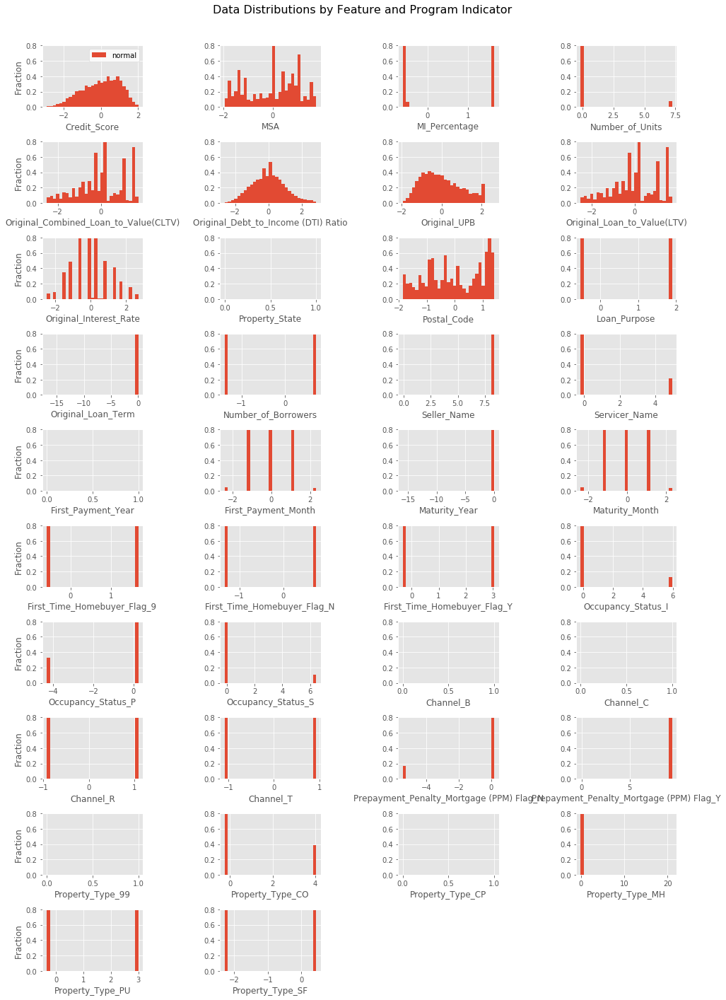

In [51]:
axarr = [[]]*len(data_cols)
columns = 4
rows = int( np.ceil( len(data_cols) / columns ) )
f, fig = plt.subplots( figsize=(columns*3.5, rows*2) )

f.suptitle('Data Distributions by Feature and Program Indicator', size=16)

for i, col in enumerate(data_cols[:]):
    axarr[i] = plt.subplot2grid( (int(rows), int(columns)), (int(i//columns), int(i%columns)) )
    axarr[i].hist( [ data[col]], label=['normal','fraud'], 
                          bins=np.linspace( np.percentile(data[col],0.1), np.percentile(data[col],99.9), 30 ),
                          normed=True )
    axarr[i].set_xlabel(col, size=12)
    axarr[i].set_ylim([0,0.8])
    axarr[i].tick_params(axis='both', labelsize=10)
    if i == 0: 
        legend = axarr[i].legend()
        legend.get_frame().set_facecolor('white')
    if i%4 != 0 : 
        axarr[i].tick_params(axis='y', left='off', labelleft='off')
    else:
        axarr[i].set_ylabel('Fraction',size=12)

plt.tight_layout(rect=[0,0,1,0.95]) # xmin, ymin, xmax, ymax
# plt.savefig('plots/Engineered_Data_Distributions.png')
plt.show()

In [52]:
#data['Prepayment_Penalty_Mortgage (PPM) Flag']= pd.get_dummies(data['Prepayment_Penalty_Mortgage (PPM) Flag'])
#print(data['Prepayment_Penalty_Mortgage (PPM) Flag'].head())

In [53]:
pickle.dump(data, open('data/' + 'credicard.engineered.pk4','wb'))

In [54]:
test_cols = data.columns[ (data.columns != 'Loan_Sequence_Number') & (data.columns != 'Program_Indicator') ]
print(len(test_cols))
print(test_cols)

38
Index(['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units',
       'Original_Combined_Loan_to_Value(CLTV)',
       'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB',
       'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate',
       'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term',
       'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name',
       'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year',
       'Maturity_Month', 'First_Time_Homebuyer_Flag_9',
       'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y',
       'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S',
       'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T',
       'Prepayment_Penalty_Mortgage (PPM) Flag_N',
       'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99',
       'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH',
       'Property_Type_PU', 'Property_Type_SF'],
      dtype='object')


In [55]:
from sklearn.metrics import recall_score, precision_score, roc_auc_score

def recall(preds, dtrain):
    labels = dtrain.get_label()
    return 'recall',  recall_score(labels, np.round(preds))

def precision(preds, dtrain):
    labels = dtrain.get_label()
    return 'precision',  precision_score(labels, np.round(preds))

def roc_auc(preds, dtrain):
    labels = dtrain.get_label()
    return 'roc_auc',  roc_auc_score(labels, preds)

In [56]:
data.isnull().sum().sum()
data.shape
data.columns

Index(['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units',
       'Original_Combined_Loan_to_Value(CLTV)',
       'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB',
       'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate',
       'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term',
       'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name',
       'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year',
       'Maturity_Month', 'First_Time_Homebuyer_Flag_9',
       'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y',
       'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S',
       'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T',
       'Prepayment_Penalty_Mortgage (PPM) Flag_N',
       'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99',
       'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH',
       'Property_Type_PU', 'Property_Type_SF'],
      dtype='object')

In [57]:
import sklearn.cluster as cluster

data['Program_Indicator']= np.ones(data.shape[0])
train = data.copy()

algorithm = cluster.KMeans
args, kwds = (), {'n_clusters':2, 'random_state':0}
labels = algorithm(*args, **kwds).fit_predict(train[ data_cols ])

print( pd.DataFrame( [ [np.sum(labels==i)] for i in np.unique(labels) ], columns=['count'], index=np.unique(labels) ) )

data_w_Program_Indicator = train.copy()
data_w_Program_Indicator['Program_Indicator'] = labels

print(data_w_Program_Indicator.head())
print(data_w_Program_Indicator['Program_Indicator'].value_counts())

    count
0  176230
1  151364
   Credit_Score       MSA  MI_Percentage  Number_of_Units  \
2      0.887198 -0.136411      -0.556016        -0.138171   
3     -0.867588  0.010301      -0.624649        -0.138171   
5      0.071018 -1.319853      -0.624649        -0.138171   
7      0.621939 -1.319853      -0.624649        -0.138171   
9      0.968816  1.253179      -0.567455        -0.138171   

   Original_Combined_Loan_to_Value(CLTV)  Original_Debt_to_Income (DTI) Ratio  \
2                               1.548900                             0.578845   
3                               0.166671                             0.120658   
5                              -1.031260                             0.303933   
7                              -0.939112                            -0.245892   
9                               1.088157                            -0.429167   

   Original_UPB  Original_Loan_to_Value(LTV)  Original_Interest_Rate  \
2      0.179155                     1.561263

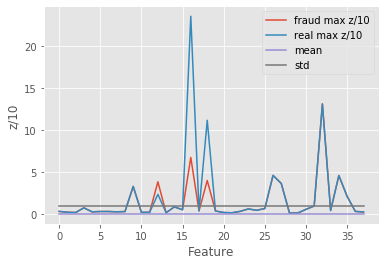

In [58]:


plot_cols = data_cols

plt.plot( data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator==1, plot_cols ].abs().max().values / data_w_Program_Indicator[ plot_cols ].std().values / 10, label='fraud max z/10' )
plt.plot( data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator==0, plot_cols ].abs().max().values / data_w_Program_Indicator[ plot_cols ].std().values / 10, label='real max z/10' )
plt.plot( data_w_Program_Indicator[ plot_cols ].mean().values, label='mean' )
# plt.plot( data[ plot_cols ].abs().mean().values, label='abs mean' )
plt.plot( data_w_Program_Indicator[ plot_cols ].std().values, label='std' )
plt.xlabel('Feature')
plt.ylabel('z/10')
plt.legend() ; 


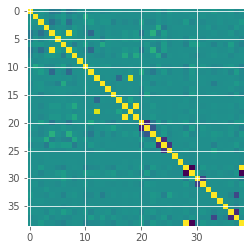

In [59]:
corr1 = data_w_Program_Indicator.corr()
plt.imshow(corr1) ;

/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:15: MatplotlibDeprecationWarning: 
The 'normed' kwarg was deprecated in Matplotlib 2.1 and will be removed in 3.1. Use 'density' instead.
  from ipykernel import kernelapp as app
/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: divide by zero encountered in true_divide
  return n/db/n.sum(), bin_edges
/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:898: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


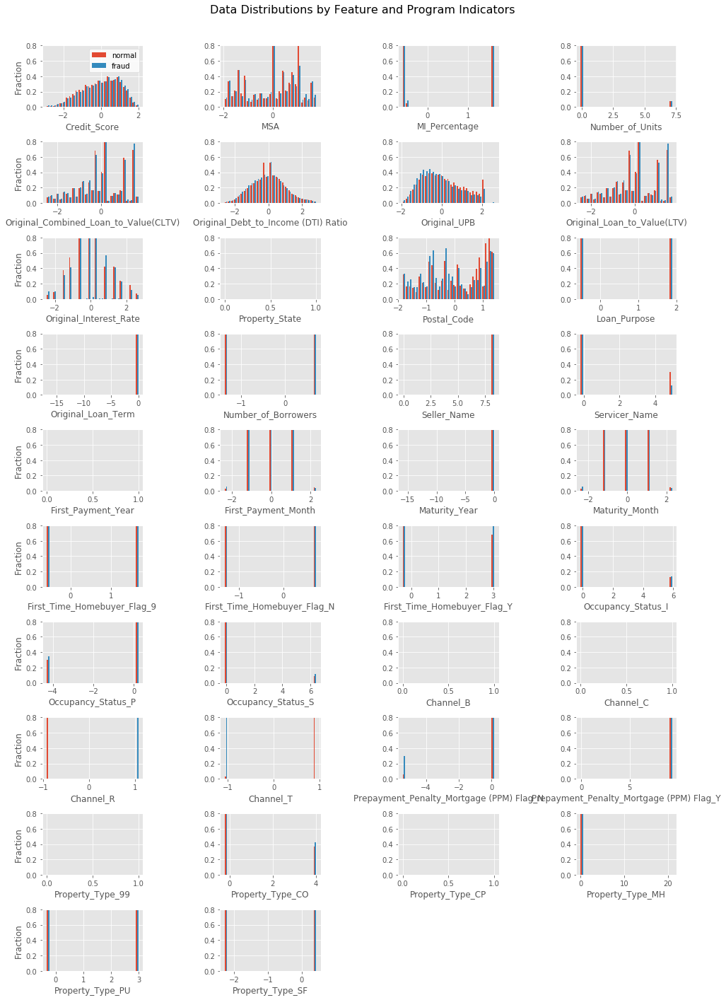

In [60]:
# Plot the data by each feature

axarr = [[]]*len(data_cols)
columns = 4
rows = int( np.ceil( len(data_cols) / columns ) )
f, fig = plt.subplots( figsize=(columns*3.5, rows*2) )

f.suptitle('Data Distributions by Feature and Program Indicators', size=16)

for i, col in enumerate(data_cols[:]):
    axarr[i] = plt.subplot2grid( (int(rows), int(columns)), (int(i//columns), int(i%columns)) )
    axarr[i].hist( [ data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator == 0, col ], 
                    data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator == 1, col ] ], label=['normal','fraud'], 
                          bins=np.linspace( np.percentile(data_w_Program_Indicator[col],0.1), np.percentile(data_w_Program_Indicator[col],99.9), 30 ),
                          normed=True )
    axarr[i].set_xlabel(col, size=12)
    axarr[i].set_ylim([0,0.8])
    axarr[i].tick_params(axis='both', labelsize=10)
    if i == 0: 
        legend = axarr[i].legend()
        legend.get_frame().set_facecolor('white')
    if i%4 != 0 : 
        axarr[i].tick_params(axis='y', left='off', labelleft='off')
    else:
        axarr[i].set_ylabel('Fraction',size=12)

plt.tight_layout(rect=[0,0,1,0.95]) # xmin, ymin, xmax, ymax
# plt.savefig('plots/Engineered_Data_Distributions.png')
plt.show()

In [61]:
pickle.dump(data, open('data/' + 'credicard.engineered.pk4_w_Program_Indicator','wb'))

In [62]:
# Define some custom metric functions for use with the xgboost algorithm
# https://github.com/dmlc/xgboost/blob/master/demo/guide-python/custom_objective.py

from sklearn.metrics import recall_score, precision_score, roc_auc_score

def recall(preds, dtrain):
    labels = dtrain.get_label()
    return 'recall',  recall_score(labels, np.round(preds))

def precision(preds, dtrain):
    labels = dtrain.get_label()
    return 'precision',  precision_score(labels, np.round(preds))

def roc_auc(preds, dtrain):
    labels = dtrain.get_label()
    return 'roc_auc',  roc_auc_score(labels, preds)

In [63]:
data_w_Program_Indicator.columns

Index(['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units',
       'Original_Combined_Loan_to_Value(CLTV)',
       'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB',
       'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate',
       'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term',
       'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name',
       'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year',
       'Maturity_Month', 'First_Time_Homebuyer_Flag_9',
       'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y',
       'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S',
       'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T',
       'Prepayment_Penalty_Mortgage (PPM) Flag_N',
       'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99',
       'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH',
       'Property_Type_PU', 'Property_Type_SF', 'Program_Indicator'],
      dtype='object')

In [64]:
np.random.seed(0)

n_real = np.sum(data_w_Program_Indicator.Program_Indicator==0) # 200000
n_test = np.sum(data_w_Program_Indicator.Program_Indicator==1) # 492
train_fraction = 0.7
fn_real = int(n_real * train_fraction)
fn_test = int(n_test * train_fraction)

real_samples = data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator==0, data_w_Program_Indicator.columns].sample(n_real, replace=False).reset_index(drop=True)
test_samples = data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator==1, data_w_Program_Indicator.columns].sample(n_test, replace=False).reset_index(drop=True)
print("real samples column", real_samples.columns)
train_df = pd.concat([real_samples[:fn_real],test_samples[:fn_test]],axis=0,ignore_index=True).reset_index(drop=True)
# train_df = pd.concat([real_samples[:fn_test],test_samples[:fn_test]],axis=0,ignore_index=True).reset_index(drop=True)

test_df = pd.concat([real_samples[fn_real:],test_samples[fn_test:]],axis=0,ignore_index=True).reset_index(drop=True)
print( 'classes 0, 1: ', n_real, n_test )
print( 'train, test: ', len(train_df), len(test_df) )

#output1 = pd.concat(pd.DataFrame(np.zeros(fn_real-1)), pd.DataFrame(np.ones(fn_test-1)))
#output2 = pd.concat(pd.DataFrame(np.zeros(n_real-fn_real+1)), pd.DataFrame(np.ones(n_test-fn_test+1)))

X_col = test_df.columns[:-1]
y_col = test_df.columns[-1]
dtrain = xgb.DMatrix(train_df[X_col], train_df[y_col], feature_names=X_col)
dtest = xgb.DMatrix(test_df[X_col], test_df[y_col], feature_names=X_col)


real samples column Index(['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units',
       'Original_Combined_Loan_to_Value(CLTV)',
       'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB',
       'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate',
       'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term',
       'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name',
       'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year',
       'Maturity_Month', 'First_Time_Homebuyer_Flag_9',
       'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y',
       'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S',
       'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T',
       'Prepayment_Penalty_Mortgage (PPM) Flag_N',
       'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99',
       'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH',
       'Property_Type_PU', 'Property_Type_SF', 'Program_Indicator'],
      dtype='obj

In [65]:

results_dict = {}
xgb_params = {
#     'max_depth': 4,
    'objective': 'binary:logistic',
    'random_state': 0,
    'eval_metric': 'auc', # auc, error
#     'tree_method': 'hist'
#     'grow_policy': 'lossguide' # depthwise, lossguide
}

xgb_test = xgb.train(xgb_params, dtrain, num_boost_round=100, 
                     verbose_eval=False,
                     early_stopping_rounds=20, 
                     evals=[(dtrain,'train'),(dtest,'test')],
                     evals_result = results_dict,              
                     feval = recall, maximize=True
#                      feval = roc_auc, maximize=True
                    )

y_pred = xgb_test.predict(dtest, ntree_limit=xgb_test.best_iteration+1)
y_true = test_df['Program_Indicator'].values
print( 'best iteration: ', xgb_test.best_iteration )
print( recall( y_pred, dtest ) )
print( precision( y_pred, dtest ) )
print( roc_auc( y_pred, dtest ) )

best iteration:  10
('recall', 0.9999779784188505)
('precision', 0.9999779784188505)
('roc_auc', 0.9999999975008608)


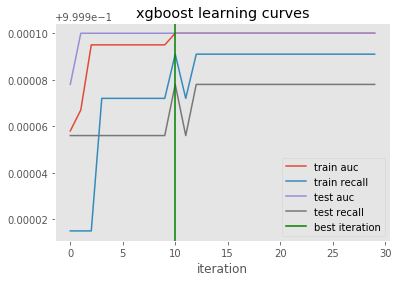

In [66]:
# Let's look at how the metrics changed on the train and test sets as more trees were added

for i in results_dict:
    for err in results_dict[i]:
        plt.plot(results_dict[i][err], label=i+' '+err)   
plt.axvline(xgb_test.best_iteration, c='green', label='best iteration')
plt.xlabel('iteration')
# plt.ylabel(err)
plt.title('xgboost learning curves')
plt.legend()
plt.grid() ;

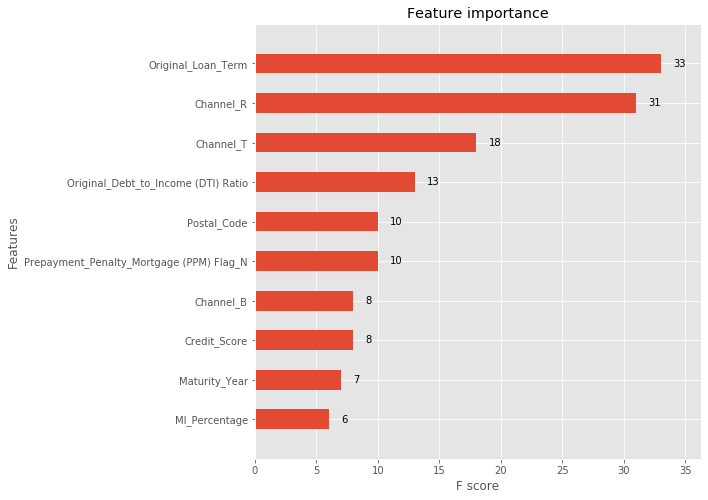

In [67]:
# Plot feature importances

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
xgb.plot_importance(xgb_test, max_num_features=10, height=0.5, ax=ax);

In [68]:
# Generate list of features sorted by importance in detecting fraud
# https://stackoverflow.com/questions/613183/sort-a-python-dictionary-by-value

import operator
x = xgb_test.get_fscore()
sorted_x = sorted(x.items(), key=operator.itemgetter(1), reverse=True)

# print( 'Top eight features for fraud detection: ', [ i[0] for i in sorted_x[:8] ] )

sorted_cols = [i[0] for i in sorted_x] + ['Program_Indicator']
print( sorted_cols )

['Original_Loan_Term', 'Channel_R', 'Channel_T', 'Original_Debt_to_Income (DTI) Ratio', 'Prepayment_Penalty_Mortgage (PPM) Flag_N', 'Postal_Code', 'Credit_Score', 'Channel_B', 'Maturity_Year', 'MI_Percentage', 'Original_UPB', 'MSA', 'Original_Interest_Rate', 'Original_Combined_Loan_to_Value(CLTV)', 'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Program_Indicator']


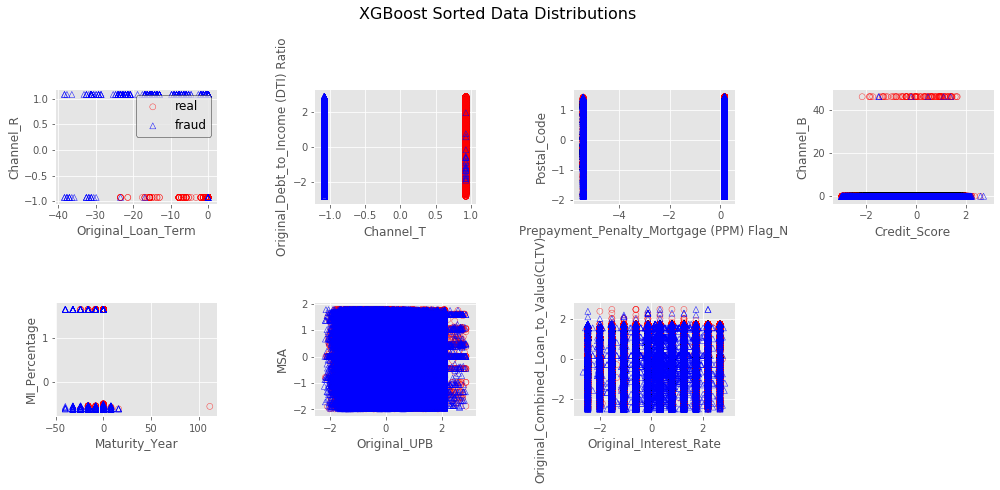

In [69]:
# Plot all of the training data with paired features sorted by importance
# This takes a while

colors = ['red','blue']
markers = ['o','^']
labels = ['real','fraud']
alphas = [0.7, 0.9]

columns = 4
rows = int( np.ceil( len(data_cols) / columns / 2 ) )
plt.figure( figsize=(columns*3.5, rows*3) )
plt.suptitle('XGBoost Sorted Data Distributions ', size=16)

train = train_df.copy()

for i in range( int(np.floor(len(sorted_x)/2)) )[:]:
    col1, col2 = sorted_x[i*2][0], sorted_x[i*2+1][0]
#     print(i,col1,col2)
    
    plt.subplot(rows,columns,i+1)  
    for group, color, marker, label, alpha in zip( train.groupby('Program_Indicator'), colors, markers, labels, alphas ):
        plt.scatter( group[1][col1], group[1][col2], 
                         label=label, marker=marker, alpha=alpha,
                         edgecolors=color, facecolors='none' )         
    plt.xlabel(col1, size=12)
    plt.ylabel(col2, size=12)
    plt.tick_params(axis='both', labelsize=10)
    if i == 0: plt.legend(fontsize=12, edgecolor='black')

plt.tight_layout(rect=[0,0,1,0.95]) # xmin, ymin, xmax, ymax
# plt.savefig('plots/XGB_Sorted_Data_Distributions.png')
plt.show()

In [70]:
# Lets look at the effect of the ratio of normal:fraud data in the dataset on recall and roc_auc
# We'll use cross validation to see if differences are significant


np.random.seed(0)

n_real = np.sum(data_w_Program_Indicator.Program_Indicator==0) 
n_test = np.sum(data_w_Program_Indicator.Program_Indicator==1)
real_samples = data

In [71]:
# Lets look at the effect of the ratio of normal:fraud data in the dataset on recall and roc_auc
# We'll use cross validation to see if differences are significant


np.random.seed(0)

n_real = np.sum(data_w_Program_Indicator.Program_Indicator==0) 
n_test = np.sum(data_w_Program_Indicator.Program_Indicator==1)
real_samples = data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator==0, data_w_Program_Indicator.columns].sample(n_real, replace=False).reset_index(drop=True)
test_samples = data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator==1, data_w_Program_Indicator.columns].sample(n_test, replace=False).reset_index(drop=True)
X_col = data_w_Program_Indicator.columns[:-1]
y_col = data_w_Program_Indicator.columns[-1]

test_data=[]

# for i in [1]:
# for i in [0.1,0.5,1,2,10]:
for i in np.logspace(-1,2,8):
    print(i)
    train_df = pd.concat([real_samples[:int(n_test*i)],test_samples[:n_test]],axis=0,ignore_index=True).reset_index(drop=True)
    dtrain = xgb.DMatrix(train_df[X_col], train_df[y_col], feature_names=X_col)
    results = xgb.cv(xgb_params, dtrain, 
                     nfold=5, num_boost_round=100, early_stopping_rounds=10, seed=0,
                     feval=recall)
    test_data.append(list([i]) + list(results.tail(1).index) + list(results.tail(1).values[0]))
    
test_data = pd.DataFrame(test_data, columns=list(['ratio','best'])+list(results.columns))
test_data

0.1
0.2682695795279726
0.7196856730011519
1.9306977288832496
5.17947467923121
13.894954943731374
37.27593720314938
100.0


,ratio,best,train-auc-mean,train-auc-std,test-auc-mean,test-auc-std,train-recall-mean,train-recall-std,test-recall-mean,test-recall-std
0,0.100000,0,0.999997,0.000002,0.999993,0.000008,0.999990,0.000008,0.999980,0.000016
1,0.268270,8,1.000000,0.000000,0.999997,0.000007,0.999990,0.000004,0.999980,0.000016
2,0.719686,0,0.999976,0.000003,0.999973,0.000013,0.999944,0.000012,0.999927,0.000032
3,1.930698,0,0.999976,0.000004,0.999967,0.000015,0.999934,0.000007,0.999927,0.000038
4,5.179475,0,0.999976,0.000004,0.999967,0.000015,0.999934,0.000007,0.999927,0.000038
5,13.894955,0,0.999976,0.000004,0.999967,0.000015,0.999934,0.000007,0.999927,0.000038
6,37.275937,0,0.999976,0.000004,0.999967,0.000015,0.999934,0.000007,0.999927,0.000038
7,100.000000,0,0.999976,0.000004,0.999967,0.000015,0.999934,0.000007,0.999927,0.000038


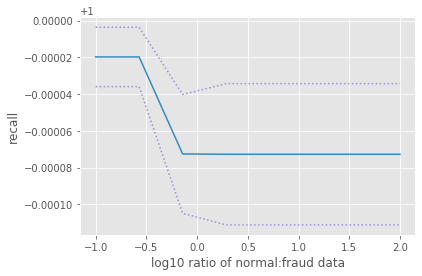

In [72]:

# Recall decreases as more normal data is added

# metric = 'auc'
metric = 'recall'
# xs = test_data['ratio'].values
xs = np.log10(test_data['ratio'].values)
ys = test_data['test-'+metric+'-mean'].values
stds = test_data['test-'+metric+'-std'].values
plt.plot(xs,ys,c='C1')
plt.plot(xs,ys+stds,linestyle=':',c='C2')
plt.plot(xs,ys-stds,linestyle=':',c='C2')
plt.xlabel('log10 ratio of normal:fraud data')
plt.ylabel(metric)
# plt.ylim([0.96,1.01])
plt.show()

In [73]:
import sklearn.cluster as cluster
!pip install hdbscan
import hdbscan

You should consider upgrading via the '/Users/melaniequ/opt/anaconda3/bin/python -m pip install --upgrade pip' command.


In [74]:
train = data_w_Program_Indicator.loc[ data_w_Program_Indicator['Program_Indicator']==1 ].copy()

print( pd.DataFrame( [ [np.sum(train['Program_Indicator']==i)] for i in np.unique(train['Program_Indicator']) ], 
                    columns=['count'], index=np.unique(train['Program_Indicator']) ) )
# Here, we verified that the train data is consists of 1s

# train = pd.get_dummies(train, columns=['Class'], prefix='Class')
label_cols = [ i for i in train.columns if 'Program_Indicator' in i ]
data_cols = [ i for i in train.columns if i not in label_cols ]

#Here, we only copied the data with all columns except for class
train_no_label = train[ data_cols ]


    count
1  151364


In [ ]:
#%%time

# TSNE is an interesting method to map higher dimensional data into two dimensions
# http://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html

# Note TSNE map may not be what you might think:
# https://distill.pub/2016/misread-tsne/

# Create multiple projections to compare results from different random states

# A way to decompress the high dimensional data to 2D data

#from sklearn.manifold import TSNE

#projections = [ TSNE(random_state=i).fit_transform(train_no_label) for i in range(3) ]

In [76]:
#%%time 

# We have 3 different clustering algorithms and store them and their properties in an array called algorithms

# Now we'll compare some different clustering algorithms
# https://github.com/scikit-learn-contrib/hdbscan/blob/master/docs/comparing_clustering_algorithms.rst

#algorithms = [ 
#     [ 'KMeans', cluster.KMeans, (), {'random_state':0} ],
#    [ 'KMeans', cluster.KMeans, (), {'n_clusters':2, 'random_state':0} ],
#     [ 'KMeans 3', cluster.KMeans, (), {'n_clusters':3, 'random_state':0} ],
#     [ 'Agglomerative', cluster.AgglomerativeClustering, (), {} ],
#    [ 'Agglomerative', cluster.AgglomerativeClustering, (), {'linkage': 'ward', 'n_clusters': 3} ],
#     [ 'Agg. Ave 3', cluster.AgglomerativeClustering, (), {'linkage': 'average', 'n_clusters': 3} ],
#     [ 'Agg. Complete 3', cluster.AgglomerativeClustering, (), {'linkage': 'complete', 'n_clusters': 3} ],
#     [ 'DBSCAN', cluster.DBSCAN, (), {'eps':0.025} ],
#     [ 'HDBSCAN', hdbscan.HDBSCAN, (), {} ],
#    [ 'HDBSCAN', hdbscan.HDBSCAN, (), {'min_cluster_size':10, 'min_samples':1, } ],
#     [ 'HDBSCAN 2 10', hdbscan.HDBSCAN, (), {'min_cluster_size':2, 'min_samples':10, } ],
#     [ 'HDBSCAN 10 10 ', hdbscan.HDBSCAN, (), {'min_cluster_size':10, 'min_samples':10, } ],
#]

# Here we plot the algorithms according to the data

#rows = len(algorithms)
#columns = 4
#plt.figure(figsize=(columns*3, rows*3))

#for i, [name, algorithm, args, kwds] in enumerate(algorithms):
#    print(i, name)

#    labels = algorithm(*args, **kwds).fit_predict(train_no_label)
#     labels = algorithm(*args, **kwds).fit_predict(projections[0])
    
#     print( pd.DataFrame( [ [np.sum(labels==i)] for i in np.unique(labels) ], columns=['count'], index=np.unique(labels) ) )
    
#    colors = np.clip(labels,-1,9)
#    colors = [ 'C'+str(i) if i>-1 else 'black' for i in colors ]
    
#    plt.subplot(rows,columns,i*columns+1)
#    plt.scatter(train_no_label[data_cols[0]], train_no_label[data_cols[1]], c=colors)
#    plt.xlabel(data_cols[0]), plt.ylabel(data_cols[1])
#    plt.title(name)

#    for j in range(3):
#        plt.subplot(rows,columns,i*columns+1+j+1)
#        plt.scatter(*(projections[j].T), c=colors) 
#        plt.xlabel('x'), plt.ylabel('y')
#        plt.title('TSNE projection '+str(j+1),size=12)
        
#     break

#plt.suptitle('Comparison of Fraud Clusters', size=16)
#plt.tight_layout(rect=[0,0,1,0.95])
#plt.savefig('plots/Fraud_Cluster_Diagram.png')
#plt.show()

# We have in each row, (name of the algorithm), TSNE Projection 1, TSNE Projection 2, and TSNE Projection 3

In [75]:
dtrain = xgb.DMatrix(data_w_Program_Indicator[data_cols], data_w_Program_Indicator['Program_Indicator'], feature_names=data_cols)

xgb_params = {
    'objective': 'binary:logistic',
    'random_state': 0,
    'eval_metric': 'auc', # allows for balanced or unbalanced classes 
    }
xgb_test = xgb.train(xgb_params, dtrain, num_boost_round=10) # limit to ten rounds for fast evaluation

import operator
x = xgb_test.get_fscore()
sorted_x = sorted(x.items(), key=operator.itemgetter(1), reverse=True)
print( 'Top eight features: ', [ [i[0],i[1]] for i in sorted_x[:8] ] )


Top eight features:  [['Original_Loan_Term', 20], ['Channel_R', 10], ['Channel_B', 7], ['Prepayment_Penalty_Mortgage (PPM) Flag_N', 6], ['Original_Interest_Rate', 4], ['Original_Debt_to_Income (DTI) Ratio', 3], ['Credit_Score', 3], ['Original_UPB', 1]]


In [76]:
import GAN_171103_original
import importlib
importlib.reload(GAN_171103_original) # For reloading after making changes
from GAN_171103_original import *

rand_dim = 32 # 32 # needs to be ~data_dim
base_n_count = 128 # 128

nb_steps = 5000 + 1 # 50000 # Add one for logging of the last interval
batch_size = 128 # 64

k_d = 1  # number of critic network updates per adversarial training step
k_g = 1  # number of generator network updates per adversarial training step
critic_pre_train_steps = 100 # 100  # number of steps to pre-train the critic before starting adversarial training
log_interval = 100 # 100  # interval (in steps) at which to log loss summaries and save plots of image samples to disc
learning_rate = 5e-4 # 5e-5
data_dir = 'cache_updated_2/'
generator_model_path, discriminator_model_path, loss_pickle_path = None, None, None

# show = False
show = True 

# train = create_toy_spiral_df(1000)
# train = create_toy_df(n=1000,n_dim=2,n_classes=4,seed=0)
train = data_w_Program_Indicator.copy().reset_index(drop=True) # fraud only with labels from classification, used for shuffling

# train = pd.get_dummies(train, columns=['Class'], prefix='Class', drop_first=True)
label_cols = [ i for i in train.columns if 'Program_Indicator' in i ]
data_cols = [ i for i in train.columns if i not in label_cols ]
train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

Using TensorFlow backend.
/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/Users/melaniequ/opt/anaconda3/l

data_dim:  38
data_cols:  ['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units', 'Original_Combined_Loan_to_Value(CLTV)', 'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB', 'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate', 'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term', 'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name', 'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year', 'Maturity_Month', 'First_Time_Homebuyer_Flag_9', 'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y', 'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S', 'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T', 'Prepayment_Penalty_Mortgage (PPM) Flag_N', 'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99', 'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH', 'Property_Type_PU', 'Property_Type_SF']
Instructions for updating:
Colocations handled automatically by placer.
________________________________________________________________

/Users/melaniequ/opt/anaconda3/lib/python3.7/site-packages/keras/engine/training.py:973: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


Instructions for updating:
Use tf.cast instead.
Step: 0 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.6601, 0.7532, 0.6796, 1.0000
D Real - D Gen: -0.0736


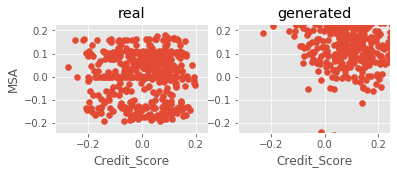

Step: 100 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.6966, 0.7668, 0.5670, 1.0000
D Real - D Gen: -0.1998


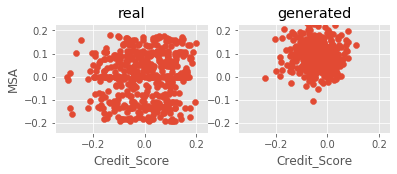

Step: 200 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.8040, 0.6834, 0.6534, 0.9980
D Real - D Gen: -0.0300


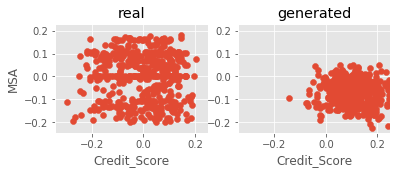

Step: 300 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.9220, 0.5925, 0.6467, 0.9959
D Real - D Gen: 0.0542


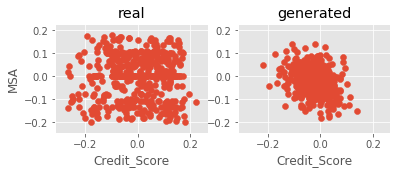

Step: 400 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.8317, 0.6991, 0.6422, 1.0000
D Real - D Gen: -0.0569


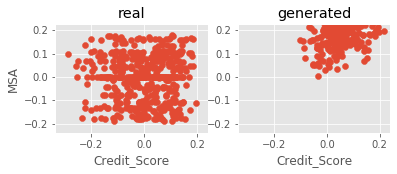

Step: 500 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.0730, 0.5425, 0.6275, 1.0000
D Real - D Gen: 0.0850


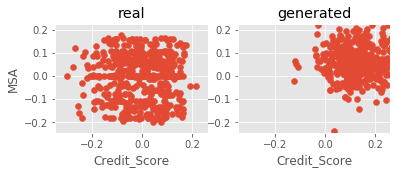

Step: 600 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.1911, 0.5071, 0.5750, 1.0000
D Real - D Gen: 0.0679


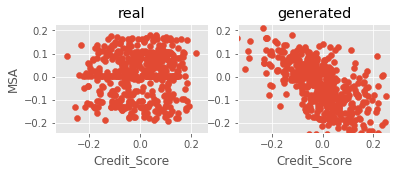

Step: 700 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.4382, 0.5059, 0.5026, 0.9959
D Real - D Gen: -0.0033


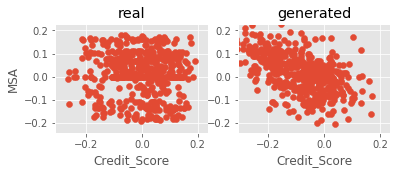

Step: 800 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.7467, 0.3123, 0.5170, 0.9939
D Real - D Gen: 0.2047


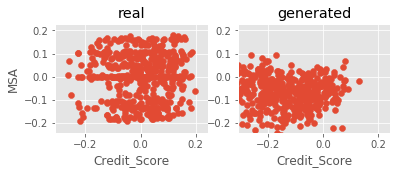

Step: 900 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.6042, 0.4432, 0.4809, 0.9919
D Real - D Gen: 0.0376


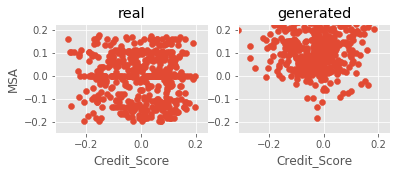

Step: 1000 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.8896, 0.3017, 0.4889, 1.0000
D Real - D Gen: 0.1872


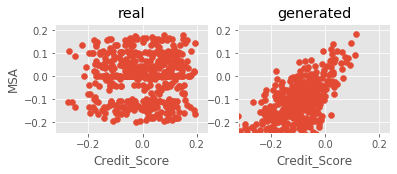

Step: 1100 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.8549, 0.4138, 0.4869, 0.9980
D Real - D Gen: 0.0731


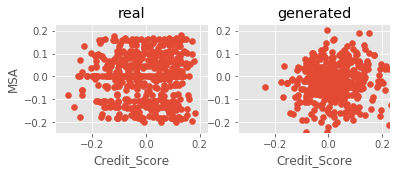

Step: 1200 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.2834, 0.2761, 0.3450, 0.9980
D Real - D Gen: 0.0689


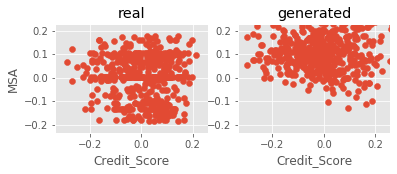

Step: 1300 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.0908, 0.4410, 0.4457, 0.9939
D Real - D Gen: 0.0047


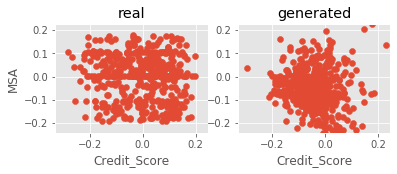

Step: 1400 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.3751, 0.2370, 0.4399, 1.0000
D Real - D Gen: 0.2029


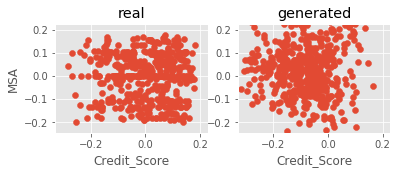

Step: 1500 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.3137, 0.3264, 0.4386, 0.9959
D Real - D Gen: 0.1123


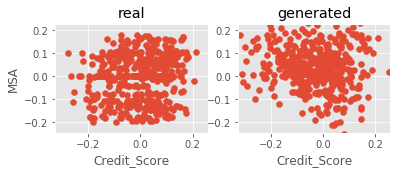

Step: 1600 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.5168, 0.2515, 0.3472, 0.9980
D Real - D Gen: 0.0957


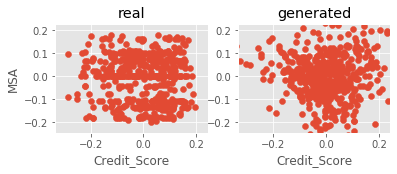

Step: 1700 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.6749, 0.3222, 0.3456, 0.9858
D Real - D Gen: 0.0235


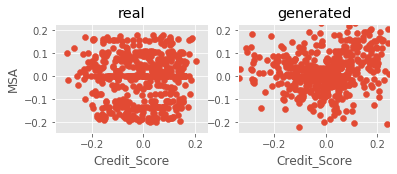

Step: 1800 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.7307, 0.2557, 0.3190, 0.9959
D Real - D Gen: 0.0633


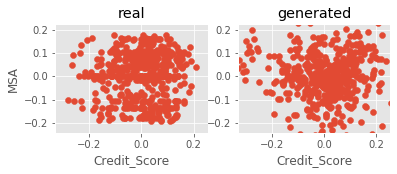

Step: 1900 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.1142, 0.1219, 0.2627, 1.0000
D Real - D Gen: 0.1408


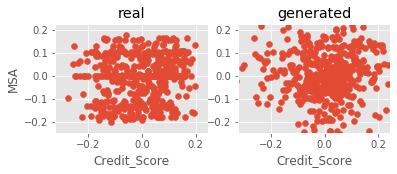

Step: 2000 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.2339, 0.1766, 0.2615, 0.9919
D Real - D Gen: 0.0849


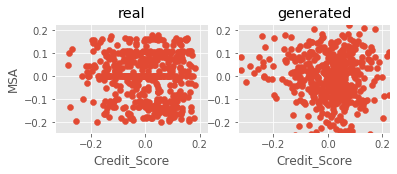

Step: 2100 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.2434, 0.1296, 0.3326, 0.9939
D Real - D Gen: 0.2030


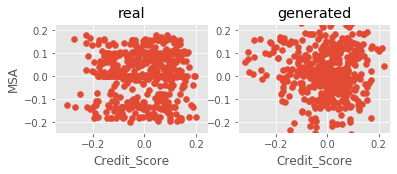

Step: 2200 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.4800, 0.1426, 0.2353, 0.9858
D Real - D Gen: 0.0927


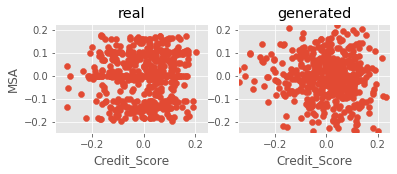

Step: 2300 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.2079, 0.0944, 0.3367, 0.9939
D Real - D Gen: 0.2423


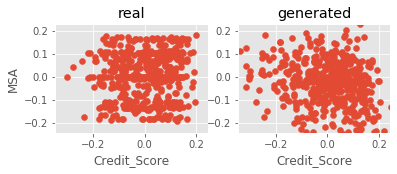

Step: 2400 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.5057, 0.1236, 0.2379, 1.0000
D Real - D Gen: 0.1143


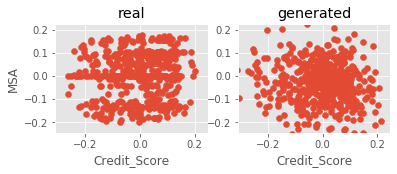

Step: 2500 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.7572, 0.2238, 0.1665, 0.9980
D Real - D Gen: -0.0572


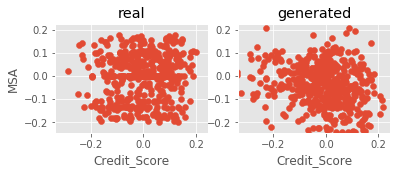

Step: 2600 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.6046, 0.1101, 0.1282, 1.0000
D Real - D Gen: 0.0181


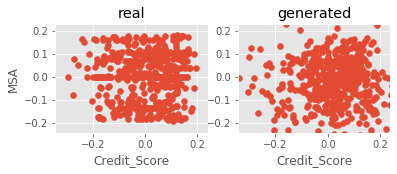

Step: 2700 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.9461, 0.0430, 0.1223, 0.9980
D Real - D Gen: 0.0792


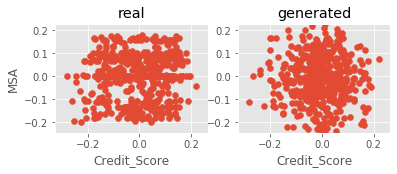

Step: 2800 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.9988, 0.0406, 0.3052, 0.9939
D Real - D Gen: 0.2646


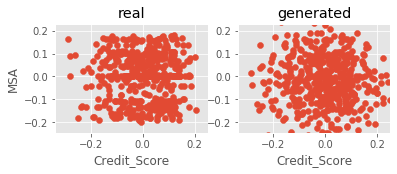

Step: 2900 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.9966, 0.0221, 0.1882, 1.0000
D Real - D Gen: 0.1661


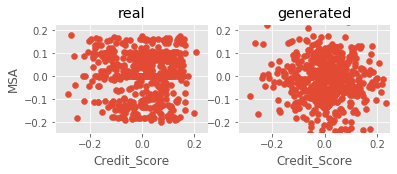

Step: 3000 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.5458, 0.3701, 0.0825, 0.9959
D Real - D Gen: -0.2876


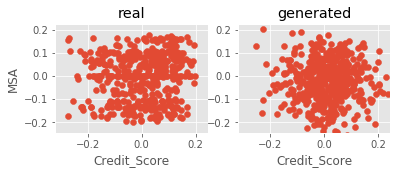

Step: 3100 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.7832, 0.0714, 0.2204, 1.0000
D Real - D Gen: 0.1490


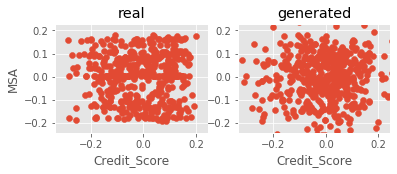

Step: 3200 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.6759, 0.1755, 0.1188, 0.9980
D Real - D Gen: -0.0567


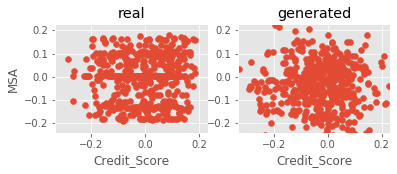

Step: 3300 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.5567, 0.2104, 0.0821, 1.0000
D Real - D Gen: -0.1283


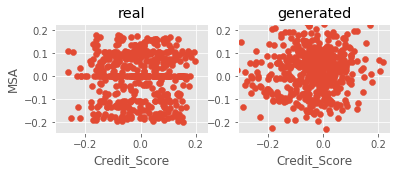

Step: 3400 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.3919, 0.1052, 0.1202, 0.9959
D Real - D Gen: 0.0150


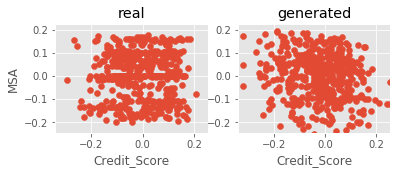

Step: 3500 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.1065, 0.0852, 0.1513, 1.0000
D Real - D Gen: 0.0661


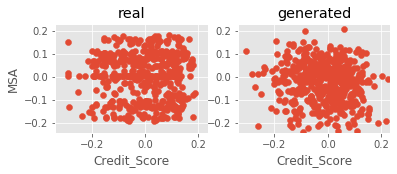

Step: 3600 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.9737, 0.0509, 0.2826, 0.9959
D Real - D Gen: 0.2317


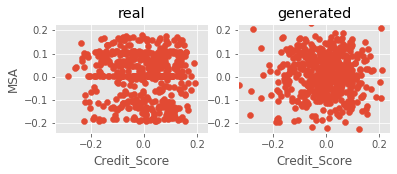

Step: 3700 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.7992, 0.0650, 0.1476, 1.0000
D Real - D Gen: 0.0826


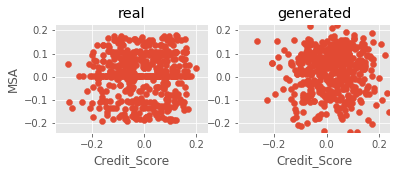

Step: 3800 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.7282, 0.0163, 0.4844, 1.0000
D Real - D Gen: 0.4681


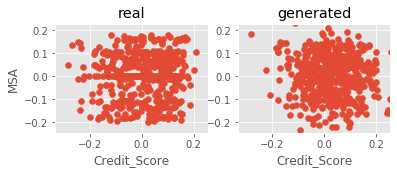

Step: 3900 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.6530, 0.1806, 0.0777, 1.0000
D Real - D Gen: -0.1029


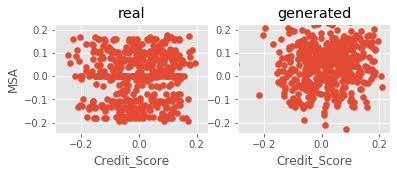

Step: 4000 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.5594, 0.0163, 0.2984, 0.9980
D Real - D Gen: 0.2820


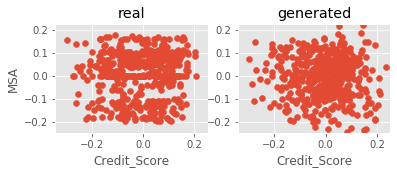

Step: 4100 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.1865, 0.0311, 0.1808, 0.9980
D Real - D Gen: 0.1497


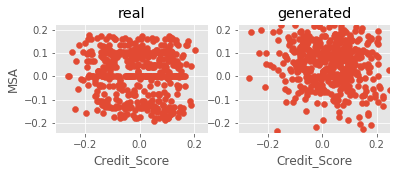

Step: 4200 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.9498, 0.0511, 0.2198, 0.9939
D Real - D Gen: 0.1687


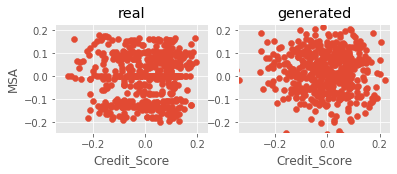

Step: 4300 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.6987, 0.0837, 0.4119, 0.9959
D Real - D Gen: 0.3282


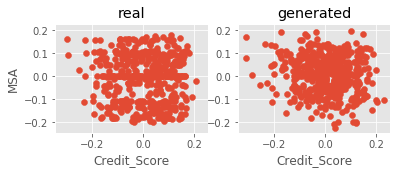

Step: 4400 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.7444, 0.0807, 0.0706, 1.0000
D Real - D Gen: -0.0100


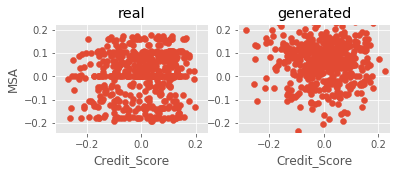

Step: 4500 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.1865, 0.0560, 0.2983, 1.0000
D Real - D Gen: 0.2423


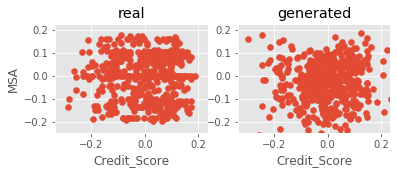

Step: 4600 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.9370, 0.0779, 0.4135, 0.9939
D Real - D Gen: 0.3357


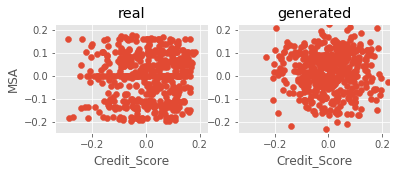

Step: 4700 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.4491, 0.0772, 0.2143, 1.0000
D Real - D Gen: 0.1370


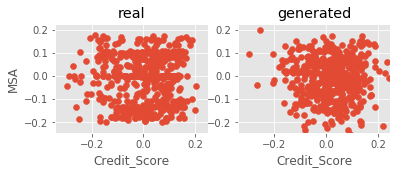

Step: 4800 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.8955, 0.0862, 0.0573, 0.9980
D Real - D Gen: -0.0289


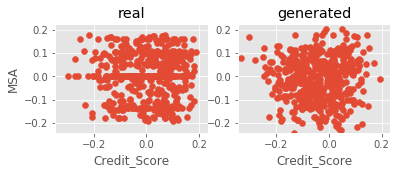

Step: 4900 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.5081, 0.0460, 0.3619, 0.9980
D Real - D Gen: 0.3159


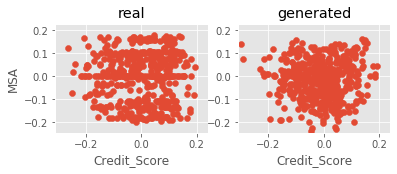

Step: 5000 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.7062, 0.0383, 0.1823, 1.0000
D Real - D Gen: 0.1440


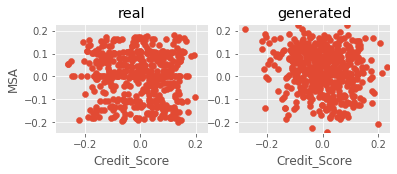

data_dim:  38
data_cols:  ['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units', 'Original_Combined_Loan_to_Value(CLTV)', 'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB', 'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate', 'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term', 'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name', 'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year', 'Maturity_Month', 'First_Time_Homebuyer_Flag_9', 'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y', 'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S', 'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T', 'Prepayment_Penalty_Mortgage (PPM) Flag_N', 'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99', 'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH', 'Property_Type_PU', 'Property_Type_SF']
label_dim:  1
label_cols:  ['Program_Indicator']
_______________________________________________________________________________________

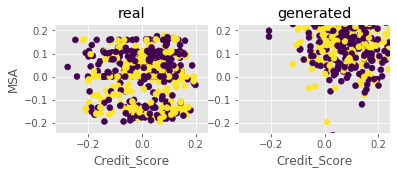

Step: 100 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.7123, 0.7157, 0.6508, 1.0000
D Real - D Gen: -0.0649


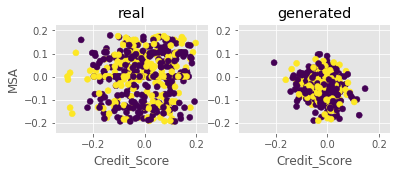

Step: 200 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.1059, 0.5365, 0.6061, 0.9980
D Real - D Gen: 0.0697


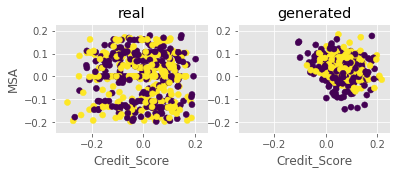

Step: 300 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.3970, 0.4302, 0.5922, 0.9959
D Real - D Gen: 0.1620


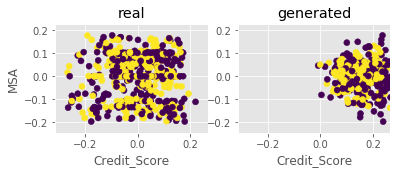

Step: 400 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.0973, 0.6086, 0.6501, 1.0000
D Real - D Gen: 0.0415


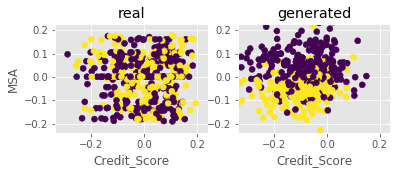

Step: 500 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.0922, 0.6551, 0.7269, 0.9980
D Real - D Gen: 0.0717


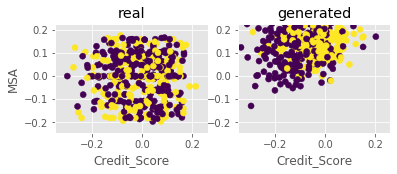

Step: 600 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.8814, 0.3800, 0.4575, 0.9980
D Real - D Gen: 0.0775


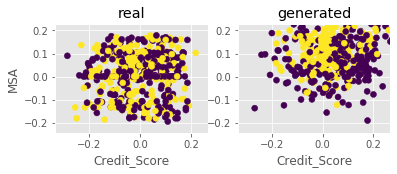

Step: 700 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.9691, 0.3361, 0.4621, 0.9898
D Real - D Gen: 0.1260


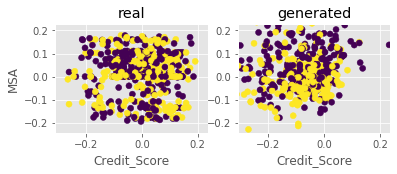

Step: 800 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.2584, 0.2429, 0.4212, 0.9980
D Real - D Gen: 0.1783


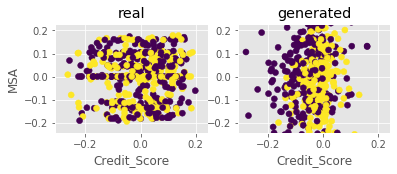

Step: 900 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.9290, 0.4084, 0.4530, 1.0000
D Real - D Gen: 0.0446


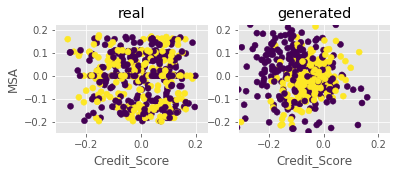

Step: 1000 of 5001.
Losses: G, D Gen, D Real, Xgb: 1.9551, 0.3677, 0.4483, 0.9959
D Real - D Gen: 0.0807


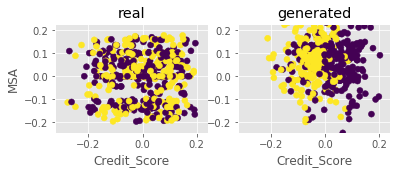

Step: 1100 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.0356, 0.4176, 0.5556, 0.9980
D Real - D Gen: 0.1380


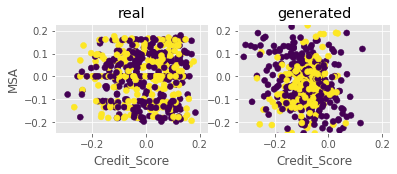

Step: 1200 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.2377, 0.3349, 0.4051, 0.9959
D Real - D Gen: 0.0703


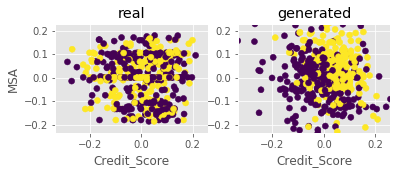

Step: 1300 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.1828, 0.3579, 0.4078, 1.0000
D Real - D Gen: 0.0499


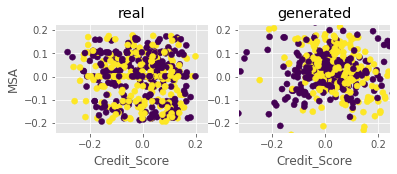

Step: 1400 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.2086, 0.3613, 0.3751, 1.0000
D Real - D Gen: 0.0138


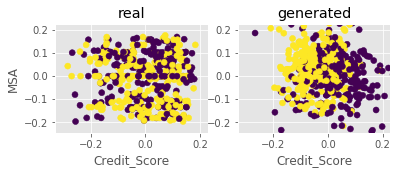

Step: 1500 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.3746, 0.2959, 0.3521, 1.0000
D Real - D Gen: 0.0562


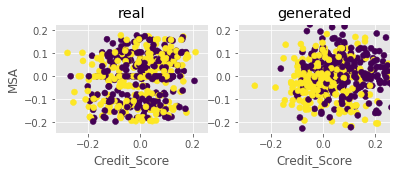

Step: 1600 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.6481, 0.3079, 0.2350, 1.0000
D Real - D Gen: -0.0729


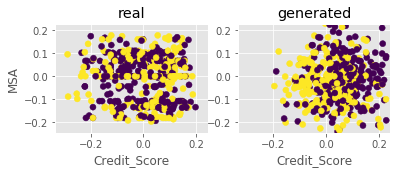

Step: 1700 of 5001.
Losses: G, D Gen, D Real, Xgb: 2.7089, 0.2309, 0.3664, 1.0000
D Real - D Gen: 0.1355


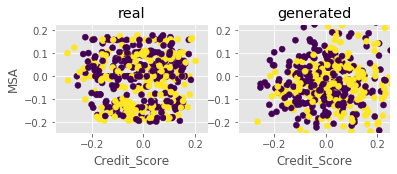

Step: 1800 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.2464, 0.3271, 0.2012, 1.0000
D Real - D Gen: -0.1259


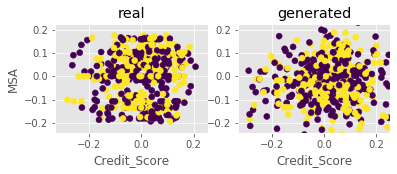

Step: 1900 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.0940, 0.3267, 0.3335, 1.0000
D Real - D Gen: 0.0069


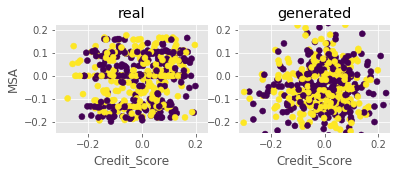

Step: 2000 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.1030, 0.2548, 0.8261, 1.0000
D Real - D Gen: 0.5714


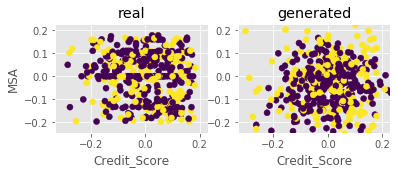

Step: 2100 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.5452, 0.0661, 0.3676, 1.0000
D Real - D Gen: 0.3015


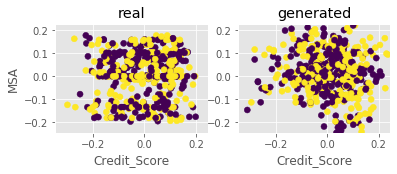

Step: 2200 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.6665, 0.0950, 0.3170, 0.9959
D Real - D Gen: 0.2221


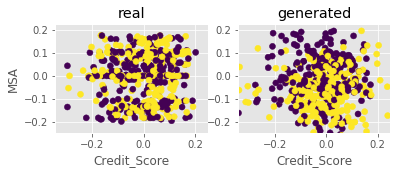

Step: 2300 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.2986, 0.1224, 0.3702, 0.9898
D Real - D Gen: 0.2477


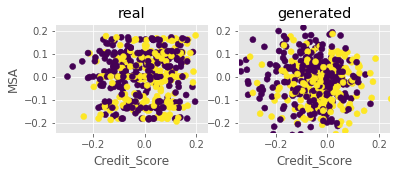

Step: 2400 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.6626, 0.1372, 0.2951, 0.9959
D Real - D Gen: 0.1579


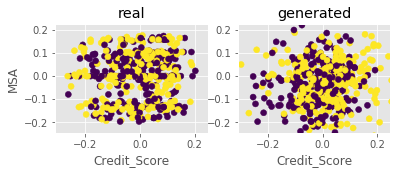

Step: 2500 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.0314, 0.1566, 0.1361, 0.9980
D Real - D Gen: -0.0206


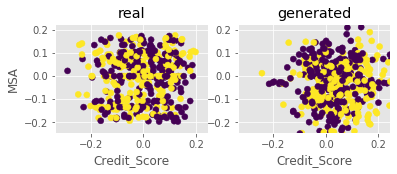

Step: 2600 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.3886, 0.1580, 0.1463, 0.9980
D Real - D Gen: -0.0117


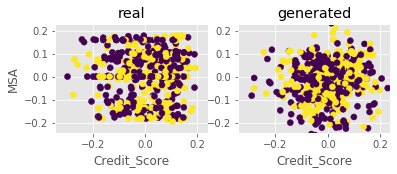

Step: 2700 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.7693, 0.3341, 0.1307, 1.0000
D Real - D Gen: -0.2034


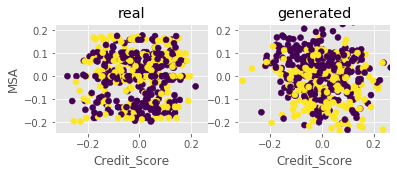

Step: 2800 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.0965, 0.1014, 0.3806, 1.0000
D Real - D Gen: 0.2793


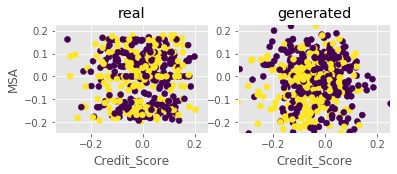

Step: 2900 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.3557, 0.2887, 0.1245, 1.0000
D Real - D Gen: -0.1643


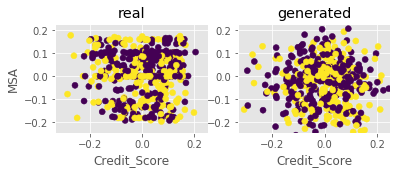

Step: 3000 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.3838, 0.3547, 0.0550, 1.0000
D Real - D Gen: -0.2997


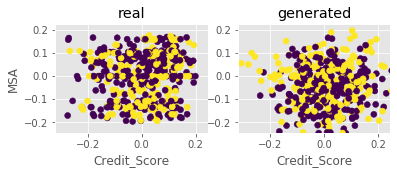

Step: 3100 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.9073, 0.0591, 0.3229, 0.9980
D Real - D Gen: 0.2638


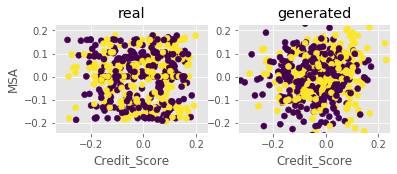

Step: 3200 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.5678, 0.0682, 0.2395, 0.9980
D Real - D Gen: 0.1713


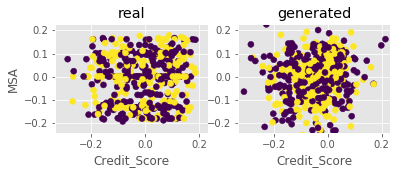

Step: 3300 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.5444, 0.0935, 0.1248, 1.0000
D Real - D Gen: 0.0313


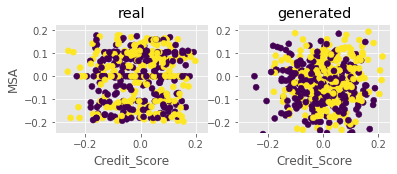

Step: 3400 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.4774, 0.3248, 0.1119, 1.0000
D Real - D Gen: -0.2129


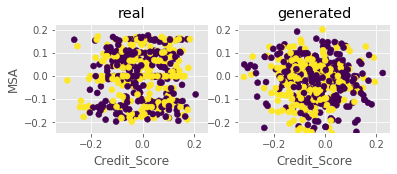

Step: 3500 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.8540, 0.3971, 0.0772, 1.0000
D Real - D Gen: -0.3199


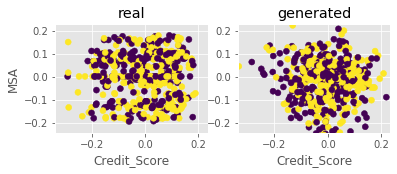

Step: 3600 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.3897, 0.0286, 0.2005, 0.9959
D Real - D Gen: 0.1719


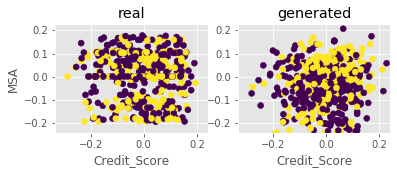

Step: 3700 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.1461, 0.1193, 0.1720, 0.9980
D Real - D Gen: 0.0527


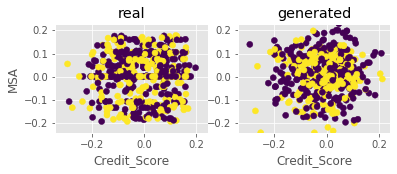

Step: 3800 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.3641, 0.1674, 0.2015, 1.0000
D Real - D Gen: 0.0341


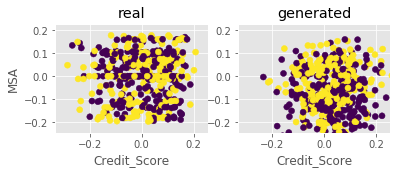

Step: 3900 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.0163, 0.0473, 0.4838, 0.9980
D Real - D Gen: 0.4366


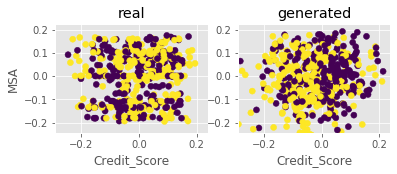

Step: 4000 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.7225, 0.0250, 0.1130, 1.0000
D Real - D Gen: 0.0880


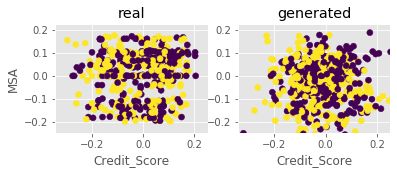

Step: 4100 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.9288, 0.2964, 0.1305, 1.0000
D Real - D Gen: -0.1660


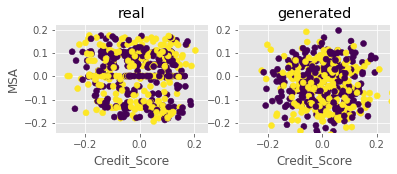

Step: 4200 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.6457, 0.0589, 0.2691, 1.0000
D Real - D Gen: 0.2102


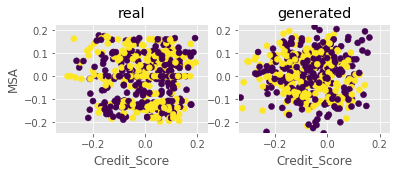

Step: 4300 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.2891, 0.0659, 0.5300, 1.0000
D Real - D Gen: 0.4642


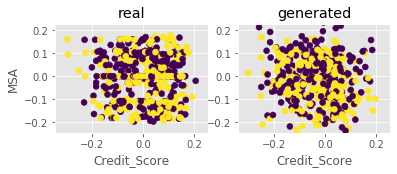

Step: 4400 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.0846, 0.0766, 0.3205, 0.9919
D Real - D Gen: 0.2439


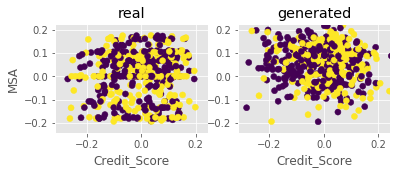

Step: 4500 of 5001.
Losses: G, D Gen, D Real, Xgb: 3.7792, 0.2066, 0.2676, 1.0000
D Real - D Gen: 0.0610


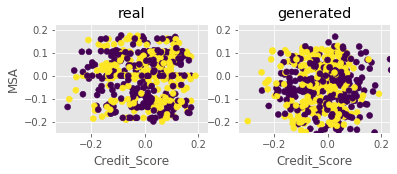

Step: 4600 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.2936, 0.0423, 0.1363, 0.9980
D Real - D Gen: 0.0940


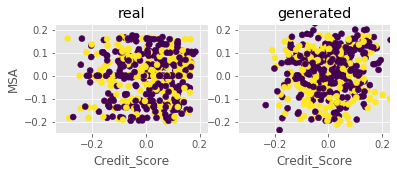

Step: 4700 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.3415, 0.0975, 0.1316, 0.9939
D Real - D Gen: 0.0341


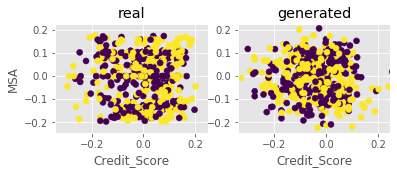

Step: 4800 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.1560, 0.0418, 0.2205, 1.0000
D Real - D Gen: 0.1787


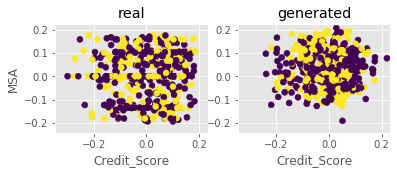

Step: 4900 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.4781, 0.0809, 0.3514, 0.9939
D Real - D Gen: 0.2705


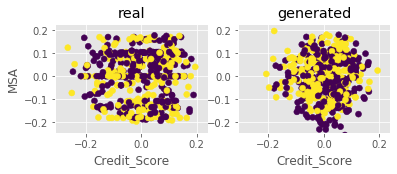

Step: 5000 of 5001.
Losses: G, D Gen, D Real, Xgb: 4.5090, 0.1237, 0.3396, 0.9959
D Real - D Gen: 0.2160


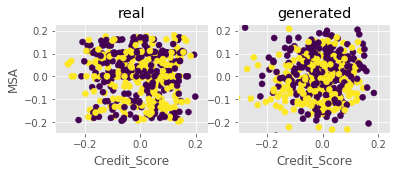

CPU times: user 47min 11s, sys: 4min 58s, total: 52min 10s
Wall time: 26min 42s


In [77]:
%%time

# Training the vanilla GAN and CGAN architectures

k_d = 1  # number of critic network updates per adversarial training step
learning_rate = 5e-4 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_GAN(arguments, train_no_label, data_cols ) # GAN
adversarial_training_GAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # CGAN

data_dim:  38
data_cols:  ['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units', 'Original_Combined_Loan_to_Value(CLTV)', 'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB', 'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate', 'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term', 'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name', 'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year', 'Maturity_Month', 'First_Time_Homebuyer_Flag_9', 'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y', 'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S', 'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T', 'Prepayment_Penalty_Mortgage (PPM) Flag_N', 'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99', 'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH', 'Property_Type_PU', 'Property_Type_SF']
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
inpu

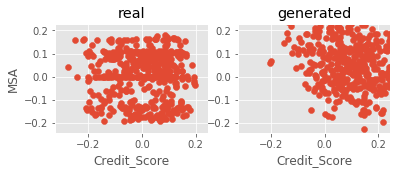

Step: 100 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0379, 0.0277, 0.0525, 0.9980
D Real - D Gen: 0.0249


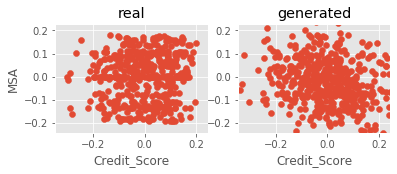

Step: 200 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0383, 0.0284, 0.0556, 0.9959
D Real - D Gen: 0.0272


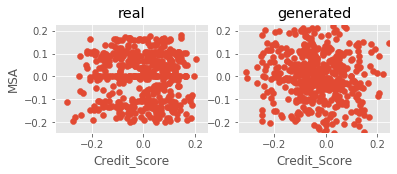

Step: 300 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0374, 0.0261, 0.0630, 1.0000
D Real - D Gen: 0.0368


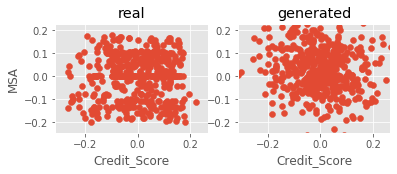

Step: 400 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0332, 0.0227, 0.0499, 0.9980
D Real - D Gen: 0.0272


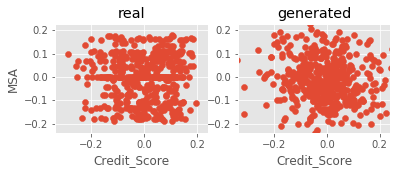

Step: 500 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0277, 0.0186, 0.0443, 1.0000
D Real - D Gen: 0.0257


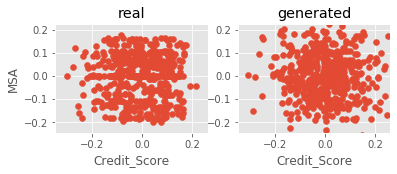

Step: 600 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0304, 0.0200, 0.0520, 1.0000
D Real - D Gen: 0.0321


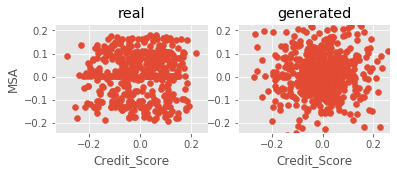

Step: 700 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0289, 0.0197, 0.0463, 1.0000
D Real - D Gen: 0.0267


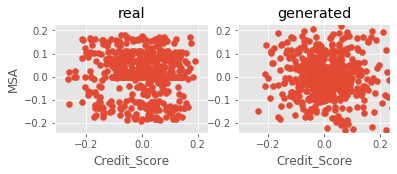

Step: 800 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0307, 0.0209, 0.0533, 0.9980
D Real - D Gen: 0.0324


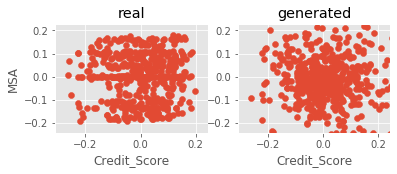

Step: 900 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0275, 0.0167, 0.0433, 0.9980
D Real - D Gen: 0.0267


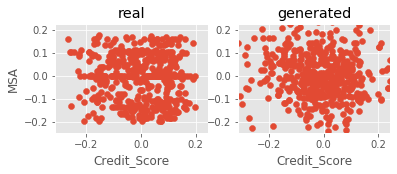

Step: 1000 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0253, 0.0151, 0.0399, 1.0000
D Real - D Gen: 0.0249


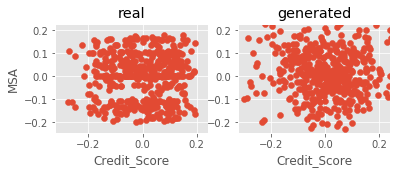

Step: 1100 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0210, 0.0117, 0.0468, 1.0000
D Real - D Gen: 0.0350


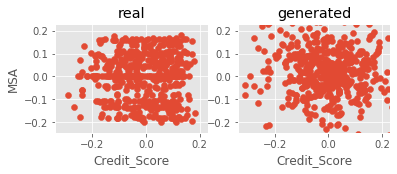

Step: 1200 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0175, 0.0084, 0.0373, 1.0000
D Real - D Gen: 0.0288


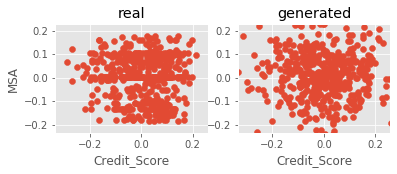

Step: 1300 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0176, 0.0083, 0.0341, 0.9980
D Real - D Gen: 0.0257


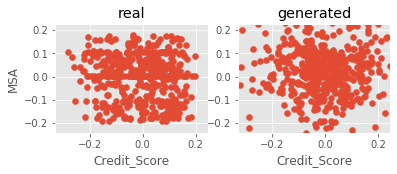

Step: 1400 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0167, 0.0069, 0.0342, 0.9919
D Real - D Gen: 0.0273


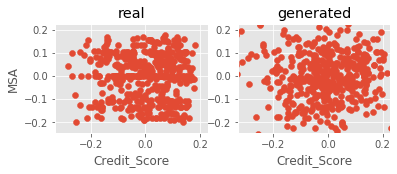

Step: 1500 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0170, 0.0074, 0.0361, 0.9980
D Real - D Gen: 0.0287


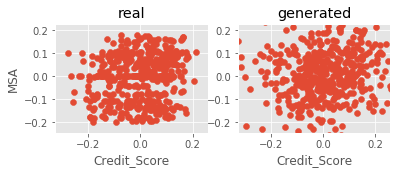

Step: 1600 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0136, 0.0048, 0.0289, 0.9980
D Real - D Gen: 0.0241


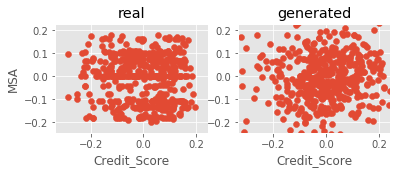

Step: 1700 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0139, 0.0048, 0.0360, 0.9980
D Real - D Gen: 0.0312


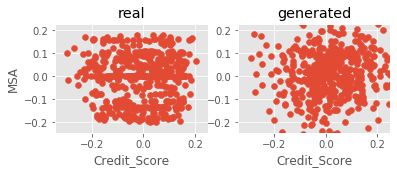

Step: 1800 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0125, 0.0028, 0.0259, 1.0000
D Real - D Gen: 0.0232


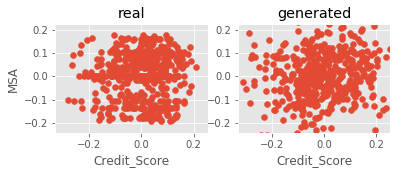

Step: 1900 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0141, 0.0045, 0.0379, 0.9980
D Real - D Gen: 0.0335


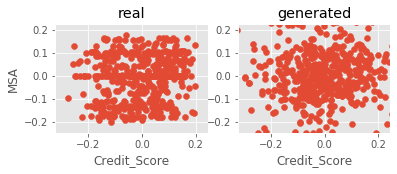

Step: 2000 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0143, 0.0045, 0.0382, 1.0000
D Real - D Gen: 0.0337


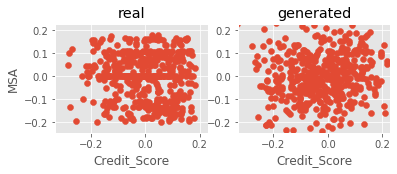

Step: 2100 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0120, 0.0032, 0.0276, 1.0000
D Real - D Gen: 0.0244


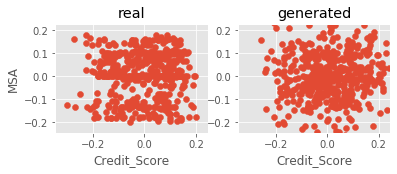

Step: 2200 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0126, 0.0027, 0.0255, 0.9959
D Real - D Gen: 0.0229


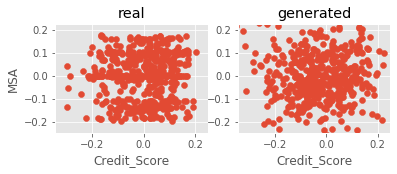

Step: 2300 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0138, 0.0029, 0.0254, 0.9980
D Real - D Gen: 0.0225


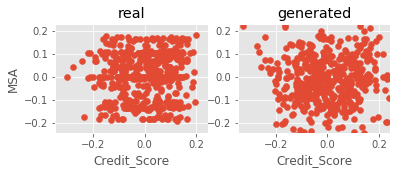

Step: 2400 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0091, 0.0000, 0.0343, 1.0000
D Real - D Gen: 0.0343


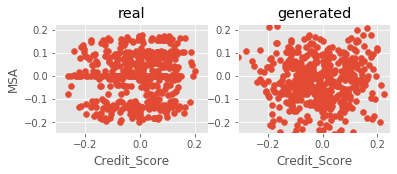

Step: 2500 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0119, 0.0006, 0.0229, 0.9959
D Real - D Gen: 0.0223


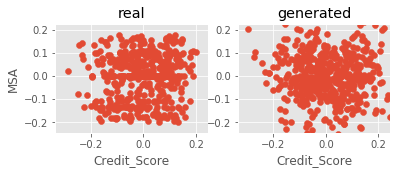

Step: 2600 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0089, -0.0004, 0.0199, 1.0000
D Real - D Gen: 0.0203


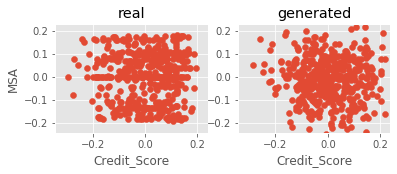

Step: 2700 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0041, -0.0026, 0.0170, 0.9959
D Real - D Gen: 0.0197


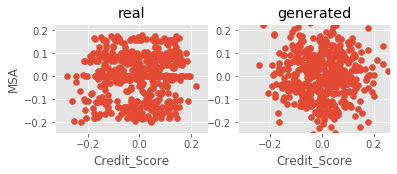

Step: 2800 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0045, -0.0025, 0.0171, 0.9959
D Real - D Gen: 0.0196


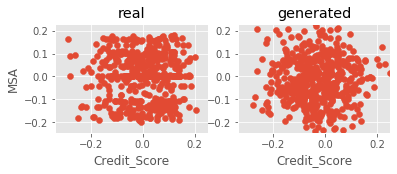

Step: 2900 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0056, -0.0026, 0.0187, 1.0000
D Real - D Gen: 0.0214


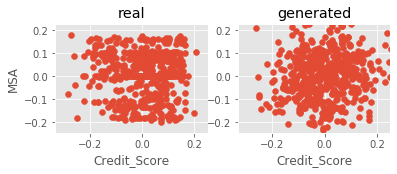

Step: 3000 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0050, -0.0043, 0.0165, 0.9919
D Real - D Gen: 0.0208


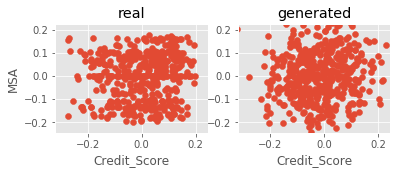

Step: 3100 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0046, -0.0049, 0.0191, 0.9959
D Real - D Gen: 0.0240


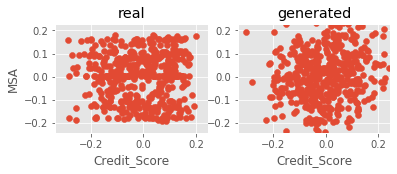

Step: 3200 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0071, -0.0034, 0.0223, 1.0000
D Real - D Gen: 0.0257


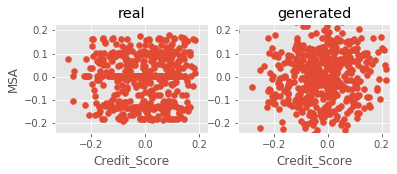

Step: 3300 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0065, -0.0039, 0.0236, 0.9959
D Real - D Gen: 0.0275


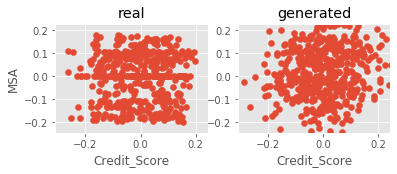

Step: 3400 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0063, -0.0035, 0.0184, 0.9959
D Real - D Gen: 0.0219


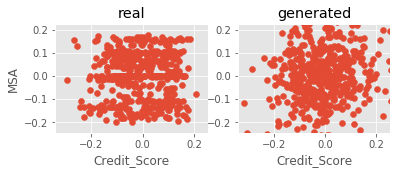

Step: 3500 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0072, -0.0024, 0.0214, 0.9980
D Real - D Gen: 0.0238


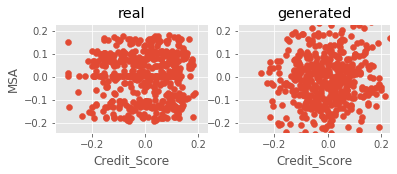

Step: 3600 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0073, -0.0036, 0.0277, 0.9980
D Real - D Gen: 0.0313


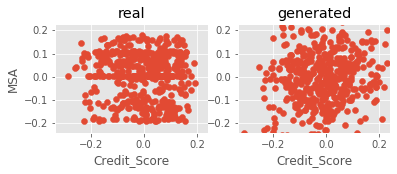

Step: 3700 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0058, -0.0052, 0.0171, 0.9919
D Real - D Gen: 0.0222


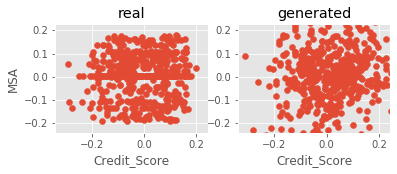

Step: 3800 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0035, -0.0057, 0.0175, 0.9939
D Real - D Gen: 0.0232


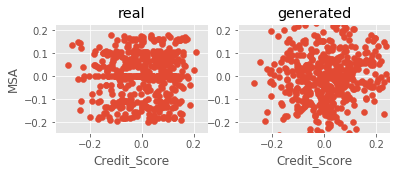

Step: 3900 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0053, -0.0030, 0.0175, 0.9959
D Real - D Gen: 0.0206


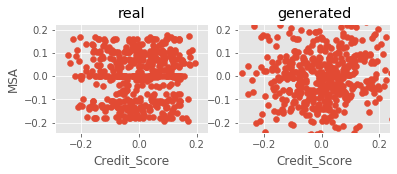

Step: 4000 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0077, -0.0043, 0.0184, 1.0000
D Real - D Gen: 0.0227


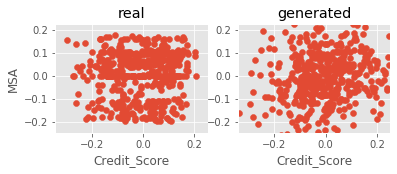

Step: 4100 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0084, -0.0038, 0.0183, 0.9939
D Real - D Gen: 0.0221


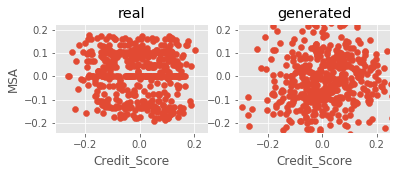

Step: 4200 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0033, -0.0077, 0.0126, 1.0000
D Real - D Gen: 0.0203


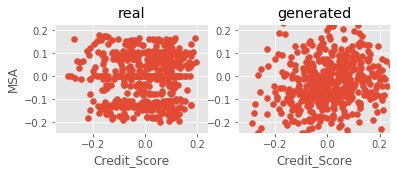

Step: 4300 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0020, -0.0074, 0.0190, 0.9980
D Real - D Gen: 0.0264


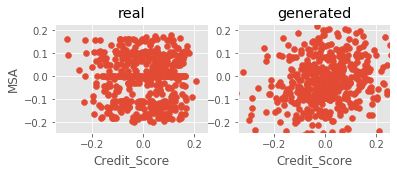

Step: 4400 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0061, -0.0058, 0.0212, 0.9939
D Real - D Gen: 0.0270


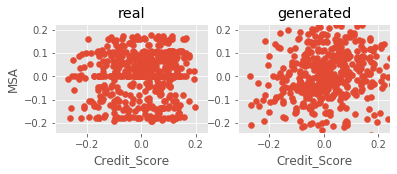

Step: 4500 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0033, -0.0079, 0.0154, 0.9980
D Real - D Gen: 0.0234


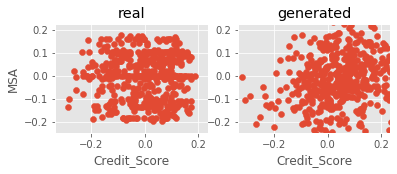

Step: 4600 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0069, -0.0052, 0.0171, 1.0000
D Real - D Gen: 0.0223


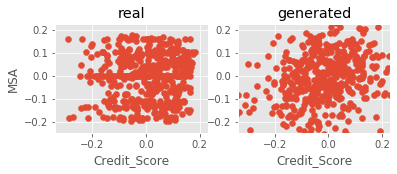

Step: 4700 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0024, -0.0124, 0.0099, 1.0000
D Real - D Gen: 0.0223


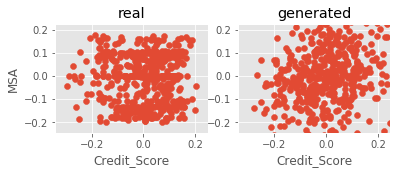

Step: 4800 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0042, -0.0151, 0.0090, 0.9959
D Real - D Gen: 0.0242


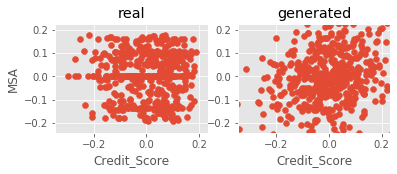

Step: 4900 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0011, -0.0132, 0.0107, 0.9980
D Real - D Gen: 0.0239


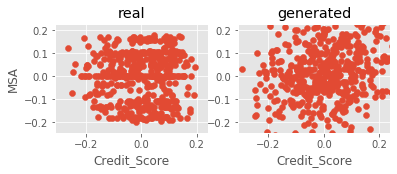

Step: 5000 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0024, -0.0141, 0.0100, 0.9959
D Real - D Gen: 0.0241


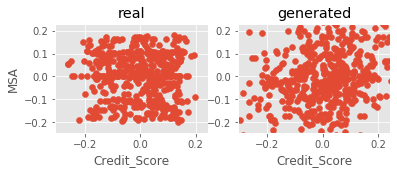

data_dim:  38
data_cols:  ['Credit_Score', 'MSA', 'MI_Percentage', 'Number_of_Units', 'Original_Combined_Loan_to_Value(CLTV)', 'Original_Debt_to_Income (DTI) Ratio', 'Original_UPB', 'Original_Loan_to_Value(LTV)', 'Original_Interest_Rate', 'Property_State', 'Postal_Code', 'Loan_Purpose', 'Original_Loan_Term', 'Number_of_Borrowers', 'Seller_Name', 'Servicer_Name', 'First_Payment_Year', 'First_Payment_Month', 'Maturity_Year', 'Maturity_Month', 'First_Time_Homebuyer_Flag_9', 'First_Time_Homebuyer_Flag_N', 'First_Time_Homebuyer_Flag_Y', 'Occupancy_Status_I', 'Occupancy_Status_P', 'Occupancy_Status_S', 'Channel_B', 'Channel_C', 'Channel_R', 'Channel_T', 'Prepayment_Penalty_Mortgage (PPM) Flag_N', 'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Property_Type_99', 'Property_Type_CO', 'Property_Type_CP', 'Property_Type_MH', 'Property_Type_PU', 'Property_Type_SF']
label_dim:  1
label_cols:  ['Program_Indicator']
_______________________________________________________________________________________

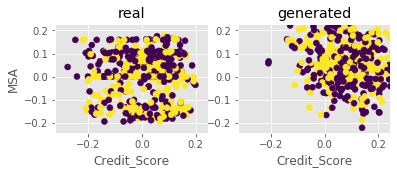

Step: 100 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0336, 0.0288, 0.0503, 1.0000
D Real - D Gen: 0.0215


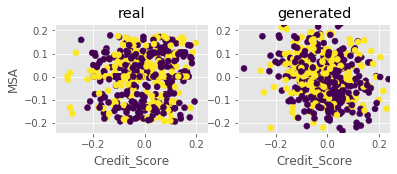

Step: 200 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0358, 0.0296, 0.0532, 0.9980
D Real - D Gen: 0.0236


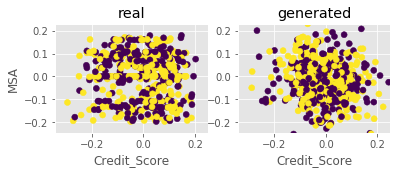

Step: 300 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0302, 0.0241, 0.0567, 0.9939
D Real - D Gen: 0.0327


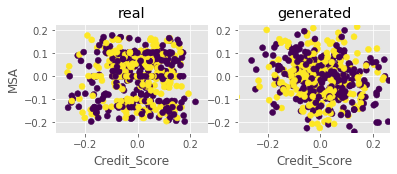

Step: 400 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0306, 0.0234, 0.0457, 0.9980
D Real - D Gen: 0.0223


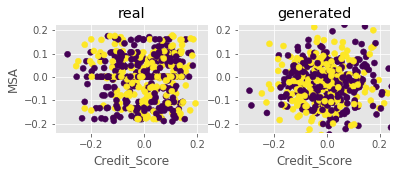

Step: 500 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0247, 0.0189, 0.0414, 1.0000
D Real - D Gen: 0.0225


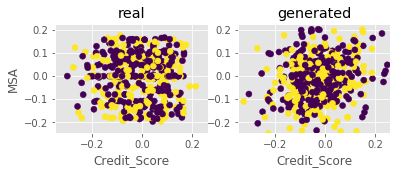

Step: 600 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0217, 0.0157, 0.0447, 1.0000
D Real - D Gen: 0.0291


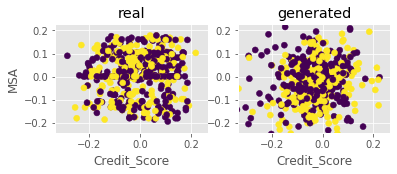

Step: 700 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0218, 0.0154, 0.0393, 0.9898
D Real - D Gen: 0.0239


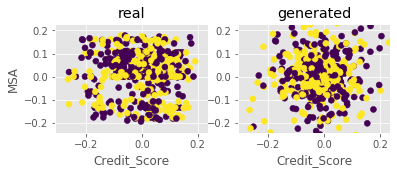

Step: 800 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0223, 0.0164, 0.0450, 0.9980
D Real - D Gen: 0.0287


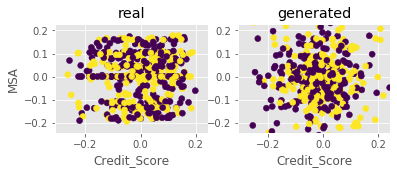

Step: 900 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0174, 0.0115, 0.0355, 0.9980
D Real - D Gen: 0.0240


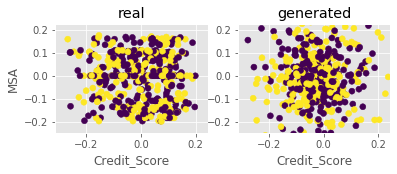

Step: 1000 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0175, 0.0121, 0.0342, 0.9959
D Real - D Gen: 0.0220


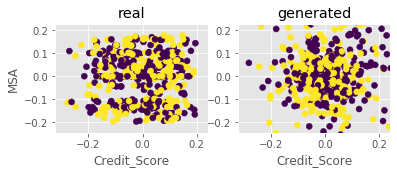

Step: 1100 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0190, 0.0133, 0.0463, 1.0000
D Real - D Gen: 0.0330


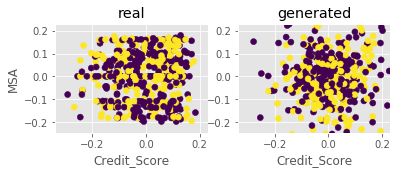

Step: 1200 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0167, 0.0107, 0.0373, 1.0000
D Real - D Gen: 0.0266


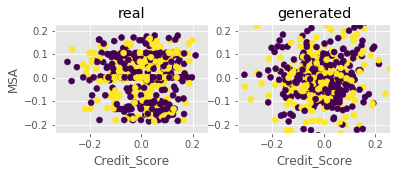

Step: 1300 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0177, 0.0090, 0.0323, 1.0000
D Real - D Gen: 0.0233


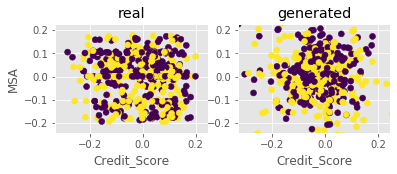

Step: 1400 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0121, 0.0053, 0.0309, 1.0000
D Real - D Gen: 0.0256


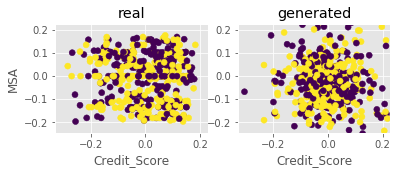

Step: 1500 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0105, 0.0040, 0.0309, 1.0000
D Real - D Gen: 0.0269


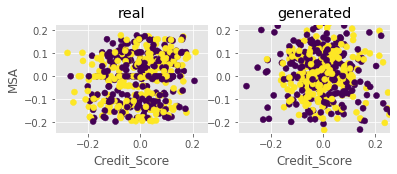

Step: 1600 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0090, 0.0005, 0.0220, 1.0000
D Real - D Gen: 0.0215


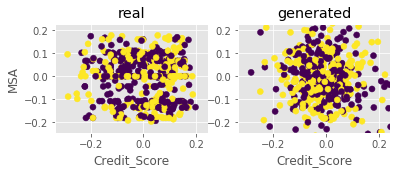

Step: 1700 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0063, -0.0010, 0.0259, 1.0000
D Real - D Gen: 0.0270


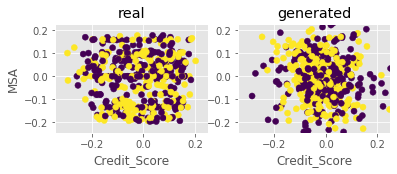

Step: 1800 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0014, -0.0061, 0.0152, 0.9939
D Real - D Gen: 0.0213


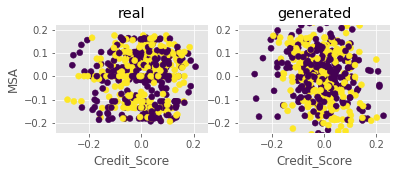

Step: 1900 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0009, -0.0073, 0.0235, 0.9939
D Real - D Gen: 0.0308


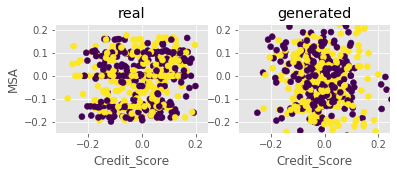

Step: 2000 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0023, -0.0054, 0.0286, 0.9980
D Real - D Gen: 0.0340


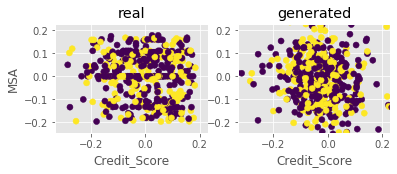

Step: 2100 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0016, -0.0057, 0.0161, 0.9959
D Real - D Gen: 0.0217


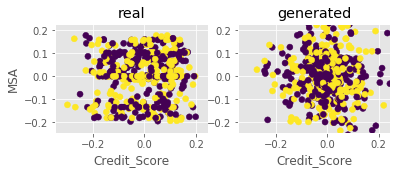

Step: 2200 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0026, -0.0087, 0.0104, 0.9878
D Real - D Gen: 0.0190


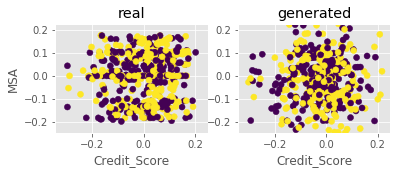

Step: 2300 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0030, -0.0066, 0.0124, 0.9939
D Real - D Gen: 0.0189


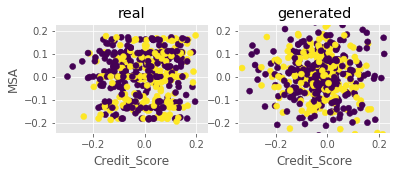

Step: 2400 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0025, -0.0076, 0.0241, 1.0000
D Real - D Gen: 0.0317


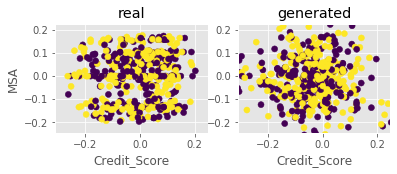

Step: 2500 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0028, -0.0079, 0.0112, 1.0000
D Real - D Gen: 0.0190


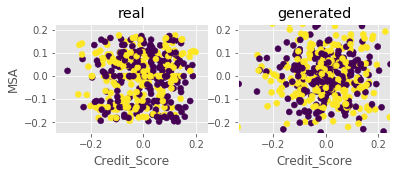

Step: 2600 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0052, -0.0089, 0.0086, 1.0000
D Real - D Gen: 0.0175


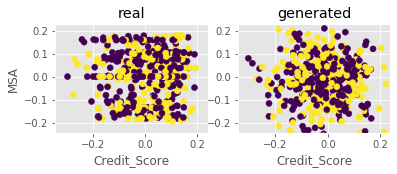

Step: 2700 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0071, -0.0113, 0.0078, 0.9980
D Real - D Gen: 0.0191


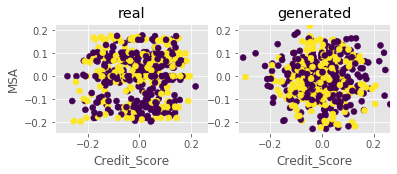

Step: 2800 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0057, -0.0109, 0.0088, 0.9959
D Real - D Gen: 0.0197


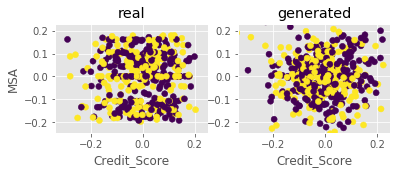

Step: 2900 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0069, -0.0127, 0.0067, 1.0000
D Real - D Gen: 0.0194


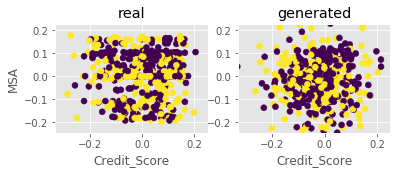

Step: 3000 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0034, -0.0110, 0.0082, 0.9939
D Real - D Gen: 0.0192


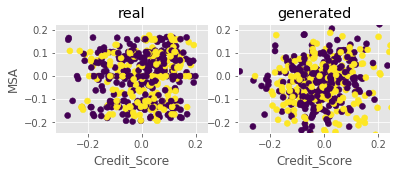

Step: 3100 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0047, -0.0118, 0.0085, 0.9898
D Real - D Gen: 0.0202


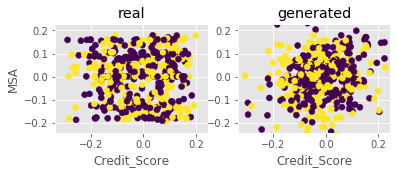

Step: 3200 of 5001.
Losses: G, D Gen, D Real, Xgb: -0.0015, -0.0091, 0.0143, 0.9980
D Real - D Gen: 0.0234


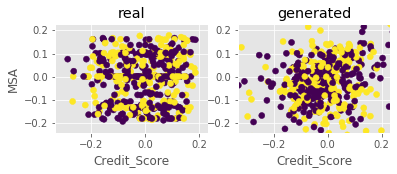

Step: 3300 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0024, -0.0104, 0.0148, 0.9939
D Real - D Gen: 0.0252


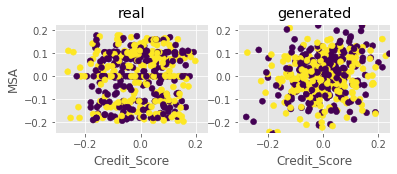

Step: 3400 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0010, -0.0068, 0.0136, 1.0000
D Real - D Gen: 0.0204


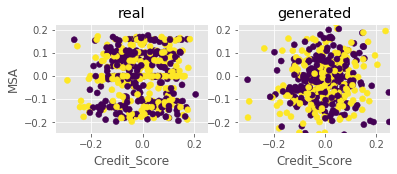

Step: 3500 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0049, -0.0104, 0.0073, 0.9980
D Real - D Gen: 0.0178


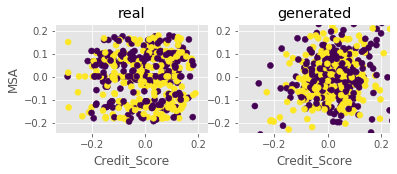

Step: 3600 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0009, -0.0120, 0.0161, 0.9980
D Real - D Gen: 0.0281


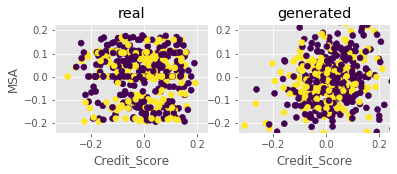

Step: 3700 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0015, -0.0121, 0.0083, 0.9939
D Real - D Gen: 0.0203


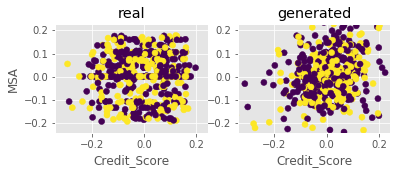

Step: 3800 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0038, -0.0107, 0.0093, 1.0000
D Real - D Gen: 0.0199


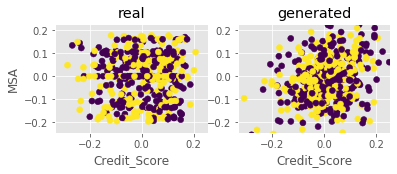

Step: 3900 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0072, -0.0151, 0.0035, 0.9959
D Real - D Gen: 0.0186


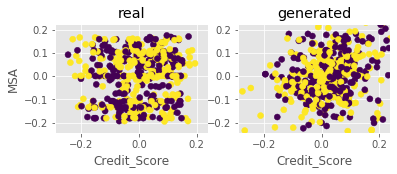

Step: 4000 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0058, -0.0126, 0.0058, 0.9959
D Real - D Gen: 0.0184


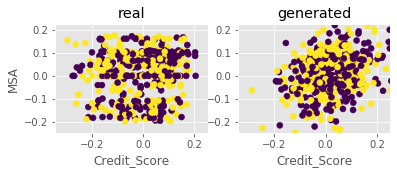

Step: 4100 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0056, -0.0135, 0.0049, 1.0000
D Real - D Gen: 0.0185


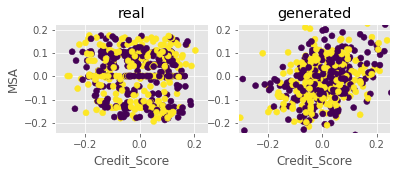

Step: 4200 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0114, -0.0178, 0.0011, 1.0000
D Real - D Gen: 0.0189


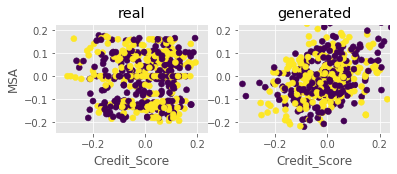

Step: 4300 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0110, -0.0181, 0.0040, 0.9980
D Real - D Gen: 0.0221


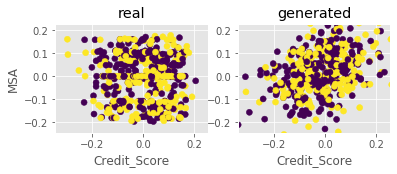

Step: 4400 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0135, -0.0186, 0.0016, 0.9939
D Real - D Gen: 0.0202


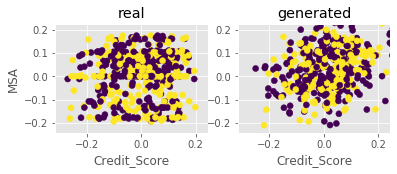

Step: 4500 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0148, -0.0216, -0.0038, 1.0000
D Real - D Gen: 0.0178


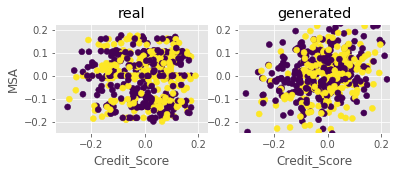

Step: 4600 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0118, -0.0203, -0.0006, 0.9959
D Real - D Gen: 0.0197


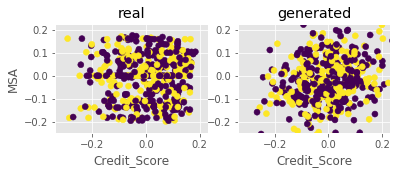

Step: 4700 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0155, -0.0208, -0.0048, 1.0000
D Real - D Gen: 0.0161


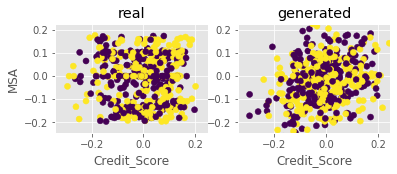

Step: 4800 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0143, -0.0211, -0.0005, 0.9919
D Real - D Gen: 0.0205


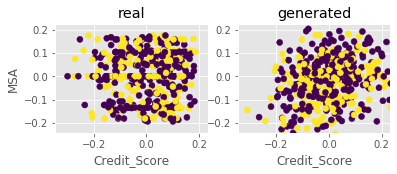

Step: 4900 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0133, -0.0204, -0.0020, 1.0000
D Real - D Gen: 0.0185


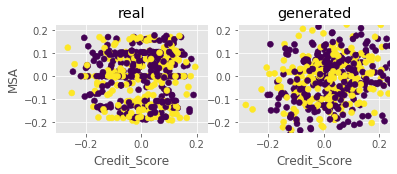

Step: 5000 of 5001.
Losses: G, D Gen, D Real, Xgb: 0.0149, -0.0223, -0.0035, 1.0000
D Real - D Gen: 0.0189


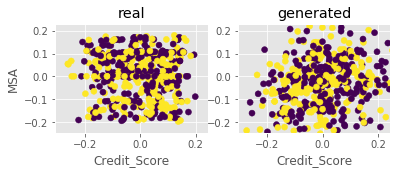

CPU times: user 3h 11min 54s, sys: 19min 9s, total: 3h 31min 4s
Wall time: 2h 41min 22s


In [79]:
%%time

# Training the WGAN and WCGAN architectures

k_d = 5 # train critic to optimal state each time
learning_rate = 1e-4 # 5e-5
arguments = [rand_dim, nb_steps, batch_size, 
             k_d, k_g, critic_pre_train_steps, log_interval, learning_rate, base_n_count,
            data_dir, generator_model_path, discriminator_model_path, loss_pickle_path, show ]

adversarial_training_WGAN(arguments, train_no_label, data_cols=data_cols ) # WGAN
adversarial_training_WGAN(arguments, train, data_cols=data_cols, label_cols=label_cols ) # WCGAN

In [80]:
prefix = 'WCGAN'
step = 5000

[combined_loss, disc_loss_generated, disc_loss_real, xgb_losses] = pickle.load(
    open(data_dir+prefix+'_losses_step_'+str(step)+'.pkl','rb'))

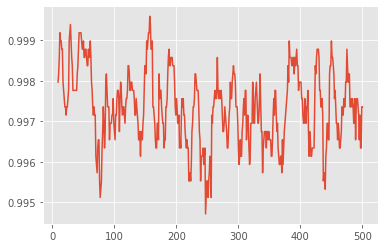

In [81]:
# plt.plot( xgb_losses[:] ) ;
w = 10
plt.plot( pd.DataFrame(xgb_losses[:]).rolling(w).mean() ) ;

In [82]:
# Look for the step with the lowest xgboost accuracy, and the lowest step saved (every 100)

best_step = list(xgb_losses).index( xgb_losses.min() ) * 10
print( best_step, xgb_losses.min() )

xgb100 = [ xgb_losses[i] for i in range(0, len(xgb_losses), 10) ]
best_step = xgb100.index( min(xgb100) ) * log_interval
print( best_step, min(xgb100) )

2470 0.9776422764227642
2200 0.9878048780487805


In [83]:
# Look for the step with the lowest critic loss, and the lowest step saved (every 100)

delta_losses = np.array(disc_loss_real) - np.array(disc_loss_generated)

best_step = list(delta_losses).index( delta_losses.min() )
print( best_step, delta_losses.min() )

delta100 = [ delta_losses[i] for i in range(0, len(delta_losses), 100) ]
best_step = delta100.index( min(delta100) ) * log_interval
print( best_step, min(delta100) )

0 0.0058795754
0 0.0058795754


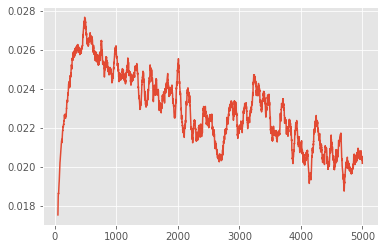

In [84]:
w = 50
# plt.plot( list(range(0,5001,1)), pd.rolling_mean((np.array(disc_loss_real) - np.array(disc_loss_generated)),w) )
plt.plot( pd.DataFrame(disc_loss_real[:]).rolling(w).mean() - pd.DataFrame(disc_loss_generated[:]).rolling(w).mean() ) ;


In [85]:
import GAN_171103_original
import importlib
importlib.reload(GAN_171103_original) # For reloading after making changes
from GAN_171103_original import *

seed = 17

train = data_w_Program_Indicator.copy().reset_index(drop=True) # fraud only with labels from classification

# train = pd.get_dummies(train, columns=['Class'], prefix='Class', drop_first=True)
label_cols = [ i for i in train.columns if 'Program_Indicator' in i ]
data_cols = [ i for i in train.columns if i not in label_cols ]
train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

data_dim = len(data_cols)
label_dim = len(label_cols)
with_class = False
if label_dim > 0: with_class = True
np.random.seed(seed)

# define network models

# generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count, type='Wasserstein')
# generator_model.load_weights('cache/WCGAN_generator_model_weights_step_4800.h5')
generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count)
generator_model.load_weights('cache_updated_2/CGAN_generator_model_weights_step_500.h5')


In [86]:
# Now generate some new data

# if the batch already has labels, then the generator_model would predict based on supervised learning.
# Whereas if the batch doesn't have labels, the generator model fall back on unsupervised learning.
test_size = 492 # Equal to all of the fraud cases

x = get_data_batch(train, test_size, seed=seed)
z = np.random.normal(size=(test_size, rand_dim))
if with_class:
    labels = x[:,-label_dim:]
    g_z = generator_model.predict([z, labels])
else:
    g_z = generator_model.predict(z)

0.9939024390243902


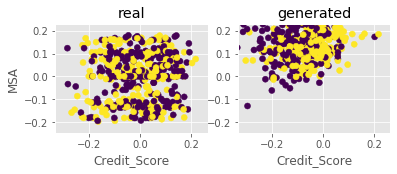

In [87]:
print( CheckAccuracy( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim ) )

# Plot the real vs generated for V1 (feature) vs Time

PlotData( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim )

In [88]:
real_samples = pd.DataFrame(x, columns=data_cols+label_cols)
test_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)
real_samples['syn_label'] = 0
test_samples['syn_label'] = 1

# Here, the training fraction is 0.5, which is ideal because the generated data should look just like real data
# making the percentage of accuracy 0.5.

training_fraction = 0.5

# Here, we combine half of the real with half of the test samples.
n_real, n_test = int(len(real_samples)*training_fraction), int(len(test_samples)*training_fraction)
train_df = pd.concat([real_samples[:n_real],test_samples[:n_test]],axis=0)

# Here,we combine the rest of the real with the rest of the test samples.
test_df = pd.concat([real_samples[n_real:],test_samples[n_test:]],axis=0)

# X_col = test_df.columns[:-(label_dim+1)]
X_col = test_df.columns[:-1]
y_col = test_df.columns[-1]
dtrain = xgb.DMatrix(train_df[X_col], train_df[y_col], feature_names=X_col)
dtest = xgb.DMatrix(test_df[X_col], feature_names=X_col)

# We have this column in the samples called 'syn_label', which is 0 for real and 1 for test. For test_df, we combined
# both of them (1/2 should be 0 and the other 1/2 should be 1). Therefore, this could serve as the true value for y_true.
y_true = test_df['syn_label']
xgb_params = {
    'max_depth': 4,
    'objective': 'binary:logistic',
    'random_state': 0,
    'eval_metric': 'auc', # allows for balanced or unbalanced classes 
}
xgb_test = xgb.train(xgb_params, dtrain, num_boost_round=10)

y_pred = np.round(xgb_test.predict(dtest))

print( '{:.2f}'.format(SimpleAccuracy(y_pred, y_true)) )

0.99


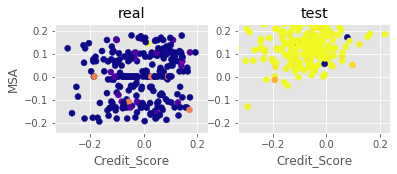

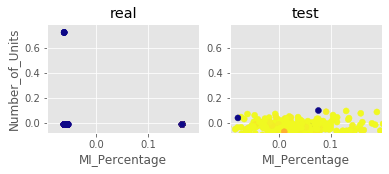

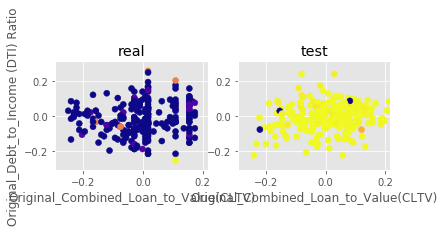

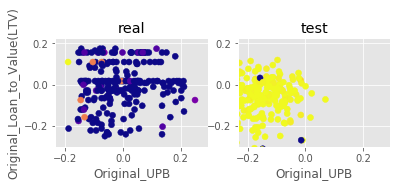

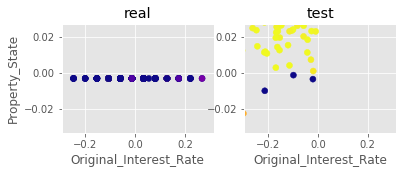

...

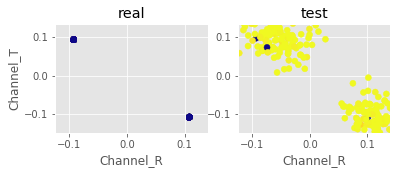

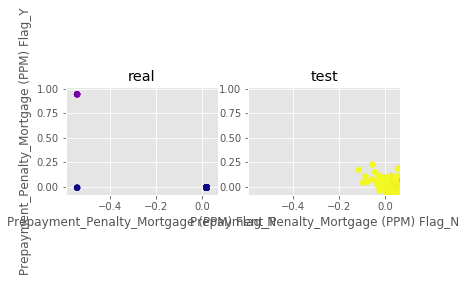

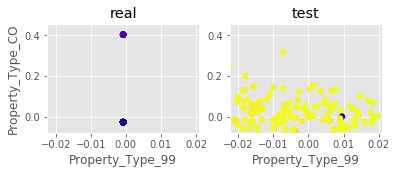

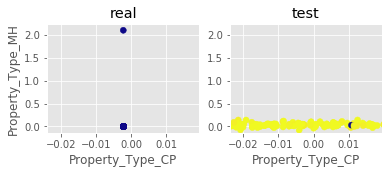

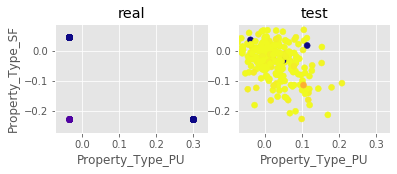

In [89]:
y_pred0 = xgb_test.predict(dtest)

for i in range(0,len(X_col)-1, 2):

    f, axarr = plt.subplots(1, 2, figsize=(6,2) )

    axarr[0].scatter( test_df[:n_real][X_col[i]], test_df[:n_real][X_col[i+1]], c=y_pred0[:n_real], cmap='plasma'  )
    axarr[0].set_title('real')
    axarr[0].set_ylabel(X_col[i+1])

    axarr[1].scatter( test_df[n_real:][X_col[i]], test_df[n_real:][X_col[i+1]], c=y_pred0[n_real:], cmap='plasma'  )
    axarr[1].set_title('test')
    axarr[1].set_xlim(axarr[0].get_xlim()), axarr[1].set_ylim(axarr[0].get_ylim())

    for a in axarr:
        a.set_xlabel(X_col[i])

    plt.show()

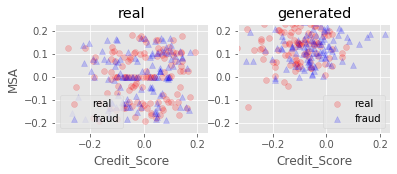

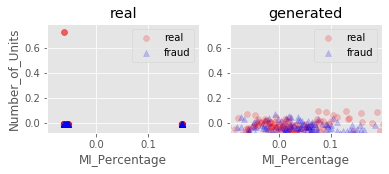

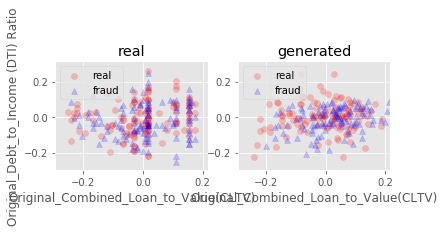

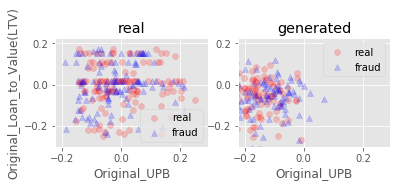

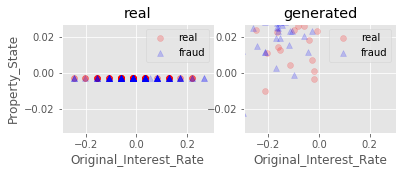

...

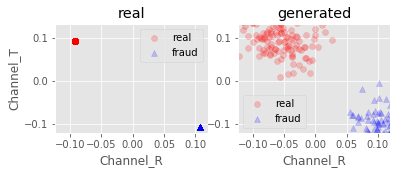

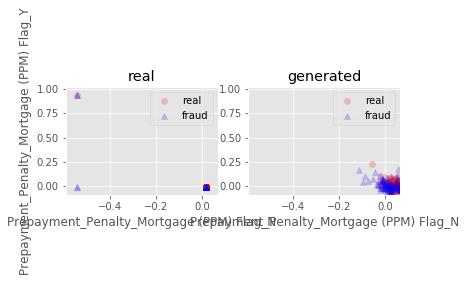

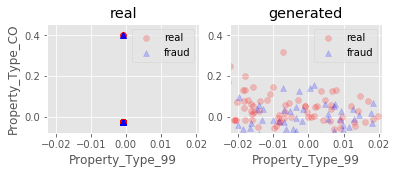

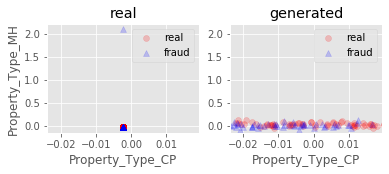

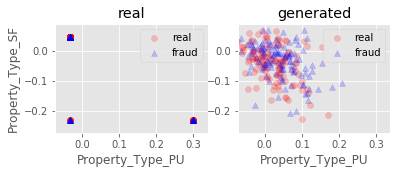

In [90]:
# Now we can compare the real and generated data by class, along every feature


colors = ['red','blue']
markers = ['o','^']
labels = ['real','fraud']

class_label = 'Program_Indicator'

for i in range(0,len(X_col), 2):
    col1, col2 = i, i+1
    if i+1 >= len(X_col): continue
    
    f, axarr = plt.subplots(1, 2, figsize=(6,2) )
    for group, color, marker, label in zip( test_df[:n_real].groupby(class_label), colors, markers, labels ):
        axarr[0].scatter( group[1][X_col[col1]], group[1][X_col[col2]], label=label, c=color, marker=marker, alpha=0.2) 
    axarr[0].legend()
    axarr[0].set_title('real')
    axarr[0].set_ylabel(X_col[col2])

    for group, color, marker, label in zip( test_df[n_real:].groupby(class_label), colors, markers, labels ):
        axarr[1].scatter( group[1][X_col[col1]], group[1][X_col[col2]], label=label, c=color, marker=marker, alpha=0.2) 
    axarr[1].set_xlim(axarr[0].get_xlim()), axarr[1].set_ylim(axarr[0].get_ylim())
    axarr[1].legend()
    axarr[1].set_title('generated') ;

    for a in axarr:
        a.set_xlabel(X_col[col1])

    plt.show()

In [91]:

SimpleMetrics(y_pred,y_true)

Confusion Matrix


,Pred 0,Pred 1
True 0,246,0
True 1,3,243


Accuracy : 0.9939024390243902


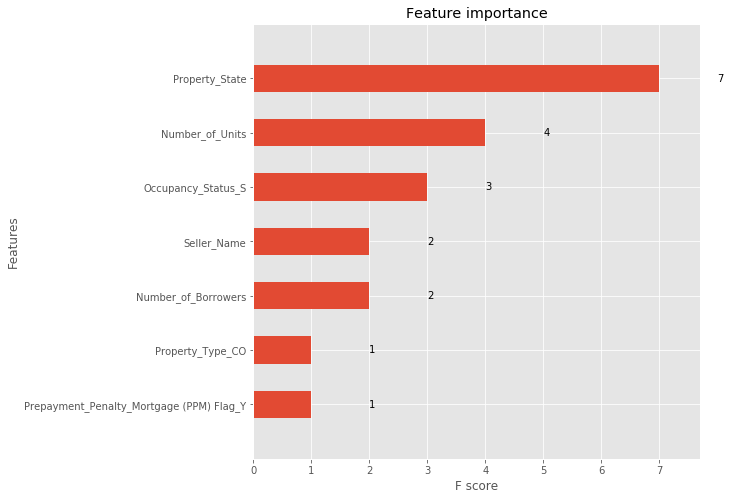

In [92]:
# Plot feature importances used for identifying generated data
# The top features used for identifying generated data is V25, V13, etc.

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
xgb.plot_importance(xgb_test, max_num_features=20, height=0.5, ax=ax);

In [93]:
# Set up the training dataset

train = data_w_Program_Indicator.copy().reset_index(drop=True) # fraud only with labels from classification

#train = pd.get_dummies(train, columns=['Program_Indicator'], prefix='PI', drop_first=True)
label_cols = [ i for i in train.columns if 'Program_Indicator' in i ]
data_cols = [ i for i in train.columns if i not in label_cols ]
train[ data_cols ] = train[ data_cols ] / 10 # scale to random noise size, one less thing to learn
train_no_label = train[ data_cols ]

data_dim = len(data_cols)
label_dim = len(label_cols)

In [94]:
train.head()
train['Program_Indicator'].value_counts()

0    176230
1    151364
Name: Program_Indicator, dtype: int64

In [95]:
# Generate empty models
# Define the models

rand_dim = 32
base_n_count = 128
model_names = ['GAN','CGAN','WGAN','WCGAN']
with_classes = [False, True, False, True]
type0s = [None, None, 'Wasserstein', 'Wasserstein']

models = {}

for model_name, with_class, type0 in zip(model_names, with_classes, type0s ):

    if with_class:
        generator_model, discriminator_model, combined_model = \
            define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count, type=type0)
    else:
         generator_model, discriminator_model, combined_model = \
            define_models_GAN(rand_dim, data_dim, base_n_count, type=type0)   
    
    models[model_name] = [ model_name, with_class, type0, generator_model ]

In [96]:
seed = 17
test_size = 492 # number of fraud cases

np.random.seed(seed)

# Generate the noises using this following code.
z = np.random.normal(size=(test_size, rand_dim))
x = get_data_batch(train, test_size, seed=seed)
real_samples = pd.DataFrame(x, columns=data_w_Program_Indicator.columns)
#real_samples = pd.DataFrame(x, columns=data_cols+label_cols)
#print(len(data_cols + label_cols))
#print("shape of real sample", real_samples.shape)
#print("label columns", label_cols)
#labels = x['PI_1']
#print(real_samples.head())
#print("labels are", labels)
#print(x)
labels = x[:,-label_dim:]
#print(labels)
#labels = x['Program_Indicator']
colors = ['red','blue']
markers = ['o','^']
class_labels = ['PI_1','PI_2']

col1, col2 = 'Original_Loan_Term', 'Channel_R' # here, we used the two best features used for detecting differences between classes.

base_dir = 'cache_updated_2/'

0
100
200
500
1000
2000
5000


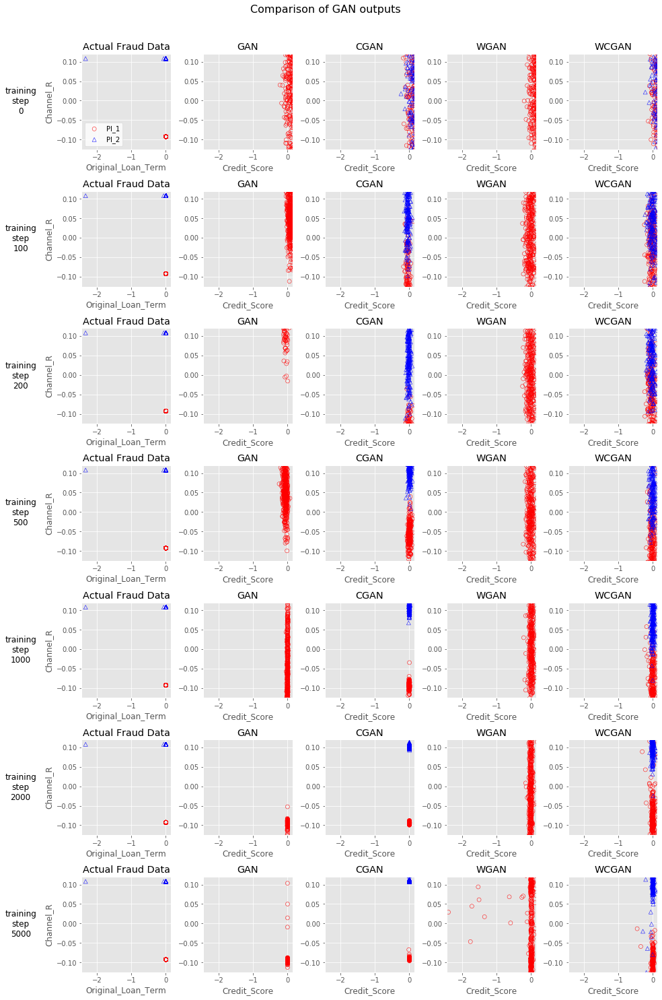

In [97]:
model_steps = [ 0, 100, 200, 500, 1000, 2000, 5000]
rows = len(model_steps)
columns = 5

axarr = [[]]*len(model_steps)

fig = plt.figure(figsize=(14,rows*3))

# Comparison of GAN output with different model steps and different models. 
# It's important to note here that GAN anc CGAN suffer from mode collapse
# In addition, GAN and CGAN at higher model steps converge to 1 class, whereas CGAN and WCGAN converge to 2. 

for model_step_ix, model_step in enumerate( model_steps ):
    print(model_step)
        
    axarr[model_step_ix] = plt.subplot(rows, columns, model_step_ix*columns + 1)
    
    for group, color, marker, label in zip( real_samples.groupby('Program_Indicator'), colors, markers, class_labels ):
        plt.scatter( group[1][[col1]], group[1][[col2]], 
                         label=label, marker=marker, edgecolors=color, facecolors='none' )
    
    plt.title('Actual Fraud Data')
    plt.ylabel(col2) # Only add y label to left plot
    plt.xlabel(col1)
    xlims, ylims = axarr[model_step_ix].get_xlim(), axarr[model_step_ix].get_ylim()
        
    if model_step_ix == 0: 
        legend = plt.legend()
        legend.get_frame().set_facecolor('white')
    
    for i, model_name in enumerate( model_names[:] ):
        
        [ model_name, with_class, type0, generator_model ] = models[model_name]
        
        generator_model.load_weights( base_dir + model_name + '_generator_model_weights_step_'+str(model_step)+'.h5')

        ax = plt.subplot(rows, columns, model_step_ix*columns + 1 + (i+1) )
        
        if with_class:
            g_z = generator_model.predict([z, labels])
            gen_samples = pd.DataFrame(g_z, columns=data_cols+label_cols)
            for group, color, marker, label in zip( gen_samples.groupby('Program_Indicator'), colors, markers, class_labels ):
                plt.scatter( group[1][[col1]], group[1][[col2]], 
                                 label=label, marker=marker, edgecolors=color, facecolors='none' )
        else:
            g_z = generator_model.predict(z)
            gen_samples = pd.DataFrame(g_z, columns=data_cols)
            plt.scatter( gen_samples[[col1]], gen_samples[[col2]], 
                             label=class_labels[0], marker=markers[0], edgecolors=colors[0], facecolors='none' )
        plt.title(model_name)   
        plt.xlabel(data_cols[0])
        ax.set_xlim(xlims), ax.set_ylim(ylims)


plt.suptitle('Comparison of GAN outputs', size=16)
plt.tight_layout(rect=[0.075,0,1,0.95])

# Adding text labels for traning steps
vpositions = np.array([ i._position.bounds[1] for i in axarr ])
vpositions += ((vpositions[0] - vpositions[1]) * 0.35 )
for model_step_ix, model_step in enumerate( model_steps ):
    fig.text( 0.05, vpositions[model_step_ix], 'training\nstep\n'+str(model_step), ha='center', va='center', size=12)


In [98]:
# Setup xgboost parameters

xgb_params = {
#     'max_depth': 4,
    'objective': 'binary:logistic',
    'random_state': 0,
    'eval_metric': 'auc', # auc, error
#     'tree_method': 'hist'
#     'grow_policy': 'lossguide' # depthwise, lossguide
}

# https://github.com/dmlc/xgboost/blob/master/demo/guide-python/custom_objective.py

from sklearn.metrics import recall_score, precision_score, roc_auc_score

def recall(preds, dtrain):
    labels = dtrain.get_label()
    return 'recall',  recall_score(labels, np.round(preds))

def precision(preds, dtrain):
    labels = dtrain.get_label()
    return 'precision',  precision_score(labels, np.round(preds))

def roc_auc(preds, dtrain):
    labels = dtrain.get_label()
    return 'roc_auc',  roc_auc_score(labels, preds)


In [99]:
# Define model parameters

seed = 17
np.random.seed(seed)

data_dim = len(data_cols)
label_dim = len(label_cols)

base_dir = 'cache_updated_2/'
rand_dim = 32
base_n_count = 128

In [100]:
# defined training set parameters

train_fraction = 0.7
X_col = data_w_Program_Indicator.columns[:-1]
y_col = data_w_Program_Indicator.columns[-1]


folds = 5

In [101]:
def MakeCrossFolds( g_z_df=[] ):

    np.random.seed(0)

    train_real_set, test_real_set = [], []
    train_fraud_set, test_fraud_set = [], []

    real_samples = data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator==0 ].copy()
    fraud_samples = data_w_Program_Indicator.loc[ data_w_Program_Indicator.Program_Indicator==1 ].copy()

#     n_temp_real = 10000 
    n_temp_real = len(real_samples)

    for seed in range(folds):
        np.random.seed(seed)

        fraud_samples = fraud_samples.sample(len(fraud_samples), replace=False).reset_index(drop=True) # shuffle

    #     n_train_fraud = int(len(fraud_samples) * train_fraction)
        n_train_fraud = 100
        train_fraud_samples = fraud_samples[:n_train_fraud].reset_index(drop=True)

    #     test_fraud_samples = fraud_samples[n_train_fraud:].reset_index(drop=True)
        n_test_fraud = 148 # 30% left out
        test_fraud_samples = fraud_samples[-n_test_fraud:].reset_index(drop=True)

        if len(g_z_df)==0: g_z_df = fraud_samples[n_train_fraud:-n_test_fraud] # for adding real data, if no generated
        n_g_z = len(g_z_df)
        train_fraud_samples = train_fraud_samples.append(g_z_df).reset_index(drop=True)

        real_samples = real_samples.sample(len(real_samples), replace=False).reset_index(drop=True) # shuffle
        temp_real_samples = real_samples[:n_temp_real]
        n_train_real = int(len(temp_real_samples) * train_fraction)

        train_real_samples = temp_real_samples[:n_train_real].reset_index(drop=True) # with margin
        test_real_samples = temp_real_samples[n_train_real:].reset_index(drop=True) # with margin

        train_real_set.append( train_real_samples )
        test_real_set.append( test_real_samples )
        train_fraud_set.append( train_fraud_samples )
        test_fraud_set.append( test_fraud_samples )

    print( n_train_fraud )
    for i in [ fraud_samples, g_z_df, train_fraud_samples, test_fraud_samples ]: print( len(i) )
    for i in [ real_samples, train_real_samples, test_real_samples ]: print( len(i) )
    # [ [ len(i) for i in j ] for j in [train_real_set, test_real_set, train_fraud_set, test_fraud_set] ]
    
    return n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set

In [102]:
# function to run an xgboost classifier on different cross-folds with different amounts of data added

def Run_CV_Xgb(n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set):

    test_data=[]

    # for i in [1]:
    # for i in [1,2,5,10,20]:
    # for i in np.logspace(0,np.log10(11),num=5):
    # for i in np.logspace(0,np.log10(11),num=3):
    for i in np.logspace(0,np.log10((492-148)/100),num=5):

        print('# additional generated data tested: {}'.format (int(n_train_fraud*(i-1)) ) )
        for k in range(folds):

            train_df = pd.concat( 
                [ train_real_set[k], train_fraud_set[k][:int(n_train_fraud*i)] ],
                 axis=0,ignore_index=True).reset_index(drop=True)

            test_df = pd.concat( 
                [ test_real_set[k], test_fraud_set[k] ],
                axis=0,ignore_index=True).reset_index(drop=True)

            dtrain = xgb.DMatrix(train_df[X_col], train_df[y_col], feature_names=X_col)
            dtest = xgb.DMatrix(test_df[X_col], test_df[y_col], feature_names=X_col)

            results_dict = {}
            xgb_test = xgb.train(xgb_params, dtrain, num_boost_round=100, 
                                 verbose_eval=False, early_stopping_rounds=10, 
                                 evals=[(dtrain,'train'),(dtest,'test')],
                                 evals_result = results_dict )

            y_pred = xgb_test.predict(dtest, ntree_limit=xgb_test.best_iteration+1)
            y_true = test_df['Program_Indicator'].values
            results = [k, i, xgb_test.best_iteration, recall( y_pred, dtest )[1], precision( y_pred, dtest )[1], roc_auc( y_pred, dtest )[1] ]
    #         print(results)

            test_data.append(results)
    test_data = pd.DataFrame(test_data, columns=['k', 'ratio','best','recall','precision','auc'])
    return test_data

In [103]:
%%time

# Generate and test data with untrained model

generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count, type='Wasserstein')
generator_model.load_weights( base_dir + 'WCGAN_generator_model_weights_step_0.h5')

test_size = 492
x = get_data_batch(data_w_Program_Indicator, test_size, seed=0)
z = np.random.normal(size=(test_size, rand_dim))
labels = x[:,-label_dim:]
g_z = generator_model.predict([z, labels])


# The labels for the generate data will all be 1, as they are supposed to be fraud data
g_z_df = pd.DataFrame( np.hstack( [g_z[:,:len(data_cols)], np.ones((len(g_z),1))] ), columns=data_w_Program_Indicator.columns )

n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set = MakeCrossFolds(g_z_df)
    
t_0 = Run_CV_Xgb(n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set)

100
151364
492
592
148
176230
123360
52870
# additional generated data tested: 0
# additional generated data tested: 36
# additional generated data tested: 85
# additional generated data tested: 152
# additional generated data tested: 243
CPU times: user 1min 33s, sys: 6.04 s, total: 1min 39s
Wall time: 21.9 s


In [104]:
%%time

# Generate and test data with trained model

generator_model, discriminator_model, combined_model = define_models_CGAN(rand_dim, data_dim, label_dim, base_n_count, type='Wasserstein')
generator_model.load_weights( base_dir + 'WCGAN_generator_model_weights_step_4800.h5')

test_size = 492
x = get_data_batch(data_w_Program_Indicator, test_size, seed=0)
z = np.random.normal(size=(test_size, rand_dim))
labels = x[:,-label_dim:]
g_z = generator_model.predict([z, labels])



# The labels for the generate data will all be 1, as they are supposed to be fraud data
g_z_df = pd.DataFrame( np.hstack( [g_z[:,:len(data_cols)], np.ones((len(g_z),1))] ), columns=data.columns )

n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set = MakeCrossFolds(g_z_df)
    
t_4800 = Run_CV_Xgb(n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set)


100
151364
492
592
148
176230
123360
52870
# additional generated data tested: 0
# additional generated data tested: 36
# additional generated data tested: 85
# additional generated data tested: 152
# additional generated data tested: 243
CPU times: user 1min 35s, sys: 5.89 s, total: 1min 41s
Wall time: 21.8 s


In [105]:
%%time

# Generate and test data with additional real data

n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set = MakeCrossFolds()
    
t_real = Run_CV_Xgb(n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set)

100
151364
151116
151216
148
176230
123360
52870
# additional generated data tested: 0
# additional generated data tested: 36
# additional generated data tested: 85
# additional generated data tested: 152
# additional generated data tested: 243
CPU times: user 1min 35s, sys: 5.35 s, total: 1min 41s
Wall time: 20.1 s


In [266]:
#t_0 = pickle.load(open('cache_updated/additional untrained generated fraud data test.pk2','rb'))
#t_500 = pickle.load(open('cache_updated/additional generated fraud data test.pk2','rb'))
#t_real = pickle.load(open('cache_updated/additional real fraud data test.pk2','rb'))

FileNotFoundError: [Errno 2] No such file or directory: 'cache_updated/additional untrained generated fraud data test.pk2'

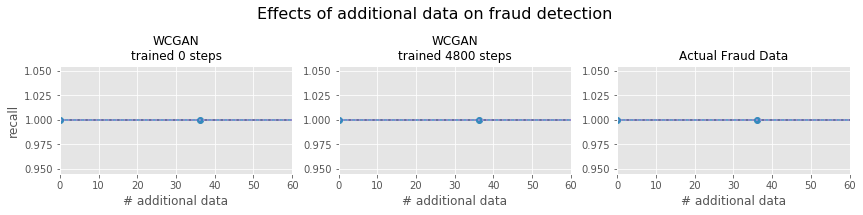

In [106]:
# Plot the testing data

labels = ['WCGAN\ntrained 0 steps','WCGAN\ntrained 4800 steps','Actual Fraud Data']

metric = 'recall'

plt.figure(figsize=(12,3))
for i, [label, test_data] in enumerate(zip(labels, [t_0, t_4800, t_real])):

    xs = [ n_train_fraud * (i[0]-1) for i in test_data.groupby('ratio') ]
    ys = test_data.groupby('ratio')[metric].mean().values
    stds = 2 * test_data.groupby('ratio')[metric].std().values

    plt.subplot(1,3,i+1)
    plt.axhline(ys[0],linestyle='--',color='red')
    plt.plot(xs,ys,c='C1',marker='o')
    plt.plot(xs,ys+stds,linestyle=':',c='C2')
    plt.plot(xs,ys-stds,linestyle=':',c='C2')
    if i==0: plt.ylabel(metric)
    plt.xlabel('# additional data')
    plt.title(label,size=12)
    plt.xlim([0,60])
#     plt.ylim([0.55,.85])
    #plt.ylim([0.6,1.0])

plt.tight_layout(rect=[0,0,1,0.9])
plt.suptitle('Effects of additional data on fraud detection', size=16)
# plt.savefig('plots/Effects of addtional data on fraud detection.png')
plt.show()

In [107]:
# Load the saved loss data from each model

# base_dir = 'cache/'
base_dir = 'cache_updated_2/'

suffix = '_step_5000'

GAN_losses = pickle.load(open(base_dir + 'GAN_losses'+suffix+'.pkl','rb'))
# GAN_losses = [combined_loss, disc_loss_real, disc_loss_generated, xgb_losses]

CGAN_losses = pickle.load(open(base_dir + 'CGAN_losses'+suffix+'.pkl','rb'))
WGAN_losses = pickle.load(open(base_dir + 'WGAN_losses'+suffix+'.pkl','rb'))
WCGAN_losses = pickle.load(open(base_dir + 'WCGAN_losses'+suffix+'.pkl','rb'))

In [108]:
# Find best xgb scores overall and saved (every 100 steps)

data_ix = 3
data_sets = [ GAN_losses[data_ix], CGAN_losses[data_ix], WGAN_losses[data_ix], WCGAN_losses[data_ix]]
labels = [ 'GAN','CGAN','WGAN','WCGAN' ]

for label, data_set in zip( labels, data_sets ):
    best_step = list(data_set).index( np.array(data_set).min() ) * 10
    print( '{: <5} step {: <4}: {:.4f}'.format( label, best_step, np.array(data_set).min() ) )

    xgb100 = [ data_set[i] for i in range(0, len(data_set), 10) ]
    best_step = xgb100.index( min(xgb100) ) * 100
    print( '{: <5} step {: <4}: {:.4f}\n'.format( label, best_step, np.array(xgb100).min() ) )
#     print( best_step, min(xgb100) )

GAN   step 1270: 0.9776
GAN   step 1700: 0.9858

CGAN  step 2010: 0.9797
CGAN  step 700 : 0.9898

WGAN  step 550 : 0.9858
WGAN  step 1400: 0.9919

WCGAN step 2470: 0.9776
WCGAN step 2200: 0.9878



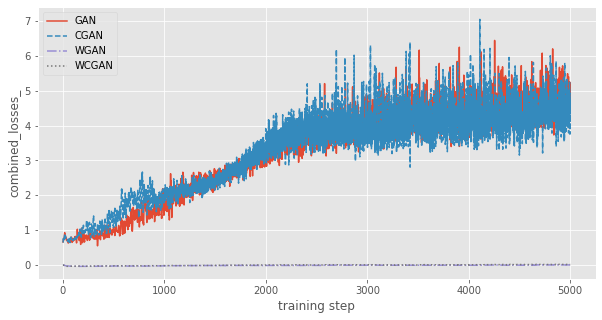

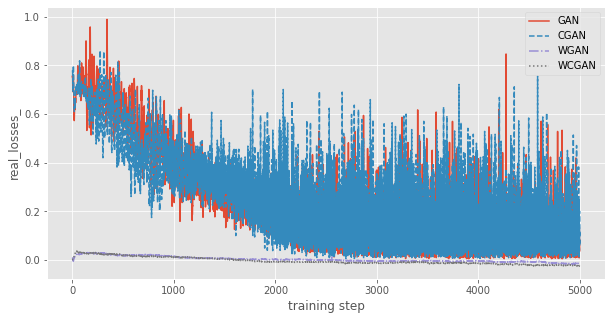

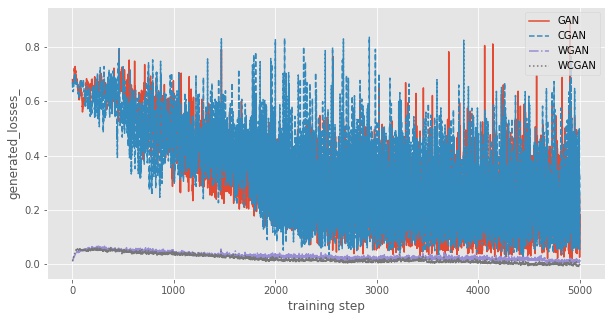

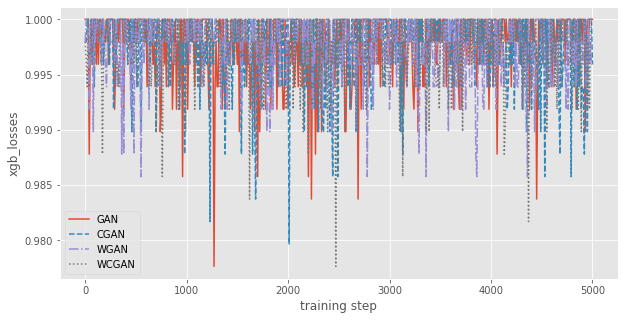

In [109]:
# Look at the unsmoothed losses

data_fields = ['combined_losses_', 'real_losses_', 'generated_losses_', 'xgb_losses']
sampling_intervals = [ 1, 1, 1, 10 ]
labels = [ 'GAN','CGAN','WGAN','WCGAN' ]
linestyles = ['-', '--', '-.', ':']

# noticed that for unsmoothed losses, the plotted graph has a lot more zigzags (hence the name). 
# Also notice that both GAN and CGAN suffer from mode collapse (as mentioned before).
# In addition, WGAN and WCGAN remain stable and the accuracy scores for the two are the lowest (closest to ideal 0.5)
for data_ix in range(len(data_fields)):
    data_sets = [ GAN_losses[data_ix], CGAN_losses[data_ix], WGAN_losses[data_ix], WCGAN_losses[data_ix]]

    plt.figure(figsize=(10,5))
    for data, label, linestyle in zip(data_sets, labels, linestyles):
        plt.plot( np.array(range(0,len(data)))*sampling_intervals[data_ix],
                 data,
                 label=label, linestyle=linestyle )

    plt.ylabel(data_fields[data_ix])
    plt.xlabel('training step')
    plt.legend()
    plt.show()

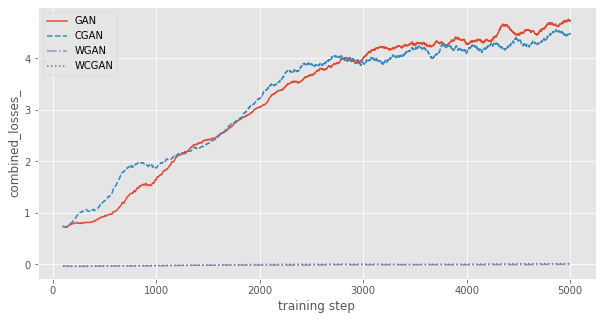

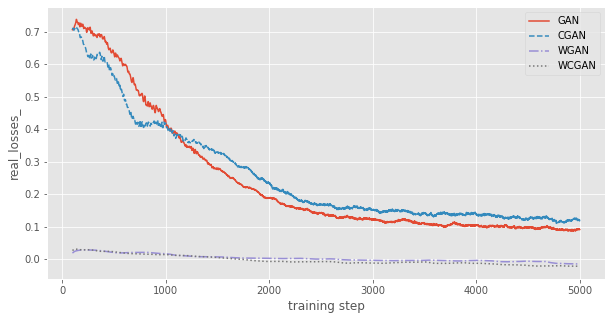

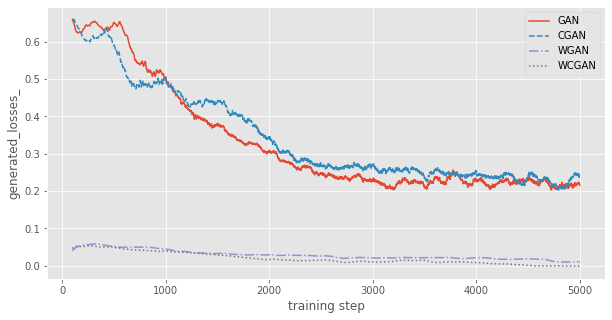

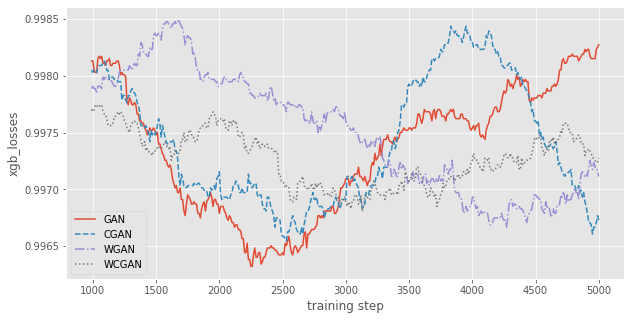

In [110]:
# Look at the smoothed losses

data_fields = ['combined_losses_', 'real_losses_', 'generated_losses_', 'xgb_losses']
sampling_intervals = [ 1, 1, 1, 10 ]
labels = [ 'GAN','CGAN','WGAN','WCGAN' ]
linestyles = ['-', '--', '-.', ':']

# Here we defined w to be 100, which from the for loop, each point is the rolling mean of 100 data points.
# Therefore, the graph turned out to be more smooth (hence its name).

w = 100
for data_ix in range(len(data_fields)):
    data_sets = [ GAN_losses[data_ix], CGAN_losses[data_ix], WGAN_losses[data_ix], WCGAN_losses[data_ix]]

    plt.figure(figsize=(10,5))
    for data, label, linestyle in zip(data_sets, labels, linestyles):
        plt.plot( np.array(range(0,len(data)))*sampling_intervals[data_ix],
                 pd.DataFrame(data).rolling(w).mean(),
                 label=label, linestyle=linestyle )

    plt.ylabel(data_fields[data_ix])
    plt.xlabel('training step')
    plt.legend()
    plt.show()

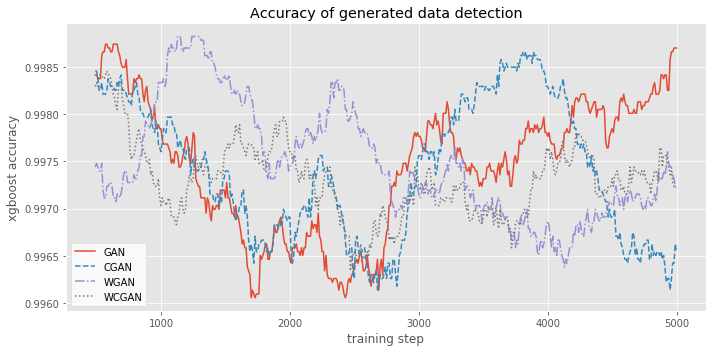

In [111]:
# Create a figure for the smoothed xgboost losses

data_fields = ['combined_losses_', 'real_losses_', 'generated_losses_', 'xgb_losses']
sampling_intervals = [ 1, 1, 1, 10 ]
labels = [ 'GAN','CGAN','WGAN','WCGAN' ]
linestyles = ['-', '--', '-.', ':']

# Here, w is set to 50 and smoothed xgboost losses are plotted. 

w = 50
data_ix = 3

data_sets = [ GAN_losses[data_ix], CGAN_losses[data_ix], WGAN_losses[data_ix], WCGAN_losses[data_ix]]

plt.figure(figsize=(10,5))
for data, label, linestyle in zip(data_sets, labels, linestyles):
    plt.plot( np.array(range(0,len(data)))*sampling_intervals[data_ix],
             pd.DataFrame(data).rolling(w).mean(),
             label=label, linestyle=linestyle )

plt.ylabel(data_fields[data_ix])
plt.xlabel('training step')
legend = plt.legend() 
legend.get_frame().set_facecolor('white')

plt.title('Accuracy of generated data detection')
plt.ylabel('xgboost accuracy')
plt.tight_layout() ;
# plt.savefig('plots/GAN_accuracy.png')

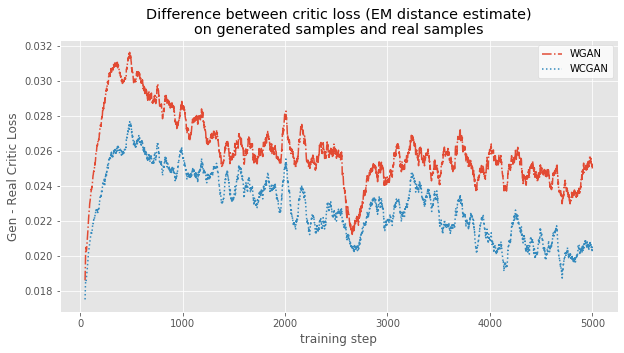

In [112]:
# Create a figure for the critic losses for the WGAN and WCGAN

# Smoothed plot with critic losses for WGAN and WCGAN. As the training step increases, the difference between
# critic loss on generated and real sample decreases. 
w = 50

data_ix0 = 2
data_ix1 = 1
data_fields = ['combined_losses_', 'real_losses_', 'generated_losses_', 'xgb_losses']

i1, i2 = 2, 3
i2 += 1

labels = [ 'GAN','CGAN','WGAN','WCGAN' ][i1:i2]
data_sets0 = [ GAN_losses[data_ix0], CGAN_losses[data_ix0], WGAN_losses[data_ix0], WCGAN_losses[data_ix0]][i1:i2]
data_sets1 = [ GAN_losses[data_ix1], CGAN_losses[data_ix1], WGAN_losses[data_ix1], WCGAN_losses[data_ix1]][i1:i2]
linestyles = ['-', '--', '-.', ':'][i1:i2]

plt.figure(figsize=(10,5))
for data0, data1, label, linestyle in zip(data_sets0, data_sets1, labels, linestyles):
    plt.plot( range(0,len(data0)), 
             pd.DataFrame( np.array(data0)-np.array(data1) ).rolling(w).mean(),  
             label=label, linestyle=linestyle )
plt.title('Difference between critic loss (EM distance estimate)\non generated samples and real samples')
plt.xlabel('training step')
plt.ylabel('Gen - Real Critic Loss')
legend = plt.legend() 
legend.get_frame().set_facecolor('white')
# plt.savefig('plots/Delta_critic_loss_plot.png')

In [275]:
#data = pickle.load(open('data/' + 'credicard.engineered.pk2','rb'))

# Put columns in order of importance for xgboost fraud detection, from the xgboost section
sorted_cols = ['Original_Loan_Term', 'Channel_R', 'Channel_T', 'Original_Debt_to_Income (DTI) Ratio', 
 'Prepayment_Penalty_Mortgage (PPM) Flag_N', 'Postal_Code', 'Credit_Score', 'Channel_B', 'Maturity_Year', 
 'MI_Percentage', 'Original_UPB', 'MSA', 'Original_Interest_Rate', 
 'Original_Combined_Loan_to_Value(CLTV)', 'Prepayment_Penalty_Mortgage (PPM) Flag_Y', 'Program_Indicator']
data_sorted = data_w_Program_Indicator[ sorted_cols ].copy()

# data columns will be all other columns except class
data_cols = list(data_sorted.columns[ data_sorted.columns != 'Program_Indicator' ])
data_dim = len(data_cols)
# label_cols = ['Class']
train = data_sorted.loc[ data_sorted.Program_Indicator == 1, data_cols ].copy().reset_index(drop=True)
train[ data_cols ] = train[ data_cols ] / 10

with_class = False
show = True
data_dir = 'cache_updated/'
cache_prefix = 'DRAGAN'
label_cols = []
log_interval = 100

z_dim = 32
X_dim = data_dim

In [276]:
# Start with a clean tensorflow graph every time

tf.reset_default_graph()

In [277]:
mb_size = 128 # 128 # minibatch size
h_dim = 128 # 128 # hidden layer dim
lambda0 = 10
learning_rate = 1e-4 # 1e-4
global_seed = 0

[ D_solver, disc_cost, D_loss_real, D_loss_fake,
 X, X_p, z,
 G_solver, gen_cost, G_sample ] = \
    define_DRAGAN_network( X_dim=X_dim, h_dim=h_dim, z_dim=z_dim, learning_rate=learning_rate, mb_size=mb_size, seed=global_seed ) ;
    

In [278]:
# Set the tensorflow session, set seeds, create a saver function
# and glance at the length of the operation set for the graph

sess = tf.Session()

np.random.seed(global_seed)
tf.set_random_seed(global_seed)
sess.graph.seed = global_seed

sess.run(tf.global_variables_initializer())

# saver = tf.train.Saver(theta_D + theta_G , max_to_keep=10000) # 20 Mb+ for all, 1.5 Mb for thetas only
saver = tf.train.Saver( max_to_keep=10000 ) # 20 Mb+ for all, 1.5 Mb for thetas only
# saver.save(sess, data_dir + cache_prefix + '_model_step_0' ) 
# saver.save(sess, data_dir + cache_prefix + '-initial_values' ) 
saver.save(sess, data_dir + cache_prefix ) 

combined_loss, disc_loss_generated, disc_loss_real, xgb_losses = [], [], [], []

best_xgb = 0.7

print( len( sess.graph.get_operations() ) )

1107


Iter: 0; D loss: 1.407; G_loss: -0.6826; xgb_loss: 1.0


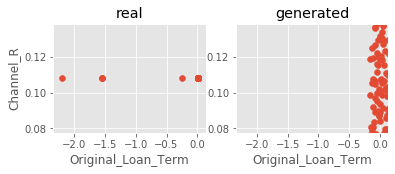

Iter: 100; D loss: 1.357; G_loss: -0.7198; xgb_loss: 1.0


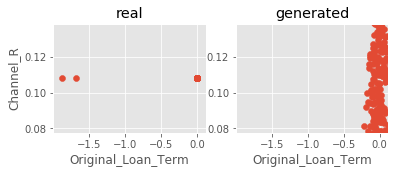

Iter: 200; D loss: 1.312; G_loss: -0.7481; xgb_loss: 0.998


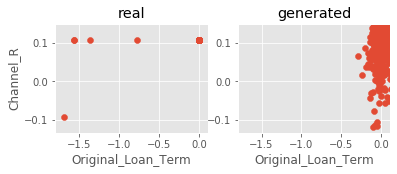

Iter: 300; D loss: 1.302; G_loss: -0.754; xgb_loss: 0.998


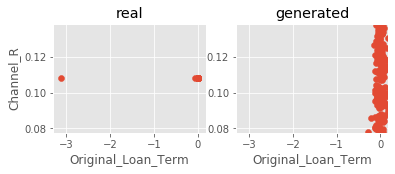

Iter: 400; D loss: 1.293; G_loss: -0.7544; xgb_loss: 1.0


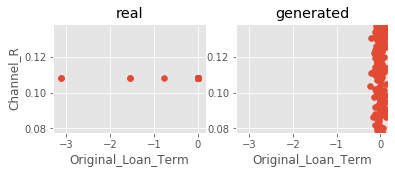

Iter: 500; D loss: 1.291; G_loss: -0.7638; xgb_loss: 1.0


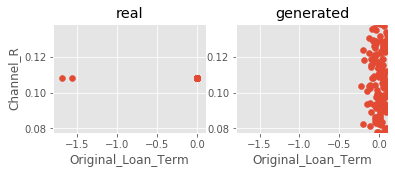

Iter: 600; D loss: 1.276; G_loss: -0.7707; xgb_loss: 1.0


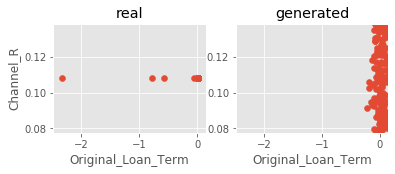

Iter: 700; D loss: 1.276; G_loss: -0.7803; xgb_loss: 1.0


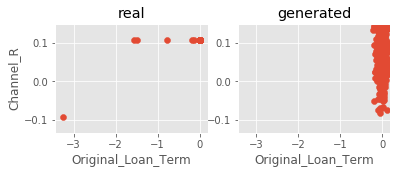

Iter: 800; D loss: 1.271; G_loss: -0.789; xgb_loss: 1.0


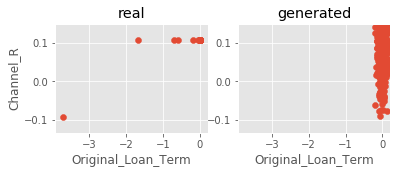

Iter: 900; D loss: 1.266; G_loss: -0.7912; xgb_loss: 1.0


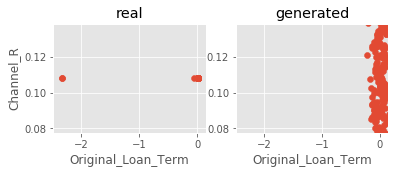

Iter: 1000; D loss: 1.269; G_loss: -0.7978; xgb_loss: 1.0


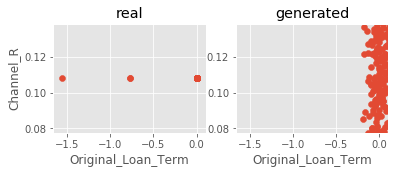

Iter: 1100; D loss: 1.268; G_loss: -0.79; xgb_loss: 1.0


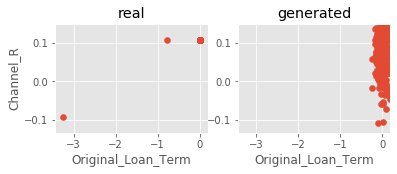

Iter: 1200; D loss: 1.294; G_loss: -0.7136; xgb_loss: 1.0


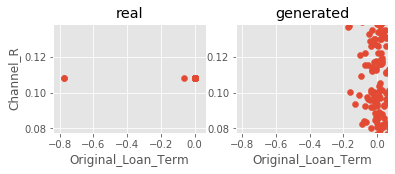

Iter: 1300; D loss: 1.278; G_loss: -0.7786; xgb_loss: 1.0


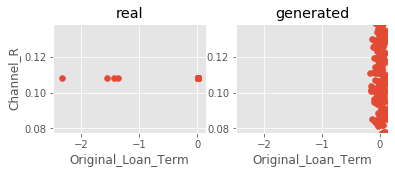

Iter: 1400; D loss: 1.259; G_loss: -0.7977; xgb_loss: 0.998


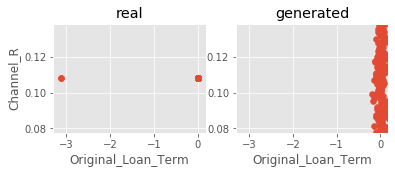

Iter: 1500; D loss: 1.247; G_loss: -0.7961; xgb_loss: 1.0


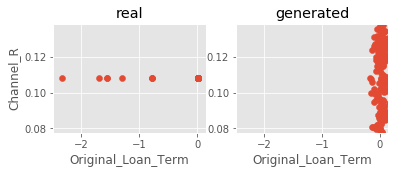

Iter: 1600; D loss: 1.241; G_loss: -0.8157; xgb_loss: 1.0


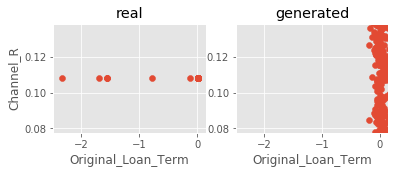

Iter: 1700; D loss: 1.272; G_loss: -0.781; xgb_loss: 1.0


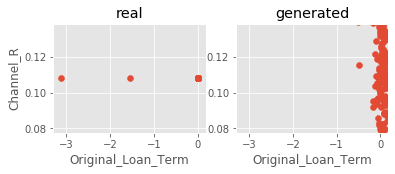

Iter: 1800; D loss: 1.204; G_loss: -0.8139; xgb_loss: 1.0


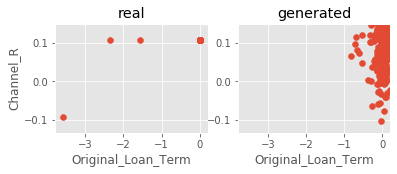

Iter: 1900; D loss: 1.178; G_loss: -0.8439; xgb_loss: 0.9959


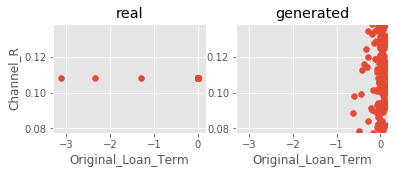

Iter: 2000; D loss: 1.162; G_loss: -0.8848; xgb_loss: 0.9959


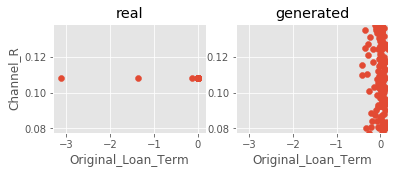

Iter: 2100; D loss: 1.18; G_loss: -0.9034; xgb_loss: 1.0


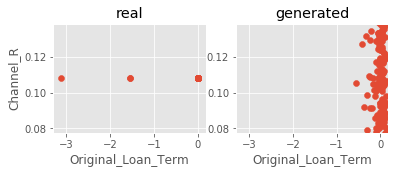

Iter: 2200; D loss: 1.15; G_loss: -0.9494; xgb_loss: 0.9919


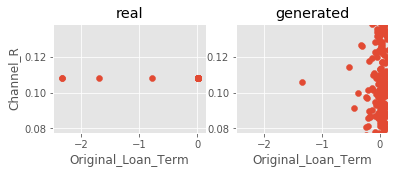

Iter: 2300; D loss: 1.149; G_loss: -0.9323; xgb_loss: 1.0


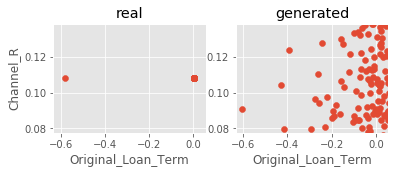

Iter: 2400; D loss: 1.255; G_loss: -0.767; xgb_loss: 1.0


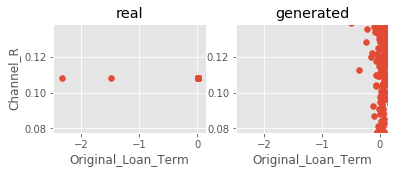

Iter: 2500; D loss: 1.192; G_loss: -0.846; xgb_loss: 0.9959


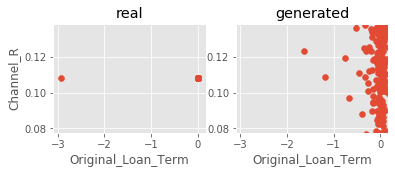

Iter: 2600; D loss: 1.186; G_loss: -0.8513; xgb_loss: 1.0


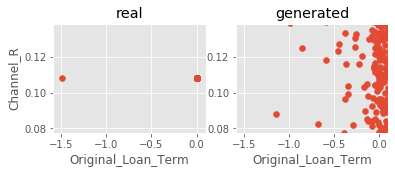

Iter: 2700; D loss: 1.193; G_loss: -0.8821; xgb_loss: 1.0


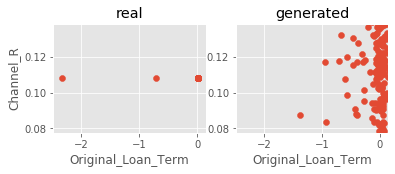

Iter: 2800; D loss: 1.163; G_loss: -0.8915; xgb_loss: 0.9939


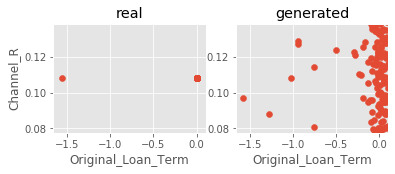

Iter: 2900; D loss: 1.134; G_loss: -0.9037; xgb_loss: 1.0


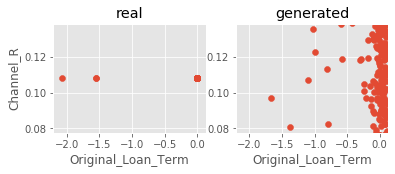

Iter: 3000; D loss: 1.117; G_loss: -0.9455; xgb_loss: 0.998


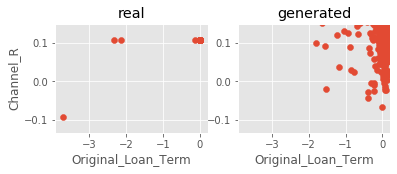

Iter: 3100; D loss: 1.117; G_loss: -0.9163; xgb_loss: 1.0


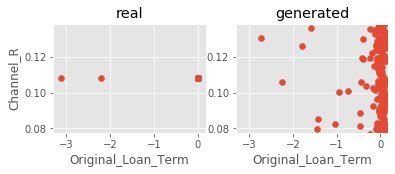

Iter: 3200; D loss: 1.126; G_loss: -0.9111; xgb_loss: 0.998


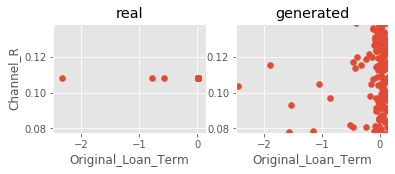

Iter: 3300; D loss: 1.091; G_loss: -0.9387; xgb_loss: 0.9959


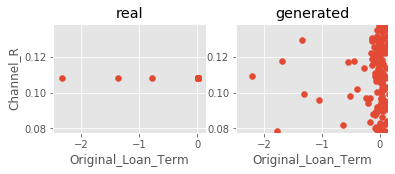

Iter: 3400; D loss: 1.096; G_loss: -0.9839; xgb_loss: 0.9919


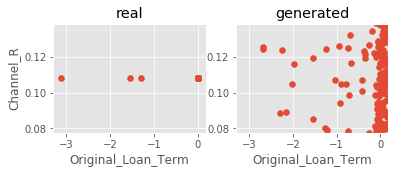

Iter: 3500; D loss: 1.085; G_loss: -0.9594; xgb_loss: 0.998


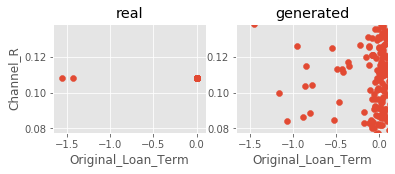

Iter: 3600; D loss: 1.197; G_loss: -0.7842; xgb_loss: 1.0


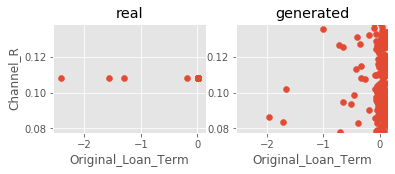

Iter: 3700; D loss: 1.205; G_loss: -0.8687; xgb_loss: 0.998


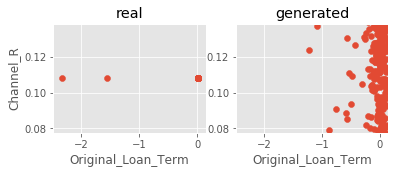

Iter: 3800; D loss: 1.216; G_loss: -0.8655; xgb_loss: 1.0


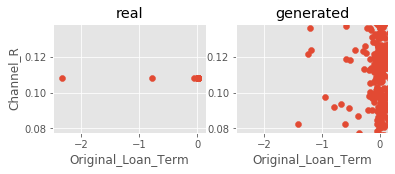

Iter: 3900; D loss: 1.189; G_loss: -0.8682; xgb_loss: 0.9959


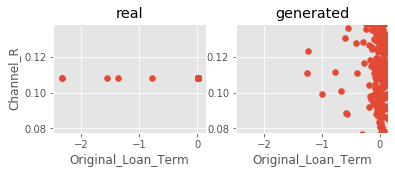

Iter: 4000; D loss: 1.159; G_loss: -0.8449; xgb_loss: 0.998


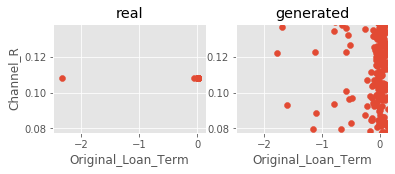

Iter: 4100; D loss: 1.324; G_loss: -0.8796; xgb_loss: 1.0


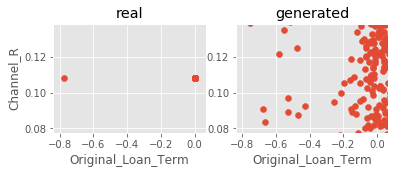

Iter: 4200; D loss: 1.159; G_loss: -0.8757; xgb_loss: 0.9959


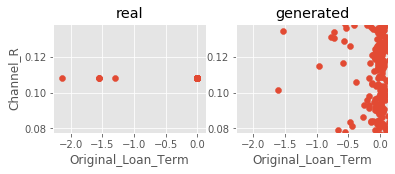

Iter: 4300; D loss: 1.183; G_loss: -0.8798; xgb_loss: 0.9939


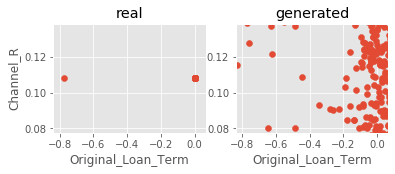

Iter: 4400; D loss: 1.209; G_loss: -0.831; xgb_loss: 0.9939


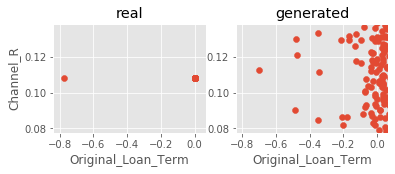

Iter: 4500; D loss: 1.164; G_loss: -0.8492; xgb_loss: 1.0


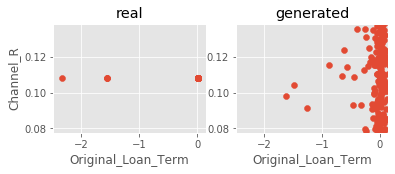

Iter: 4600; D loss: 1.159; G_loss: -0.8617; xgb_loss: 0.998


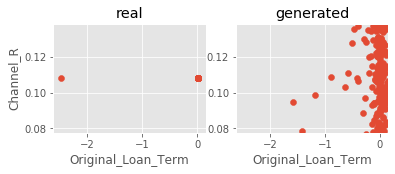

Iter: 4700; D loss: 1.152; G_loss: -0.8919; xgb_loss: 0.998


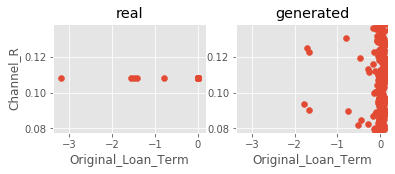

Iter: 4800; D loss: 1.272; G_loss: -0.7813; xgb_loss: 1.0


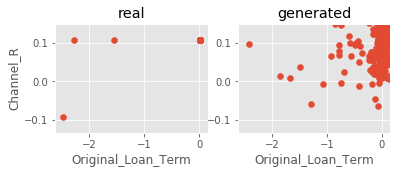

Iter: 4900; D loss: 1.258; G_loss: -0.8143; xgb_loss: 1.0


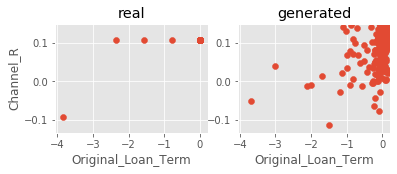

Iter: 5000; D loss: 1.219; G_loss: -0.8077; xgb_loss: 0.9919


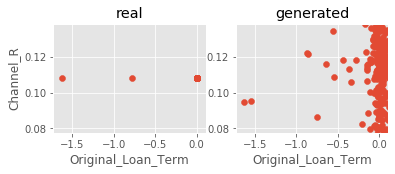

Iter: 5100; D loss: 1.211; G_loss: -0.8232; xgb_loss: 0.998


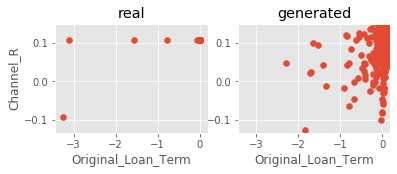

Iter: 5200; D loss: 1.194; G_loss: -0.8163; xgb_loss: 0.9959


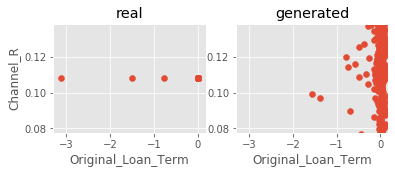

Iter: 5300; D loss: 1.25; G_loss: -0.831; xgb_loss: 1.0


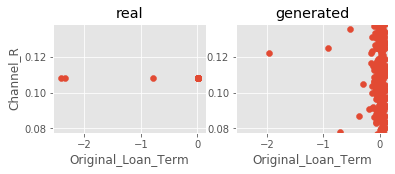

Iter: 5400; D loss: 1.207; G_loss: -0.8219; xgb_loss: 0.9959


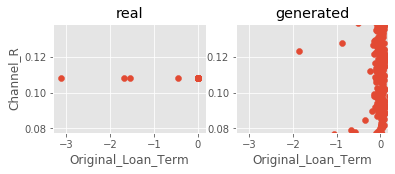

Iter: 5500; D loss: 1.199; G_loss: -0.8191; xgb_loss: 0.9939


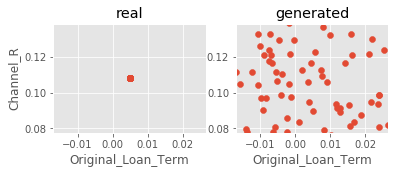

Iter: 5600; D loss: 1.223; G_loss: -0.7944; xgb_loss: 1.0


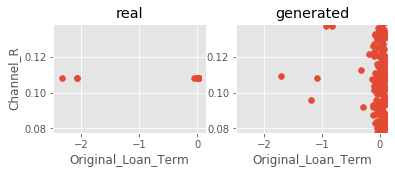

Iter: 5700; D loss: 1.22; G_loss: -0.8459; xgb_loss: 0.9878


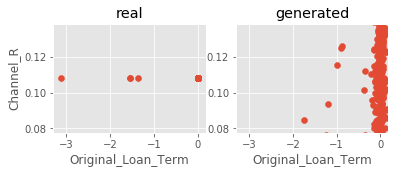

Iter: 5800; D loss: 1.199; G_loss: -0.8236; xgb_loss: 1.0


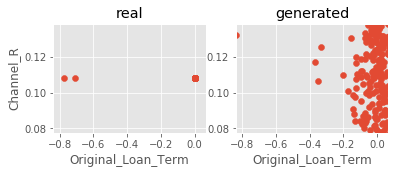

Iter: 5900; D loss: 1.222; G_loss: -0.8287; xgb_loss: 1.0


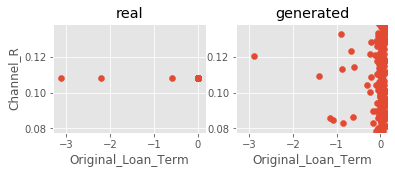

Iter: 6000; D loss: 1.246; G_loss: -0.7741; xgb_loss: 1.0


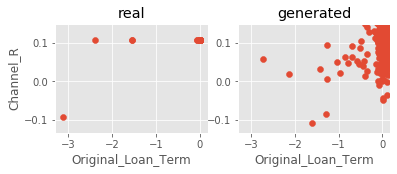

Iter: 6100; D loss: 1.221; G_loss: -0.792; xgb_loss: 1.0


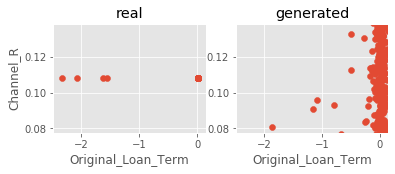

Iter: 6200; D loss: 1.225; G_loss: -0.804; xgb_loss: 1.0


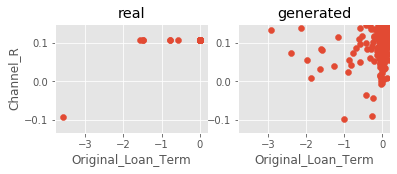

Iter: 6300; D loss: 1.223; G_loss: -0.8163; xgb_loss: 0.998


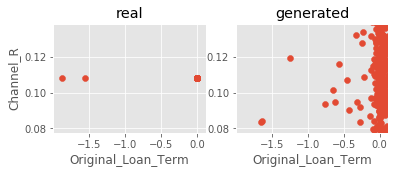

Iter: 6400; D loss: 1.205; G_loss: -0.8047; xgb_loss: 0.998


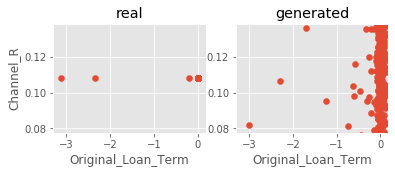

Iter: 6500; D loss: 1.2; G_loss: -0.8028; xgb_loss: 0.998


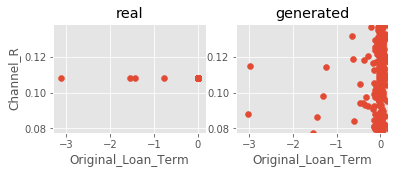

Iter: 6600; D loss: 1.228; G_loss: -0.8176; xgb_loss: 0.9919


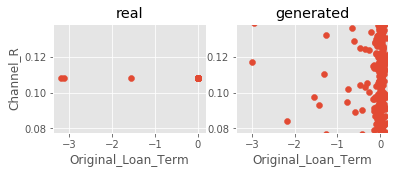

Iter: 6700; D loss: 1.199; G_loss: -0.8089; xgb_loss: 1.0


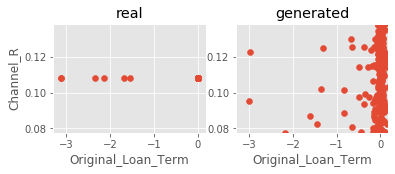

Iter: 6800; D loss: 1.198; G_loss: -0.8131; xgb_loss: 0.9898


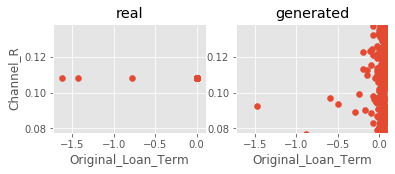

Iter: 6900; D loss: 1.219; G_loss: -0.805; xgb_loss: 0.998


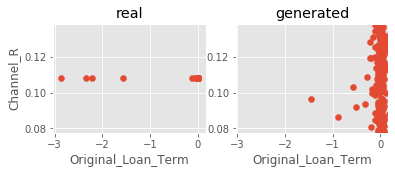

Iter: 7000; D loss: 1.216; G_loss: -0.7968; xgb_loss: 0.998


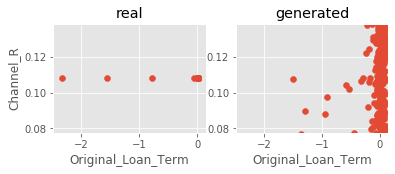

Iter: 7100; D loss: 1.342; G_loss: -0.6723; xgb_loss: 1.0


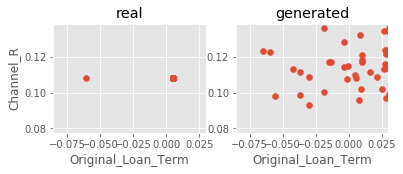

Iter: 7200; D loss: 1.283; G_loss: -0.7792; xgb_loss: 0.9959


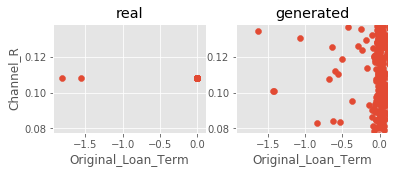

Iter: 7300; D loss: 1.273; G_loss: -0.7883; xgb_loss: 0.9959


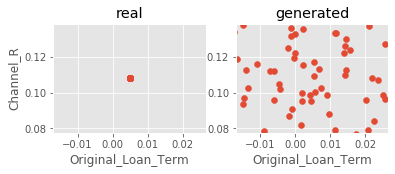

Iter: 7400; D loss: 1.263; G_loss: -0.8026; xgb_loss: 1.0


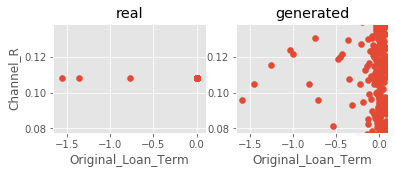

Iter: 7500; D loss: 1.265; G_loss: -0.7683; xgb_loss: 0.998


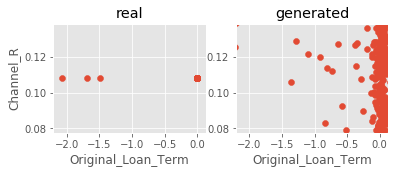

Iter: 7600; D loss: 1.262; G_loss: -0.7916; xgb_loss: 0.9939


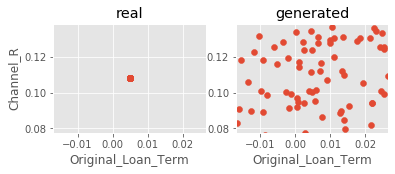

Iter: 7700; D loss: 1.251; G_loss: -0.7894; xgb_loss: 0.9959


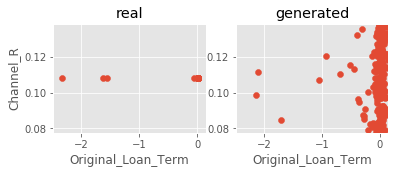

Iter: 7800; D loss: 1.267; G_loss: -0.7732; xgb_loss: 1.0


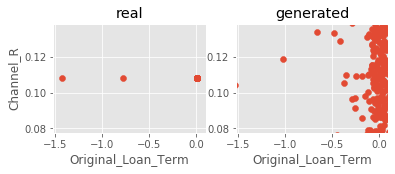

Iter: 7900; D loss: 1.261; G_loss: -0.793; xgb_loss: 0.998


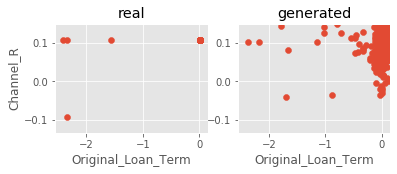

Iter: 8000; D loss: 1.269; G_loss: -0.7934; xgb_loss: 0.998


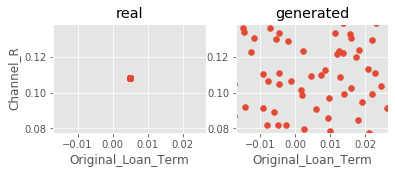

Iter: 8100; D loss: 1.283; G_loss: -0.7743; xgb_loss: 1.0


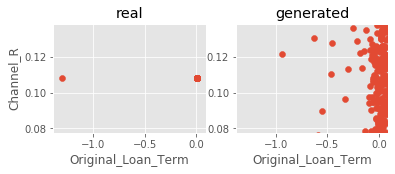

Iter: 8200; D loss: 1.264; G_loss: -0.7804; xgb_loss: 1.0


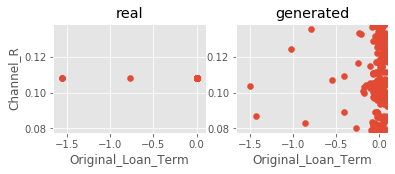

Iter: 8300; D loss: 1.319; G_loss: -0.7096; xgb_loss: 0.9939


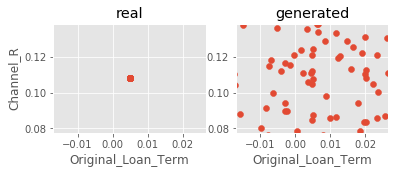

Iter: 8400; D loss: 1.291; G_loss: -0.7531; xgb_loss: 0.9959


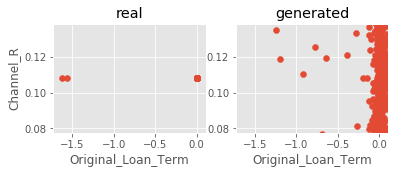

Iter: 8500; D loss: 1.277; G_loss: -0.7594; xgb_loss: 1.0


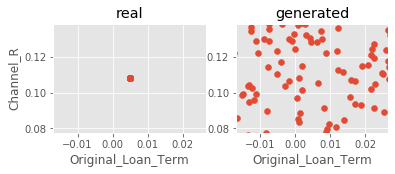

Iter: 8600; D loss: 1.282; G_loss: -0.7545; xgb_loss: 0.998


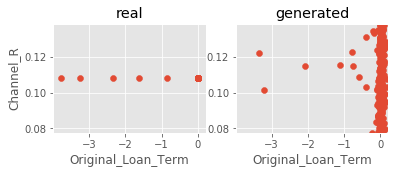

Iter: 8700; D loss: 1.277; G_loss: -0.7809; xgb_loss: 0.998


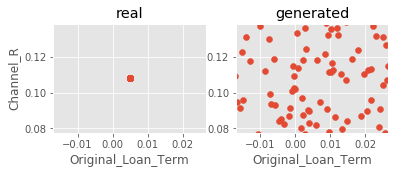

Iter: 8800; D loss: 1.255; G_loss: -0.7846; xgb_loss: 1.0


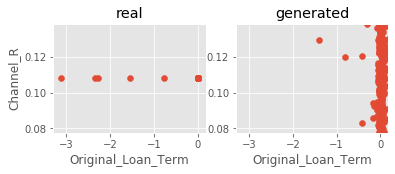

Iter: 8900; D loss: 1.257; G_loss: -0.7905; xgb_loss: 1.0


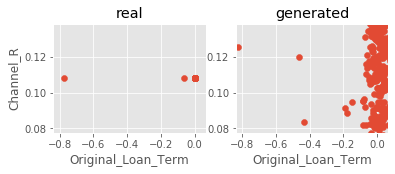

Iter: 9000; D loss: 1.292; G_loss: -0.7977; xgb_loss: 0.998


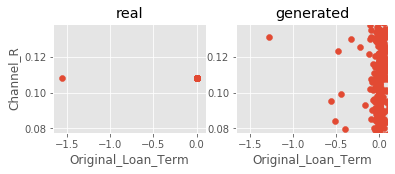

Iter: 9100; D loss: 1.233; G_loss: -0.8031; xgb_loss: 0.998


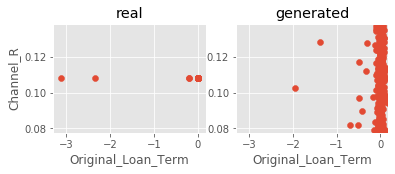

Iter: 9200; D loss: 1.361; G_loss: -0.8366; xgb_loss: 0.998


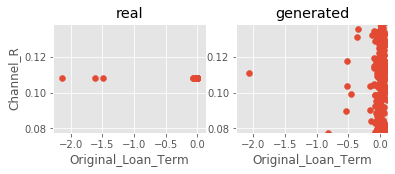

Iter: 9300; D loss: 1.253; G_loss: -0.8026; xgb_loss: 1.0


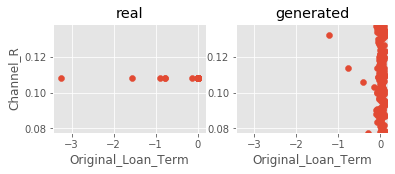

Iter: 9400; D loss: 1.3; G_loss: -0.8204; xgb_loss: 0.998


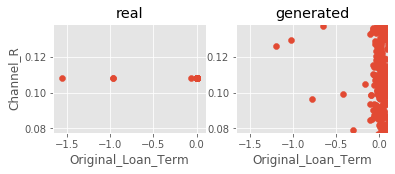

Iter: 9500; D loss: 1.288; G_loss: -0.8547; xgb_loss: 1.0


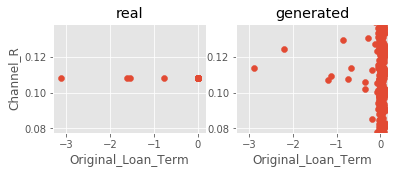

Iter: 9600; D loss: 1.247; G_loss: -0.8165; xgb_loss: 0.998


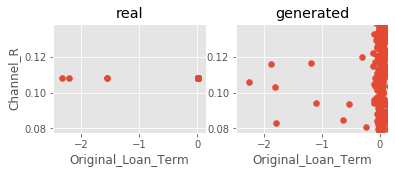

Iter: 9700; D loss: 1.249; G_loss: -0.878; xgb_loss: 0.998


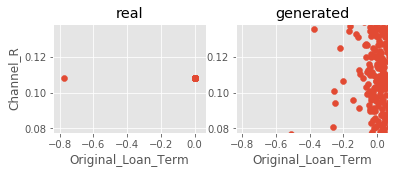

Iter: 9800; D loss: 1.235; G_loss: -0.8694; xgb_loss: 1.0


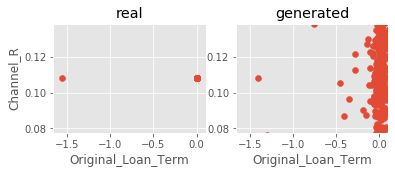

Iter: 9900; D loss: 1.232; G_loss: -0.7922; xgb_loss: 1.0


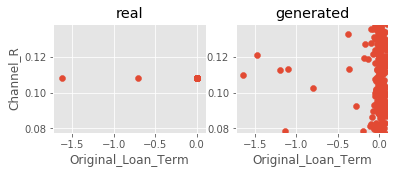

Iter: 10000; D loss: 1.211; G_loss: -0.8326; xgb_loss: 0.998


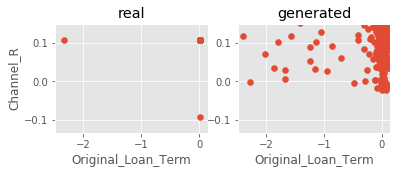

Iter: 10100; D loss: 1.281; G_loss: -0.8567; xgb_loss: 0.998


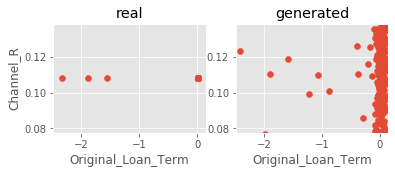

Iter: 10200; D loss: 1.226; G_loss: -0.8187; xgb_loss: 0.998


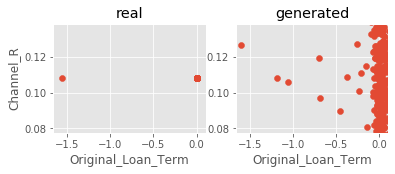

Iter: 10300; D loss: 1.2; G_loss: -0.8193; xgb_loss: 1.0


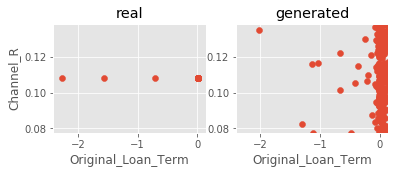

Iter: 10400; D loss: 1.204; G_loss: -0.8158; xgb_loss: 1.0


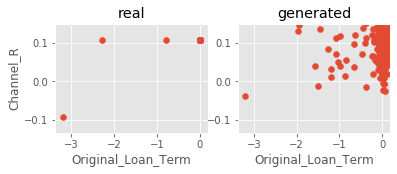

Iter: 10500; D loss: 1.234; G_loss: -0.8177; xgb_loss: 1.0


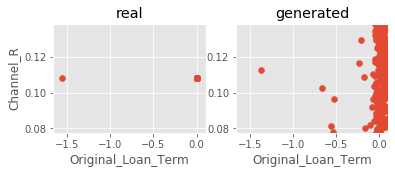

Iter: 10600; D loss: 1.21; G_loss: -0.9046; xgb_loss: 0.9837


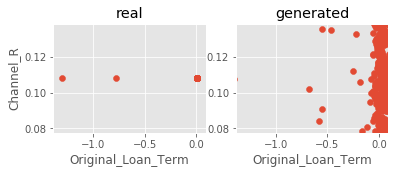

Iter: 10700; D loss: 1.242; G_loss: -0.7869; xgb_loss: 1.0


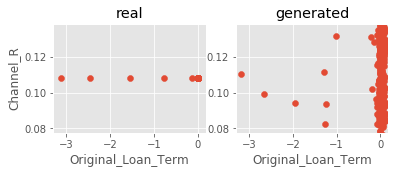

Iter: 10800; D loss: 1.207; G_loss: -0.8305; xgb_loss: 1.0


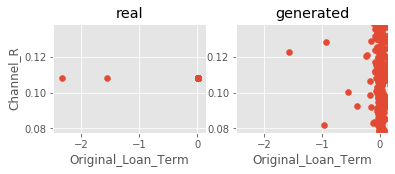

Iter: 10900; D loss: 1.216; G_loss: -0.8357; xgb_loss: 0.9959


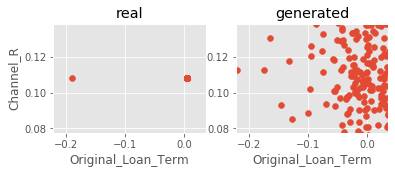

Iter: 11000; D loss: 1.195; G_loss: -0.8315; xgb_loss: 0.9919


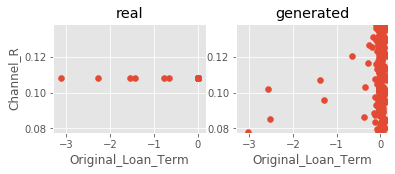

Iter: 11100; D loss: 1.196; G_loss: -0.8451; xgb_loss: 0.998


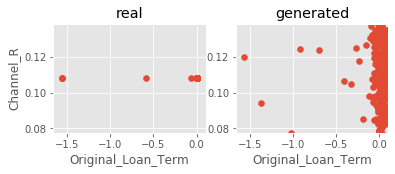

Iter: 11200; D loss: 1.193; G_loss: -0.8826; xgb_loss: 1.0


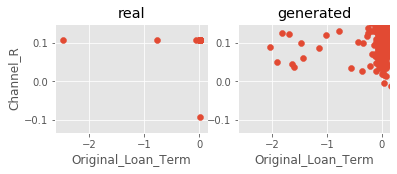

Iter: 11300; D loss: 1.234; G_loss: -0.8818; xgb_loss: 1.0


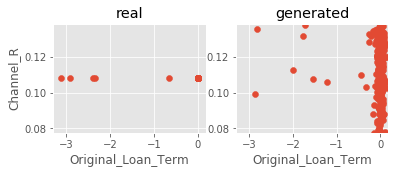

Iter: 11400; D loss: 1.184; G_loss: -0.9026; xgb_loss: 0.998


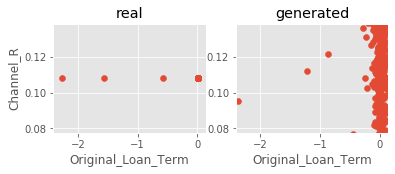

Iter: 11500; D loss: 1.175; G_loss: -0.893; xgb_loss: 1.0


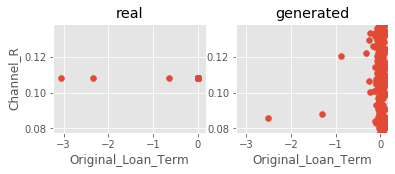

Iter: 11600; D loss: 1.199; G_loss: -0.9231; xgb_loss: 1.0


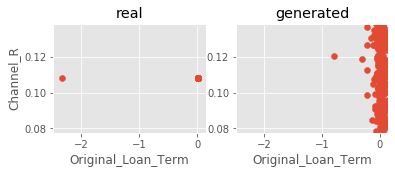

Iter: 11700; D loss: 1.177; G_loss: -0.9093; xgb_loss: 1.0


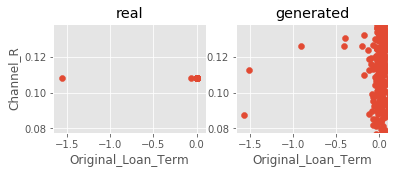

Iter: 11800; D loss: 1.21; G_loss: -0.9192; xgb_loss: 0.998


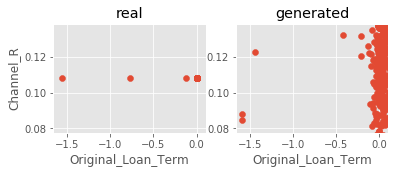

Iter: 11900; D loss: 1.219; G_loss: -0.7448; xgb_loss: 1.0


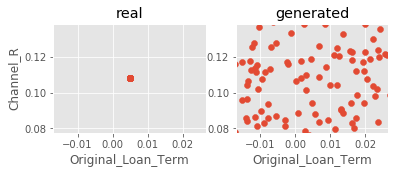

Iter: 12000; D loss: 1.211; G_loss: -0.7795; xgb_loss: 0.998


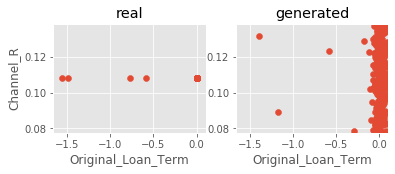

Iter: 12100; D loss: 1.446; G_loss: -0.8567; xgb_loss: 0.9898


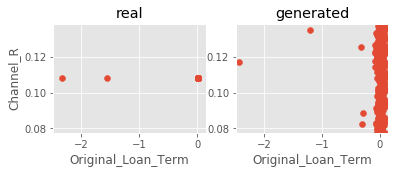

Iter: 12200; D loss: 1.197; G_loss: -0.8368; xgb_loss: 1.0


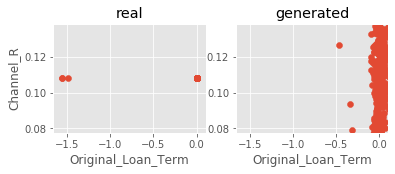

Iter: 12300; D loss: 1.191; G_loss: -0.814; xgb_loss: 0.9898


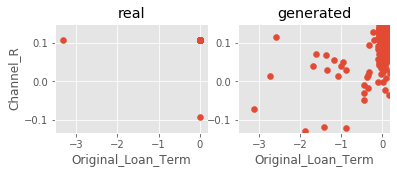

Iter: 12400; D loss: 1.846; G_loss: -0.8825; xgb_loss: 1.0


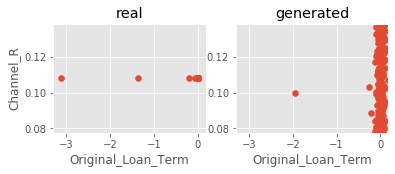

Iter: 12500; D loss: 1.188; G_loss: -0.8627; xgb_loss: 0.9959


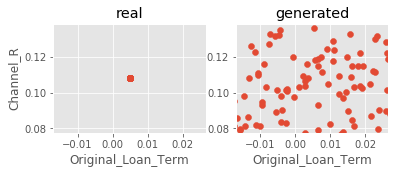

Iter: 12600; D loss: 1.191; G_loss: -0.8684; xgb_loss: 1.0


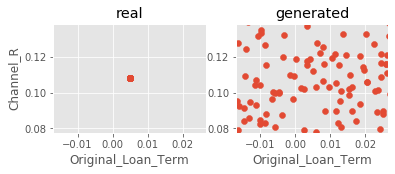

Iter: 12700; D loss: 1.205; G_loss: -0.8808; xgb_loss: 0.9939


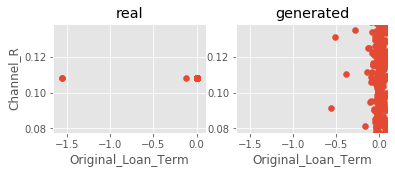

Iter: 12800; D loss: 1.165; G_loss: -0.9004; xgb_loss: 1.0


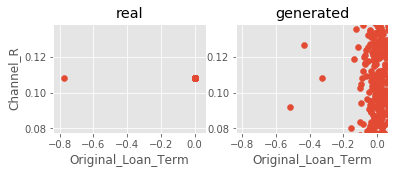

Iter: 12900; D loss: 1.175; G_loss: -0.9047; xgb_loss: 1.0


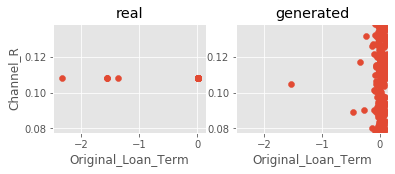

Iter: 13000; D loss: 1.165; G_loss: -0.9171; xgb_loss: 0.998


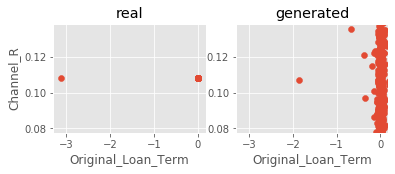

Iter: 13100; D loss: 1.258; G_loss: -0.8039; xgb_loss: 1.0


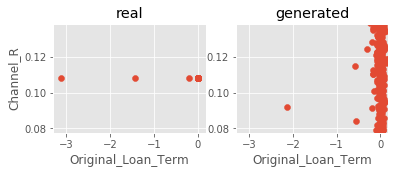

Iter: 13200; D loss: 1.261; G_loss: -0.8537; xgb_loss: 0.9959


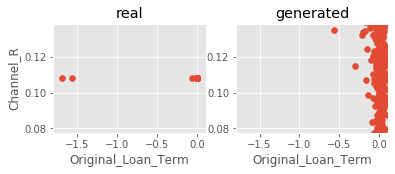

Iter: 13300; D loss: 1.263; G_loss: -0.8628; xgb_loss: 1.0


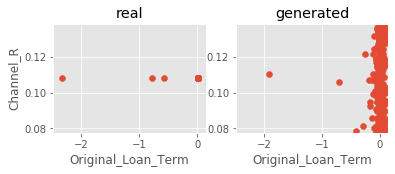

Iter: 13400; D loss: 1.249; G_loss: -0.932; xgb_loss: 0.998


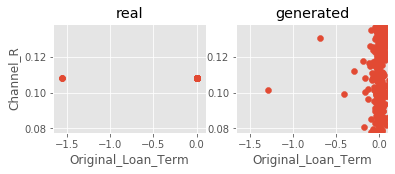

Iter: 13500; D loss: 1.258; G_loss: -0.8889; xgb_loss: 1.0


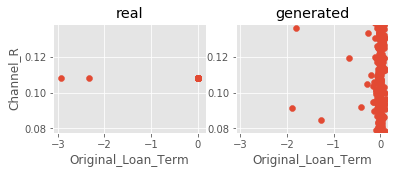

Iter: 13600; D loss: 1.248; G_loss: -0.8715; xgb_loss: 0.998


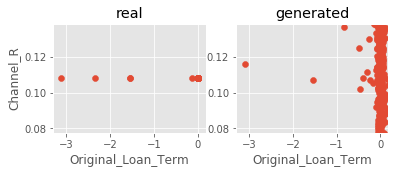

Iter: 13700; D loss: 1.245; G_loss: -0.8974; xgb_loss: 0.998


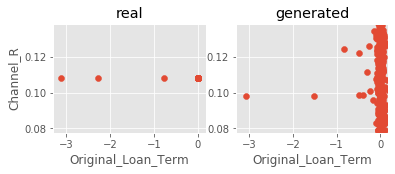

Iter: 13800; D loss: 1.226; G_loss: -0.9008; xgb_loss: 0.998


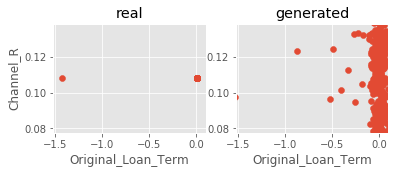

Iter: 13900; D loss: 1.242; G_loss: -0.9271; xgb_loss: 0.9939


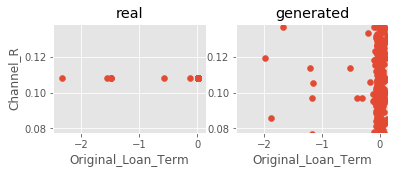

Iter: 14000; D loss: 1.223; G_loss: -0.9903; xgb_loss: 0.9959


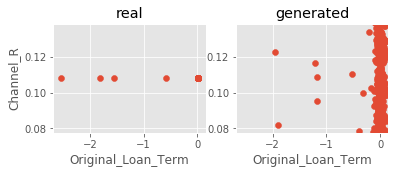

Iter: 14100; D loss: 1.23; G_loss: -0.9464; xgb_loss: 1.0


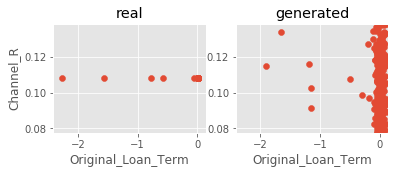

Iter: 14200; D loss: 1.315; G_loss: -0.7219; xgb_loss: 1.0


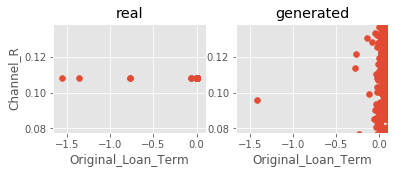

Iter: 14300; D loss: 1.218; G_loss: -0.8675; xgb_loss: 1.0


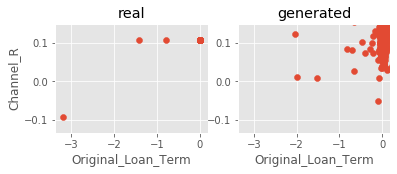

Iter: 14400; D loss: 1.213; G_loss: -0.9031; xgb_loss: 0.998


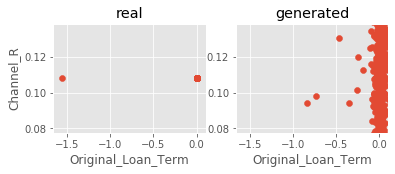

Iter: 14500; D loss: 1.231; G_loss: -0.8946; xgb_loss: 1.0


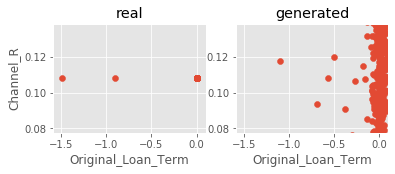

Iter: 14600; D loss: 1.232; G_loss: -0.8876; xgb_loss: 1.0


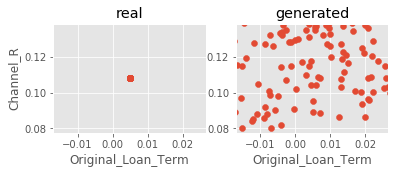

Iter: 14700; D loss: 1.226; G_loss: -0.9193; xgb_loss: 0.998


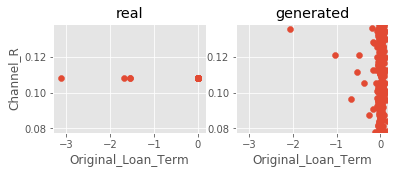

Iter: 14800; D loss: 1.86; G_loss: -0.9885; xgb_loss: 0.9939


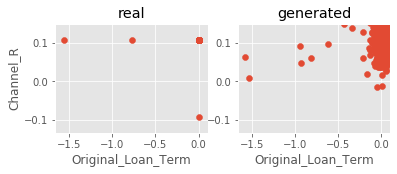

Iter: 14900; D loss: 1.213; G_loss: -0.8965; xgb_loss: 1.0


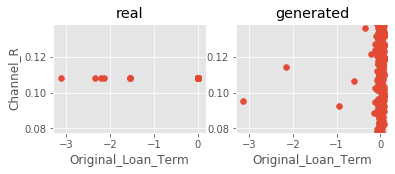

Iter: 15000; D loss: 1.184; G_loss: -0.93; xgb_loss: 0.9959


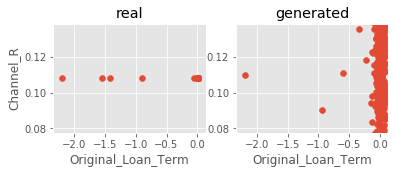

Iter: 15100; D loss: 1.188; G_loss: -0.9581; xgb_loss: 1.0


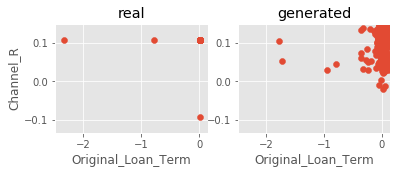

Iter: 15200; D loss: 1.182; G_loss: -0.9481; xgb_loss: 0.998


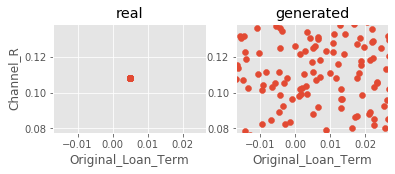

Iter: 15300; D loss: 1.177; G_loss: -0.9596; xgb_loss: 1.0


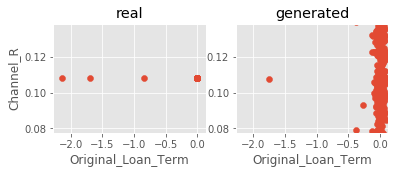

Iter: 15400; D loss: 1.309; G_loss: -0.9919; xgb_loss: 0.9959


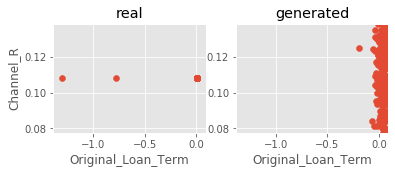

Iter: 15500; D loss: 1.232; G_loss: -1.098; xgb_loss: 0.998


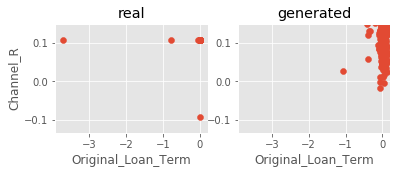

Iter: 15600; D loss: 1.199; G_loss: -1.18; xgb_loss: 1.0


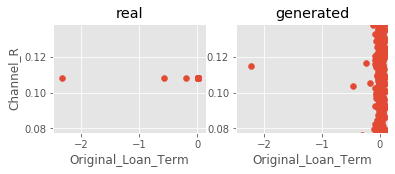

Iter: 15700; D loss: 1.199; G_loss: -1.278; xgb_loss: 1.0


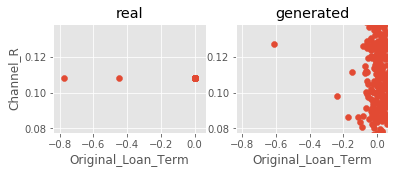

Iter: 15800; D loss: 1.187; G_loss: -1.287; xgb_loss: 0.998


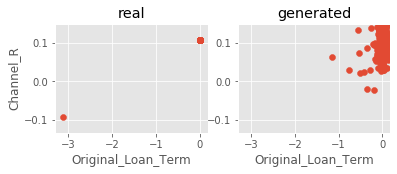

Iter: 15900; D loss: 1.187; G_loss: -1.361; xgb_loss: 0.998


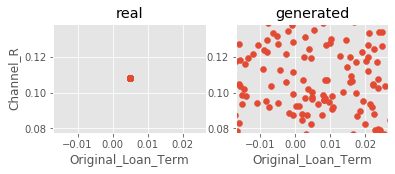

Iter: 16000; D loss: 1.191; G_loss: -1.31; xgb_loss: 0.9959


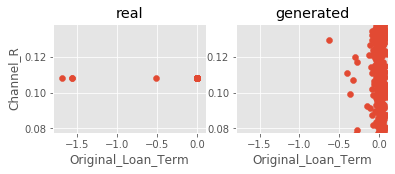

Iter: 16100; D loss: 1.165; G_loss: -1.387; xgb_loss: 1.0


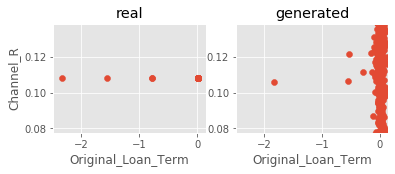

Iter: 16200; D loss: 1.203; G_loss: -1.393; xgb_loss: 0.9898


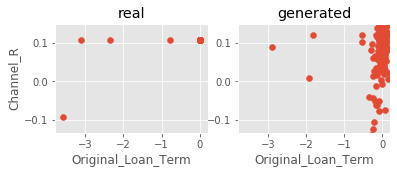

Iter: 16300; D loss: 1.186; G_loss: -1.474; xgb_loss: 0.9919


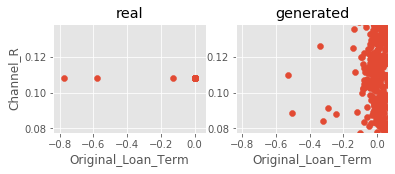

Iter: 16400; D loss: 1.212; G_loss: -1.502; xgb_loss: 0.9959


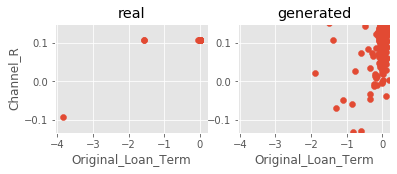

Iter: 16500; D loss: 1.182; G_loss: -1.44; xgb_loss: 0.9919


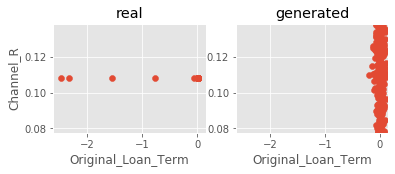

Iter: 16600; D loss: 1.234; G_loss: -0.8656; xgb_loss: 0.9959


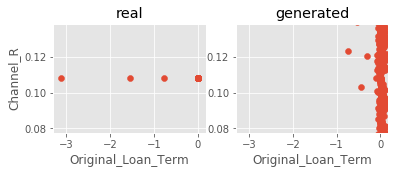

Iter: 16700; D loss: 1.188; G_loss: -1.012; xgb_loss: 1.0


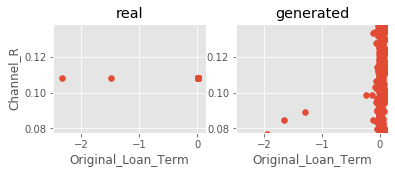

Iter: 16800; D loss: 1.179; G_loss: -1.112; xgb_loss: 1.0


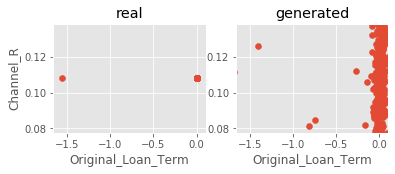

Iter: 16900; D loss: 1.183; G_loss: -1.075; xgb_loss: 1.0


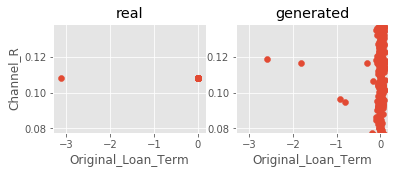

Iter: 17000; D loss: 1.131; G_loss: -1.031; xgb_loss: 1.0


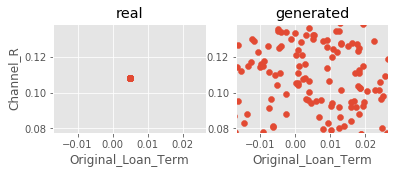

Iter: 17100; D loss: 1.125; G_loss: -1.064; xgb_loss: 1.0


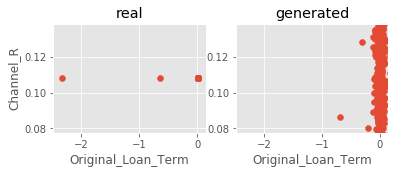

Iter: 17200; D loss: 1.115; G_loss: -1.007; xgb_loss: 0.998


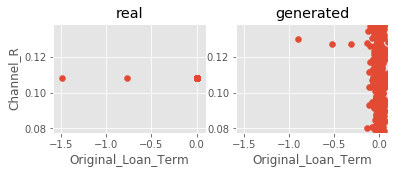

Iter: 17300; D loss: 1.088; G_loss: -1.018; xgb_loss: 1.0


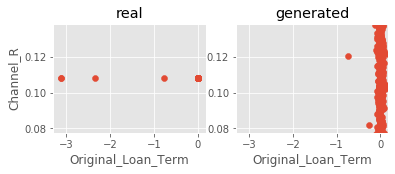

Iter: 17400; D loss: 1.152; G_loss: -1.027; xgb_loss: 0.998


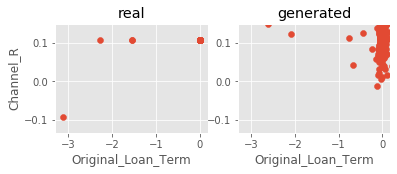

Iter: 17500; D loss: 1.663; G_loss: -1.101; xgb_loss: 0.998


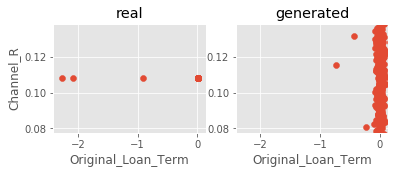

Iter: 17600; D loss: 1.116; G_loss: -1.068; xgb_loss: 0.998


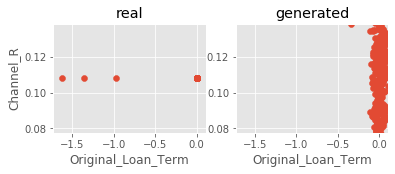

Iter: 17700; D loss: 1.449; G_loss: -1.057; xgb_loss: 0.998


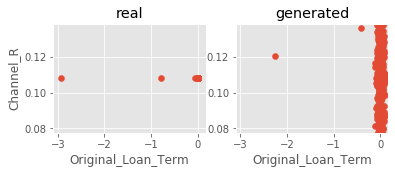

Iter: 17800; D loss: 1.277; G_loss: -0.9059; xgb_loss: 1.0


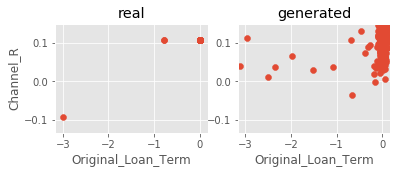

Iter: 17900; D loss: 1.253; G_loss: -0.8826; xgb_loss: 1.0


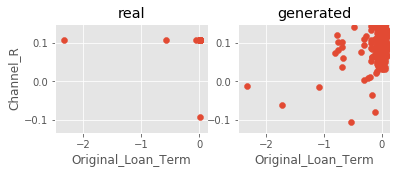

Iter: 18000; D loss: 1.288; G_loss: -0.987; xgb_loss: 1.0


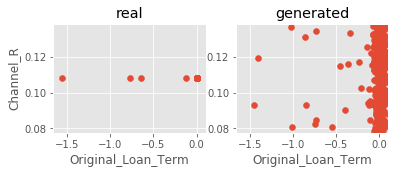

Iter: 18100; D loss: 1.214; G_loss: -0.9694; xgb_loss: 0.998


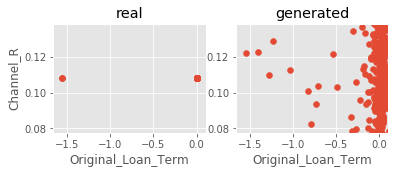

Iter: 18200; D loss: 1.195; G_loss: -0.9359; xgb_loss: 1.0


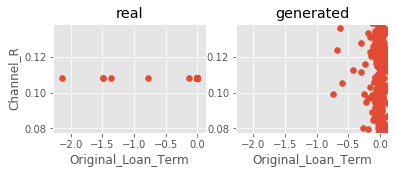

Iter: 18300; D loss: 1.193; G_loss: -0.9413; xgb_loss: 0.998


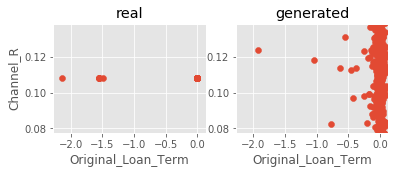

Iter: 18400; D loss: 1.227; G_loss: -0.9915; xgb_loss: 1.0


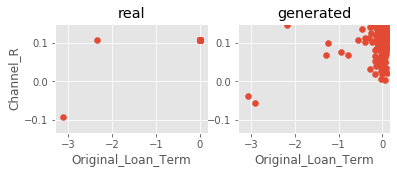

Iter: 18500; D loss: 1.461; G_loss: -0.9575; xgb_loss: 0.998


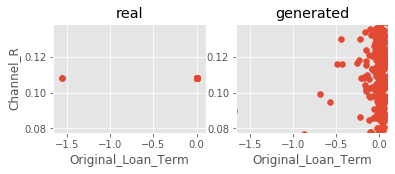

Iter: 18600; D loss: 1.356; G_loss: -0.9511; xgb_loss: 1.0


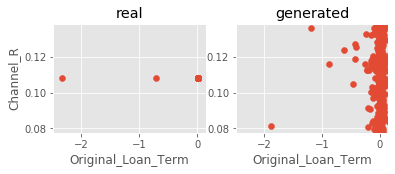

Iter: 18700; D loss: 1.23; G_loss: -0.959; xgb_loss: 1.0


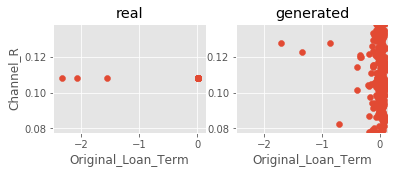

Iter: 18800; D loss: 1.28; G_loss: -0.9331; xgb_loss: 1.0


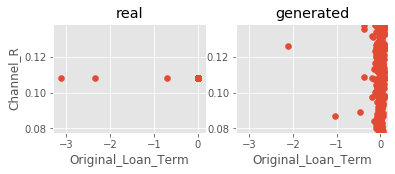

Iter: 18900; D loss: 1.318; G_loss: -0.9099; xgb_loss: 0.998


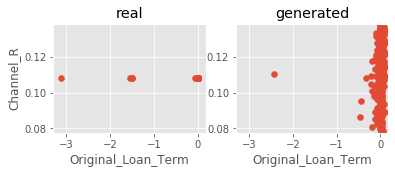

Iter: 19000; D loss: 1.288; G_loss: -0.8443; xgb_loss: 0.998


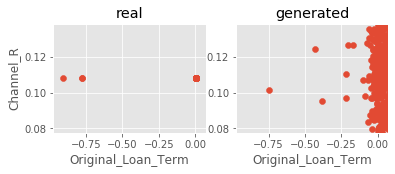

Iter: 19100; D loss: 1.324; G_loss: -0.8679; xgb_loss: 1.0


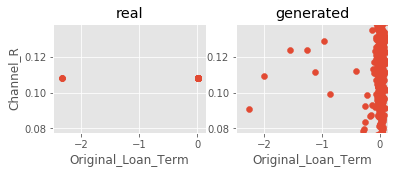

Iter: 19200; D loss: 1.338; G_loss: -0.8771; xgb_loss: 0.998


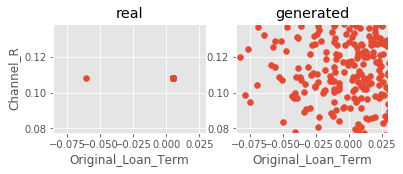

Iter: 19300; D loss: 1.308; G_loss: -0.9014; xgb_loss: 0.9959


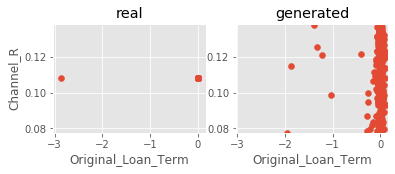

Iter: 19400; D loss: 1.262; G_loss: -0.8722; xgb_loss: 1.0


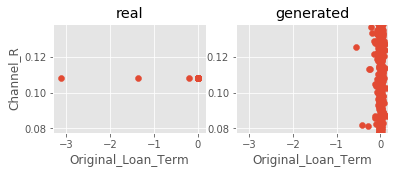

Iter: 19500; D loss: 1.24; G_loss: -0.9074; xgb_loss: 0.998


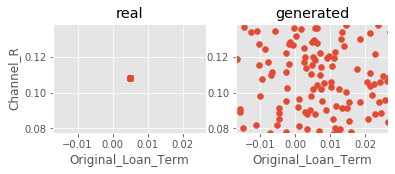

Iter: 19600; D loss: 1.27; G_loss: -0.884; xgb_loss: 0.9959


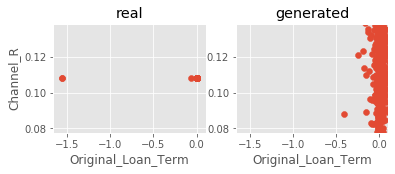

Iter: 19700; D loss: 1.262; G_loss: -0.8856; xgb_loss: 0.998


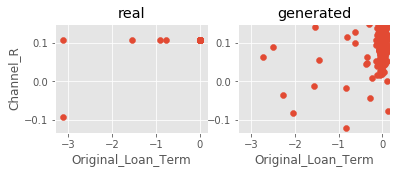

Iter: 19800; D loss: 1.286; G_loss: -0.885; xgb_loss: 1.0


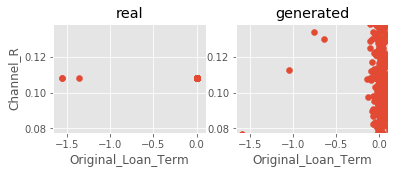

Iter: 19900; D loss: 1.264; G_loss: -0.8906; xgb_loss: 0.9959


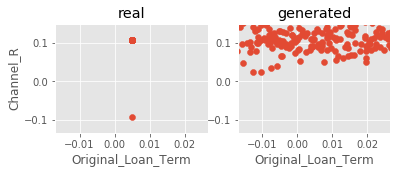

Iter: 20000; D loss: 1.289; G_loss: -0.8853; xgb_loss: 0.9919


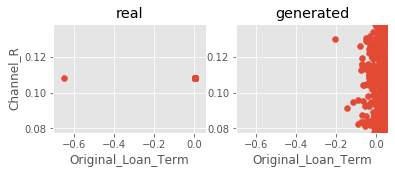

Iter: 20100; D loss: 1.257; G_loss: -0.9187; xgb_loss: 1.0


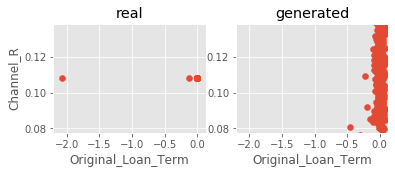

Iter: 20200; D loss: 1.316; G_loss: -0.8569; xgb_loss: 0.998


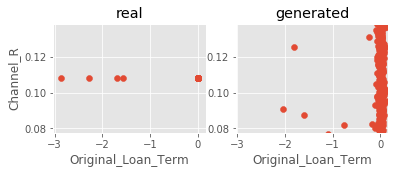

Iter: 20300; D loss: 1.311; G_loss: -0.8685; xgb_loss: 1.0


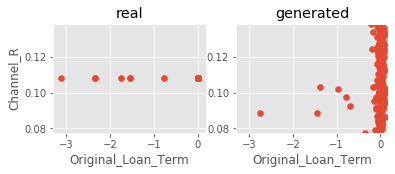

Iter: 20400; D loss: 1.297; G_loss: -0.9095; xgb_loss: 1.0


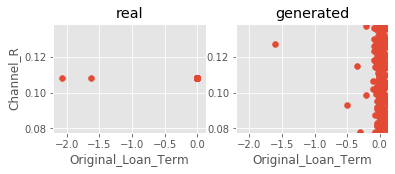

Iter: 20500; D loss: 1.295; G_loss: -0.9005; xgb_loss: 0.998


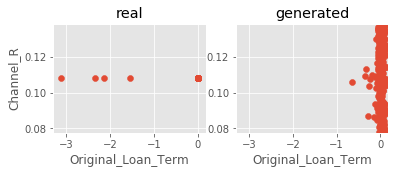

Iter: 20600; D loss: 1.308; G_loss: -0.9407; xgb_loss: 0.998


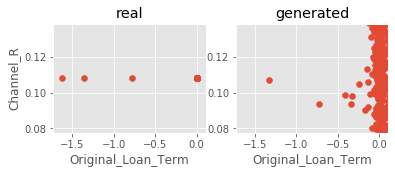

Iter: 20700; D loss: 1.299; G_loss: -0.9263; xgb_loss: 0.9939


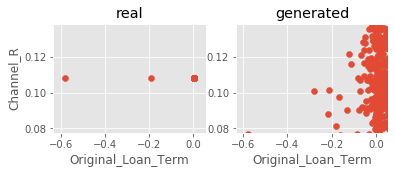

Iter: 20800; D loss: 1.307; G_loss: -0.8923; xgb_loss: 0.9959


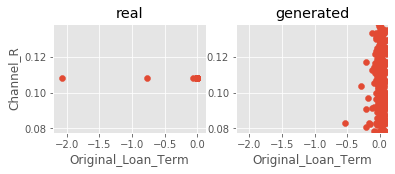

Iter: 20900; D loss: 1.282; G_loss: -0.928; xgb_loss: 1.0


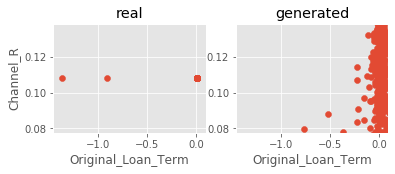

Iter: 21000; D loss: 1.294; G_loss: -0.9093; xgb_loss: 0.9959


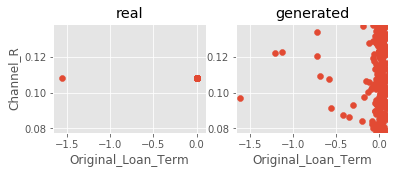

Iter: 21100; D loss: 1.293; G_loss: -0.9208; xgb_loss: 1.0


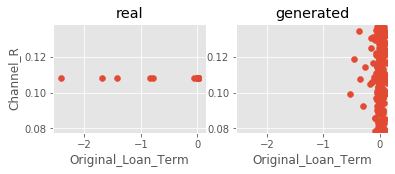

Iter: 21200; D loss: 1.299; G_loss: -0.9154; xgb_loss: 0.9939


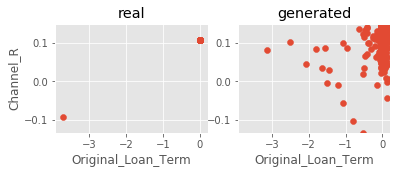

Iter: 21300; D loss: 1.312; G_loss: -0.8997; xgb_loss: 0.9939


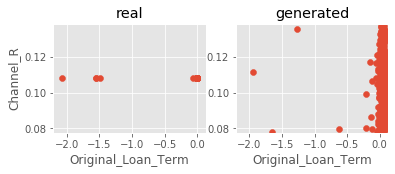

Iter: 21400; D loss: 1.293; G_loss: -1.046; xgb_loss: 0.9919


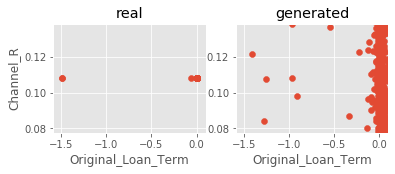

Iter: 21500; D loss: 1.293; G_loss: -1.059; xgb_loss: 1.0


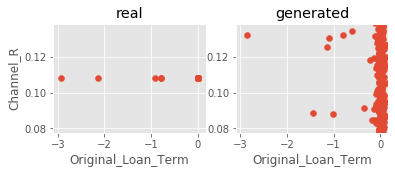

Iter: 21600; D loss: 1.265; G_loss: -1.07; xgb_loss: 0.9959


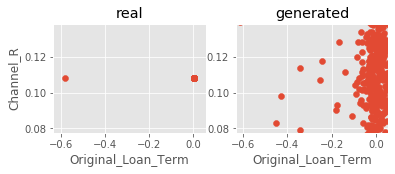

Iter: 21700; D loss: 1.286; G_loss: -1.063; xgb_loss: 1.0


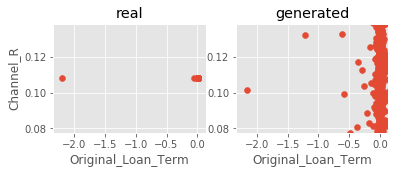

Iter: 21800; D loss: 1.274; G_loss: -1.055; xgb_loss: 0.9939


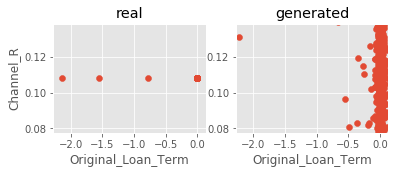

Iter: 21900; D loss: 1.28; G_loss: -1.049; xgb_loss: 0.9959


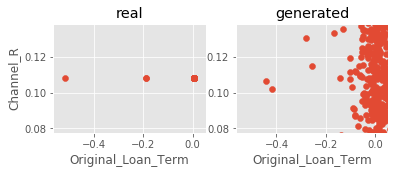

Iter: 22000; D loss: 1.272; G_loss: -1.067; xgb_loss: 0.9959


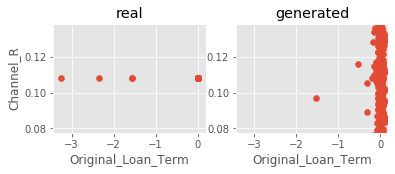

Iter: 22100; D loss: 1.271; G_loss: -1.052; xgb_loss: 1.0


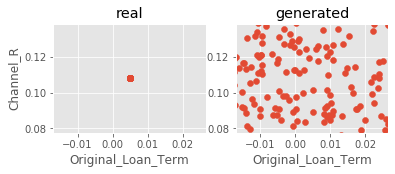

Iter: 22200; D loss: 1.277; G_loss: -1.063; xgb_loss: 0.9959


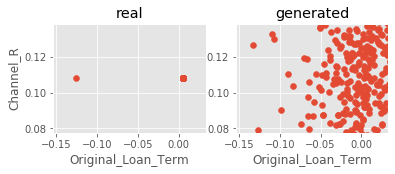

Iter: 22300; D loss: 1.234; G_loss: -1.05; xgb_loss: 1.0


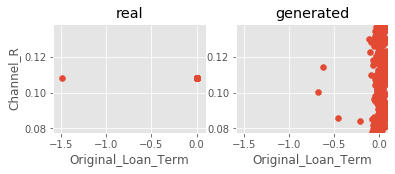

Iter: 22400; D loss: 1.263; G_loss: -1.082; xgb_loss: 0.9959


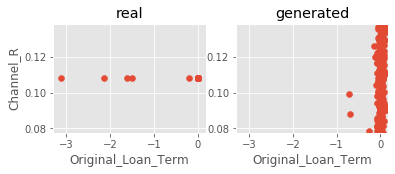

Iter: 22500; D loss: 1.324; G_loss: -0.7935; xgb_loss: 0.9898


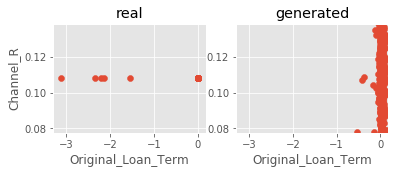

Iter: 22600; D loss: 1.302; G_loss: -0.8198; xgb_loss: 0.9939


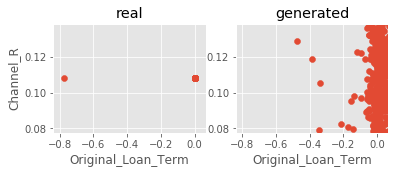

Iter: 22700; D loss: 1.309; G_loss: -0.8163; xgb_loss: 1.0


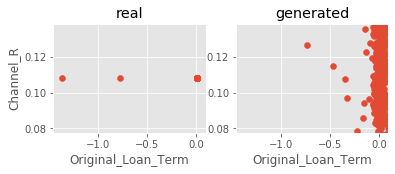

Iter: 22800; D loss: 1.292; G_loss: -0.8335; xgb_loss: 0.998


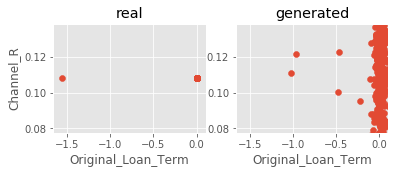

Iter: 22900; D loss: 1.301; G_loss: -0.8377; xgb_loss: 0.9959


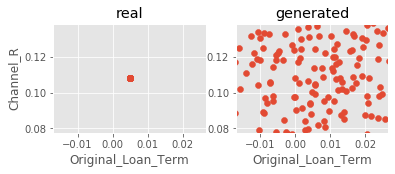

Iter: 23000; D loss: 1.308; G_loss: -0.8464; xgb_loss: 0.9939


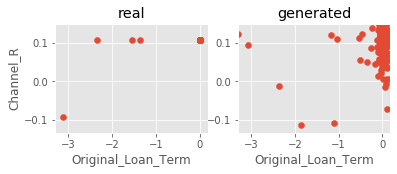

Iter: 23100; D loss: 1.3; G_loss: -0.8502; xgb_loss: 1.0


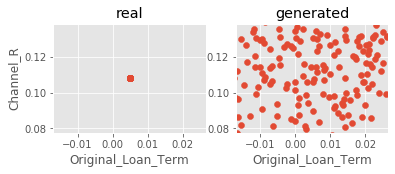

Iter: 23200; D loss: 1.287; G_loss: -0.8234; xgb_loss: 0.998


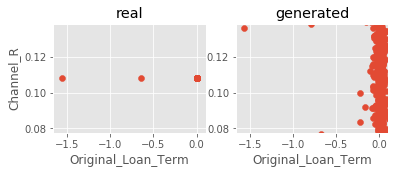

Iter: 23300; D loss: 1.31; G_loss: -0.8368; xgb_loss: 0.998


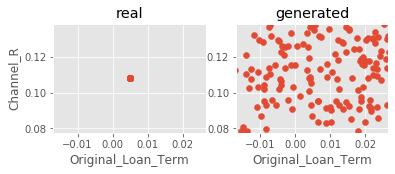

Iter: 23400; D loss: 1.3; G_loss: -0.8354; xgb_loss: 0.9959


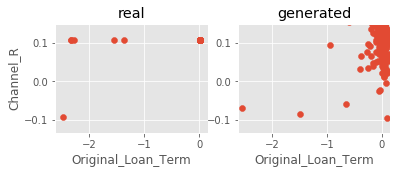

Iter: 23500; D loss: 1.29; G_loss: -0.8617; xgb_loss: 1.0


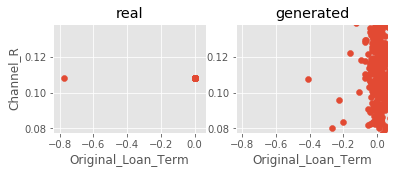

Iter: 23600; D loss: 1.291; G_loss: -0.8661; xgb_loss: 0.9919


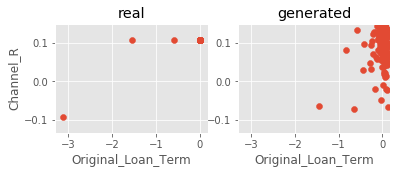

Iter: 23700; D loss: 1.326; G_loss: -0.8049; xgb_loss: 0.9959


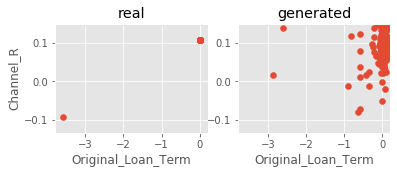

Iter: 23800; D loss: 1.295; G_loss: -0.8503; xgb_loss: 1.0


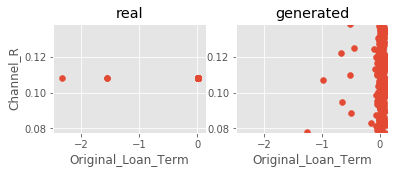

Iter: 23900; D loss: 1.303; G_loss: -0.8802; xgb_loss: 0.9959


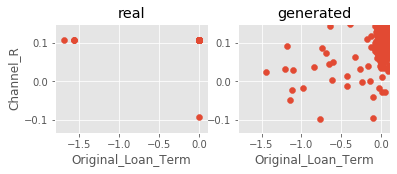

Iter: 24000; D loss: 1.29; G_loss: -0.8572; xgb_loss: 0.998


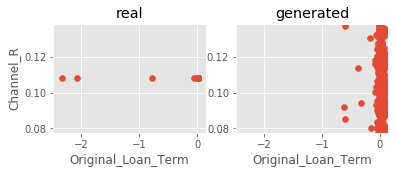

Iter: 24100; D loss: 1.289; G_loss: -0.8704; xgb_loss: 0.998


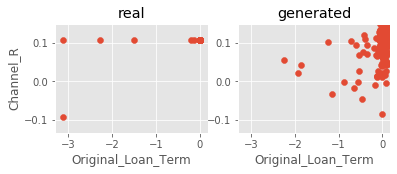

Iter: 24200; D loss: 1.267; G_loss: -0.8356; xgb_loss: 0.9898


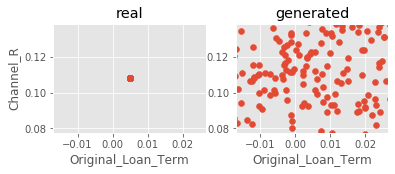

Iter: 24300; D loss: 1.3; G_loss: -0.8977; xgb_loss: 0.9959


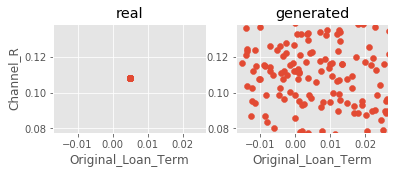

Iter: 24400; D loss: 1.313; G_loss: -1.003; xgb_loss: 1.0


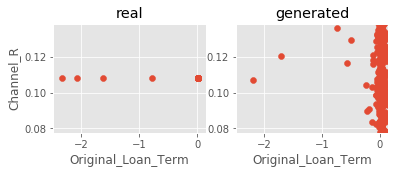

Iter: 24500; D loss: 1.295; G_loss: -0.9798; xgb_loss: 1.0


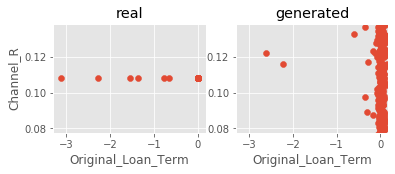

Iter: 24600; D loss: 1.258; G_loss: -1.004; xgb_loss: 1.0


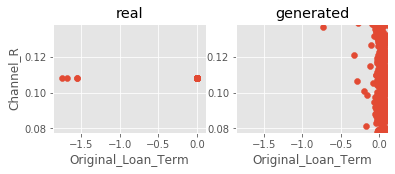

Iter: 24700; D loss: 1.279; G_loss: -1.105; xgb_loss: 0.998


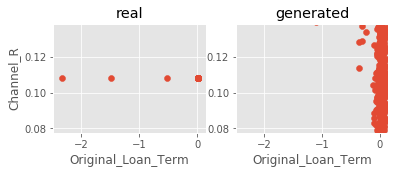

Iter: 24800; D loss: 1.272; G_loss: -1.091; xgb_loss: 0.998


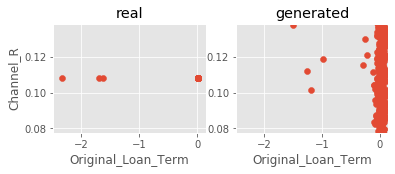

Iter: 24900; D loss: 1.977; G_loss: -2.094; xgb_loss: 1.0


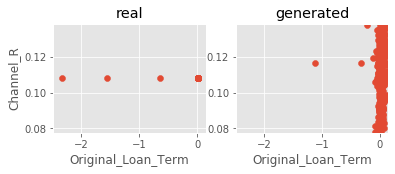

Iter: 25000; D loss: 1.775; G_loss: -3.087; xgb_loss: 0.9939


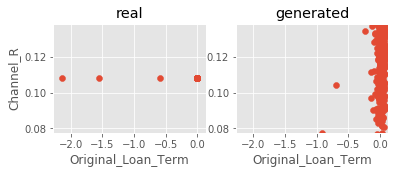

Iter: 25100; D loss: 1.426; G_loss: -2.787; xgb_loss: 0.9939


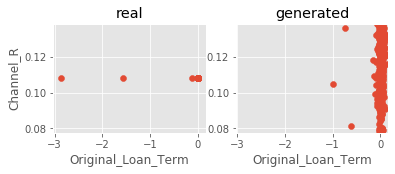

Iter: 25200; D loss: 1.45; G_loss: -3.114; xgb_loss: 0.9939


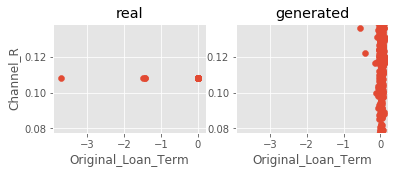

Iter: 25300; D loss: 1.392; G_loss: -4.028; xgb_loss: 0.9898


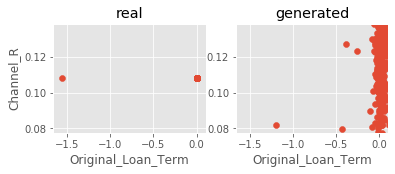

Iter: 25400; D loss: 1.429; G_loss: -4.187; xgb_loss: 0.9878


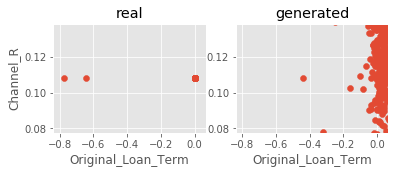

Iter: 25500; D loss: 1.277; G_loss: -4.172; xgb_loss: 0.9898


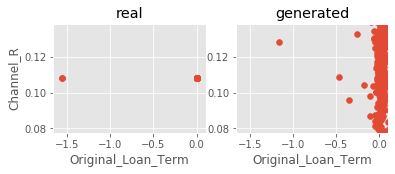

Iter: 25600; D loss: 1.367; G_loss: -4.484; xgb_loss: 0.9939


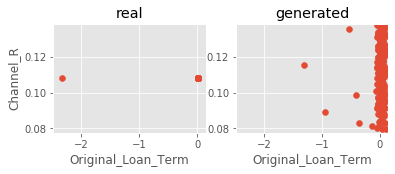

Iter: 25700; D loss: 1.272; G_loss: -4.481; xgb_loss: 0.9959


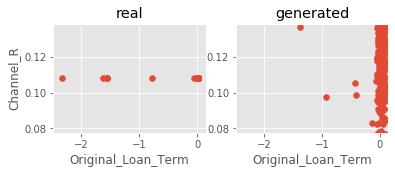

Iter: 25800; D loss: 1.05; G_loss: -4.404; xgb_loss: 0.9939


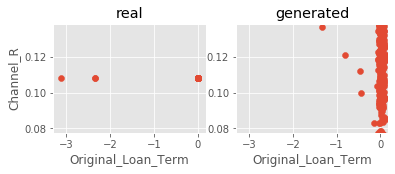

Iter: 25900; D loss: 1.284; G_loss: -5.071; xgb_loss: 0.9939


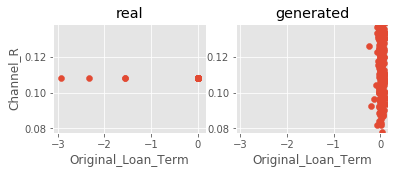

Iter: 26000; D loss: 1.284; G_loss: -5.399; xgb_loss: 0.9939


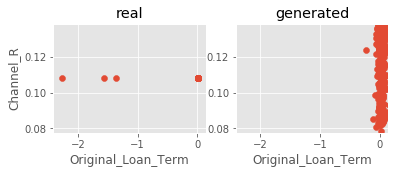

Iter: 26100; D loss: 1.284; G_loss: -3.781; xgb_loss: 0.998


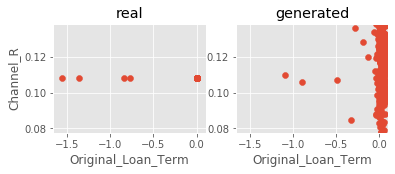

Iter: 26200; D loss: 1.824; G_loss: -5.018; xgb_loss: 0.9837


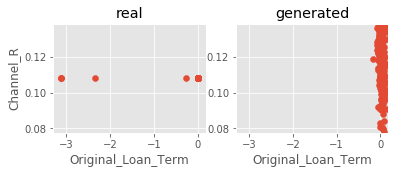

Iter: 26300; D loss: 1.264; G_loss: -3.903; xgb_loss: 0.9878


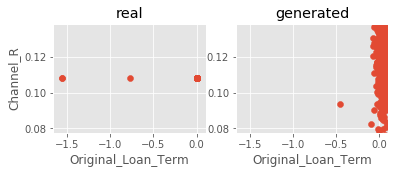

Iter: 26400; D loss: 1.356; G_loss: -4.623; xgb_loss: 0.9817


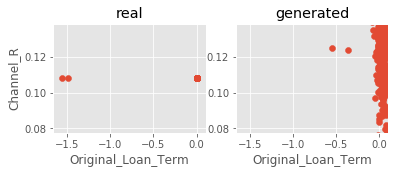

Iter: 26500; D loss: 1.42; G_loss: -4.809; xgb_loss: 1.0


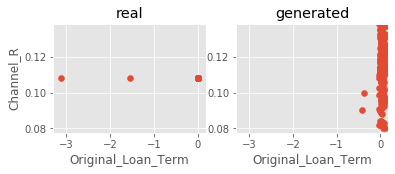

Iter: 26600; D loss: 2.361; G_loss: -4.944; xgb_loss: 0.9959


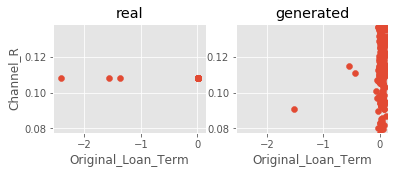

Iter: 26700; D loss: 1.28; G_loss: -4.946; xgb_loss: 0.9959


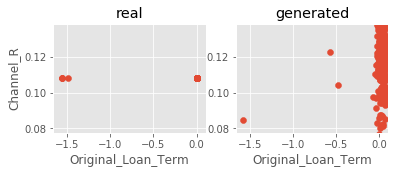

Iter: 26800; D loss: 1.21; G_loss: -4.886; xgb_loss: 0.9898


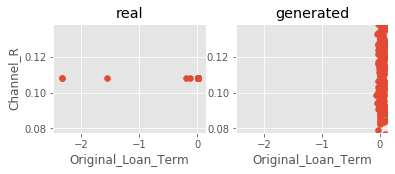

Iter: 26900; D loss: 1.026; G_loss: -4.756; xgb_loss: 0.9959


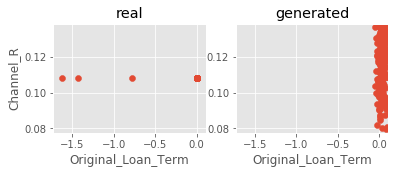

Iter: 27000; D loss: 1.941; G_loss: -5.558; xgb_loss: 0.998


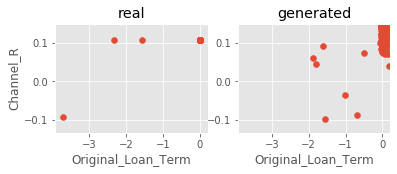

Iter: 27100; D loss: 1.522; G_loss: -4.782; xgb_loss: 0.9919


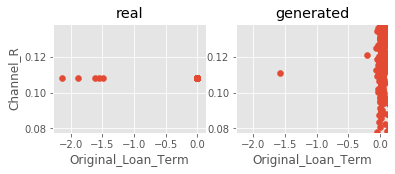

Iter: 27200; D loss: 1.109; G_loss: -0.9845; xgb_loss: 0.9898


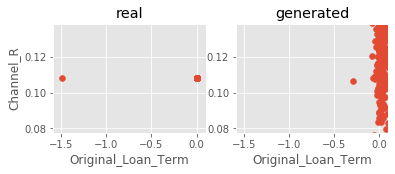

Iter: 27300; D loss: 1.122; G_loss: -4.211; xgb_loss: 0.9959


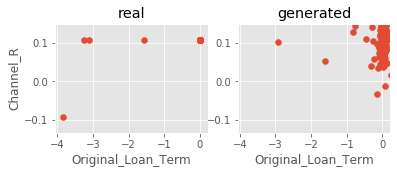

Iter: 27400; D loss: 2.595; G_loss: -4.77; xgb_loss: 0.9919


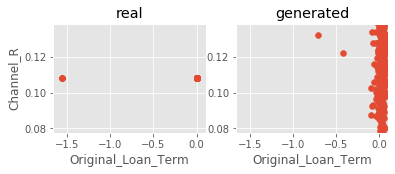

Iter: 27500; D loss: 1.238; G_loss: -4.975; xgb_loss: 0.9959


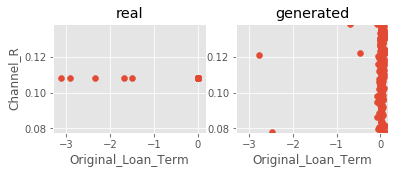

Iter: 27600; D loss: 1.27; G_loss: -4.722; xgb_loss: 0.9939


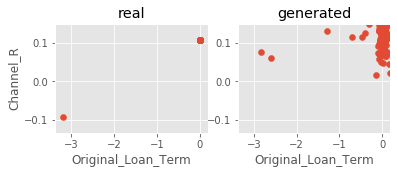

Iter: 27700; D loss: nan; G_loss: nan; xgb_loss: 1.0


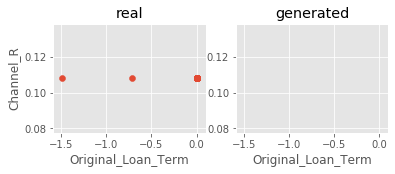

Iter: 27800; D loss: nan; G_loss: nan; xgb_loss: 1.0


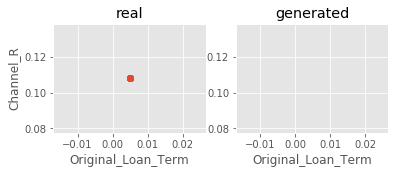

Iter: 27900; D loss: nan; G_loss: nan; xgb_loss: 1.0


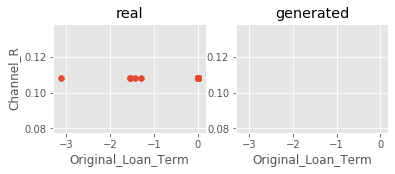

Iter: 28000; D loss: nan; G_loss: nan; xgb_loss: 1.0


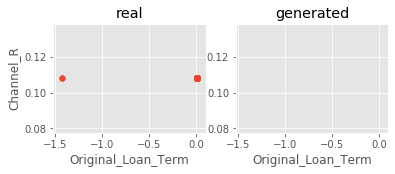

Iter: 28100; D loss: nan; G_loss: nan; xgb_loss: 1.0


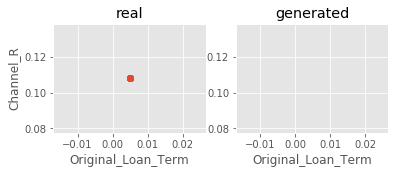

Iter: 28200; D loss: nan; G_loss: nan; xgb_loss: 1.0


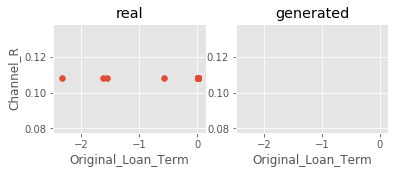

Iter: 28300; D loss: nan; G_loss: nan; xgb_loss: 1.0


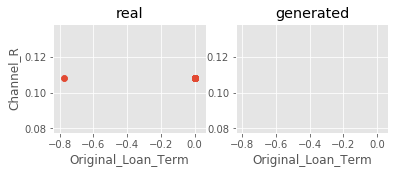

Iter: 28400; D loss: nan; G_loss: nan; xgb_loss: 1.0


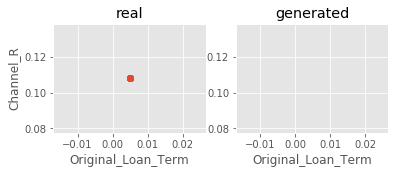

Iter: 28500; D loss: nan; G_loss: nan; xgb_loss: 1.0


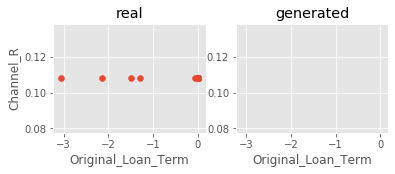

Iter: 28600; D loss: nan; G_loss: nan; xgb_loss: 1.0


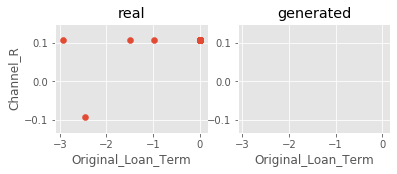

Iter: 28700; D loss: nan; G_loss: nan; xgb_loss: 1.0


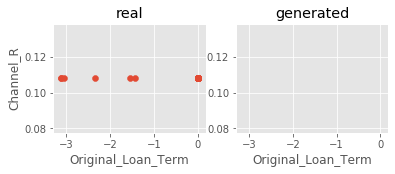

Iter: 28800; D loss: nan; G_loss: nan; xgb_loss: 0.9919


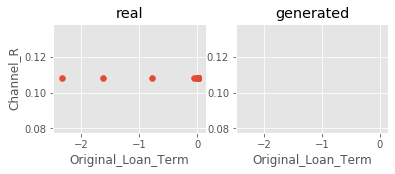

Iter: 28900; D loss: nan; G_loss: nan; xgb_loss: 1.0


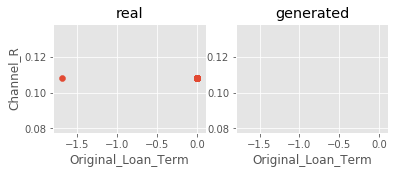

Iter: 29000; D loss: nan; G_loss: nan; xgb_loss: 1.0


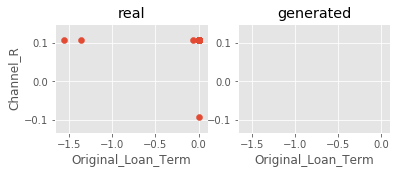

Iter: 29100; D loss: nan; G_loss: nan; xgb_loss: 1.0


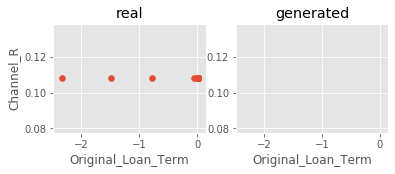

Iter: 29200; D loss: nan; G_loss: nan; xgb_loss: 1.0


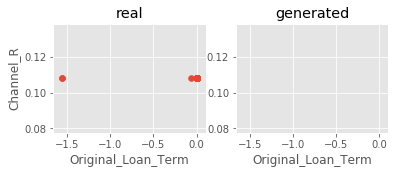

Iter: 29300; D loss: nan; G_loss: nan; xgb_loss: 0.998


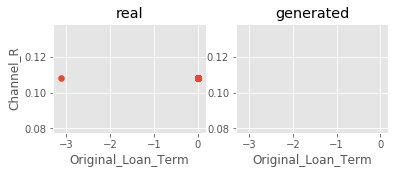

Iter: 29400; D loss: nan; G_loss: nan; xgb_loss: 1.0


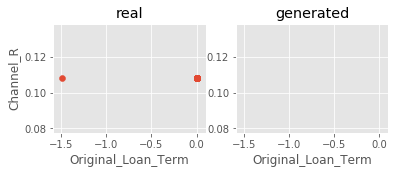

Iter: 29500; D loss: nan; G_loss: nan; xgb_loss: 1.0


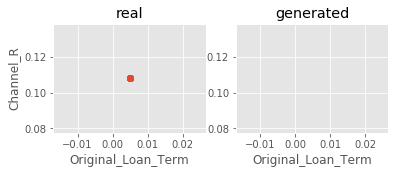

Iter: 29600; D loss: nan; G_loss: nan; xgb_loss: 1.0


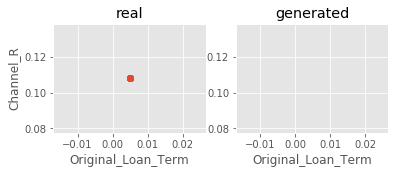

Iter: 29700; D loss: nan; G_loss: nan; xgb_loss: 1.0


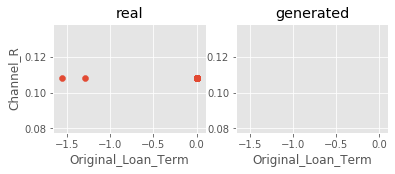

Iter: 29800; D loss: nan; G_loss: nan; xgb_loss: 1.0


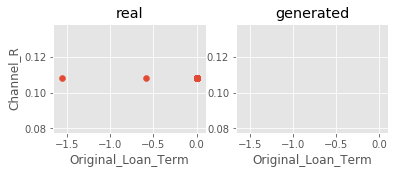

Iter: 29900; D loss: nan; G_loss: nan; xgb_loss: 1.0


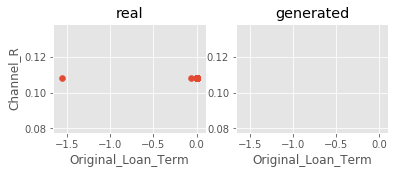

Iter: 30000; D loss: nan; G_loss: nan; xgb_loss: 1.0


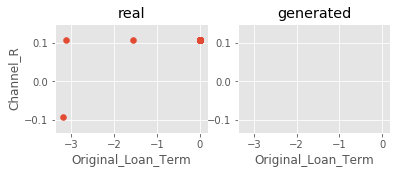

Iter: 30100; D loss: nan; G_loss: nan; xgb_loss: 0.998


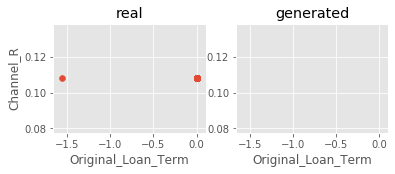

Iter: 30200; D loss: nan; G_loss: nan; xgb_loss: 0.998


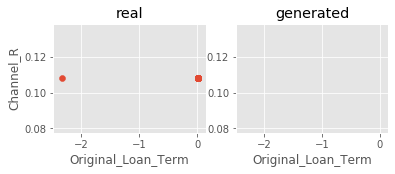

Iter: 30300; D loss: nan; G_loss: nan; xgb_loss: 1.0


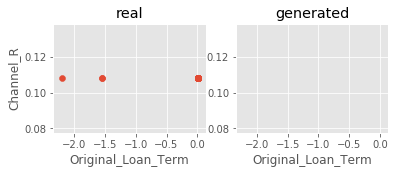

Iter: 30400; D loss: nan; G_loss: nan; xgb_loss: 1.0


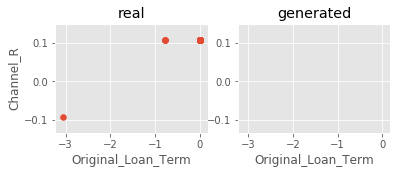

Iter: 30500; D loss: nan; G_loss: nan; xgb_loss: 1.0


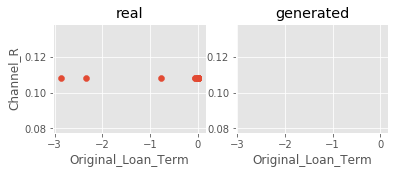

Iter: 30600; D loss: nan; G_loss: nan; xgb_loss: 1.0


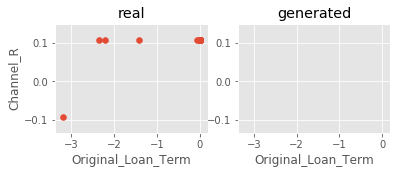

Iter: 30700; D loss: nan; G_loss: nan; xgb_loss: 1.0


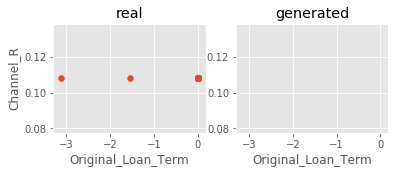

Iter: 30800; D loss: nan; G_loss: nan; xgb_loss: 1.0


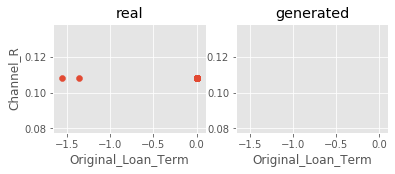

Iter: 30900; D loss: nan; G_loss: nan; xgb_loss: 1.0


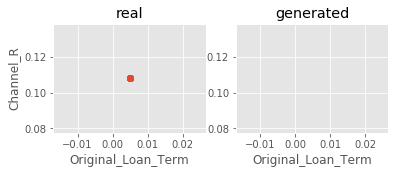

Iter: 31000; D loss: nan; G_loss: nan; xgb_loss: 1.0


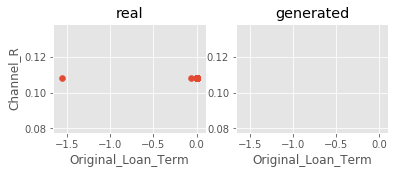

Iter: 31100; D loss: nan; G_loss: nan; xgb_loss: 1.0


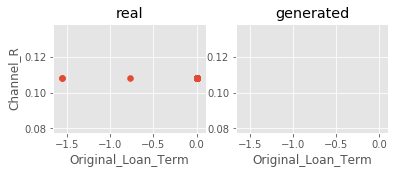

Iter: 31200; D loss: nan; G_loss: nan; xgb_loss: 1.0


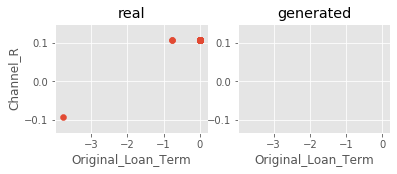

Iter: 31300; D loss: nan; G_loss: nan; xgb_loss: 1.0


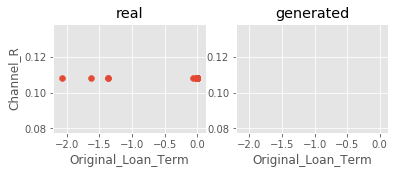

Iter: 31400; D loss: nan; G_loss: nan; xgb_loss: 1.0


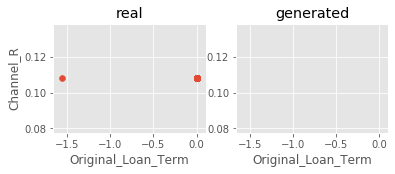

Iter: 31500; D loss: nan; G_loss: nan; xgb_loss: 0.998


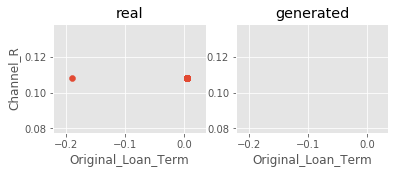

Iter: 31600; D loss: nan; G_loss: nan; xgb_loss: 1.0


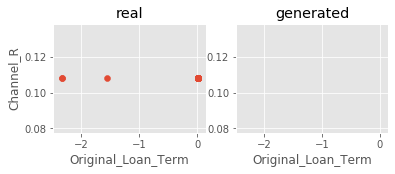

Iter: 31700; D loss: nan; G_loss: nan; xgb_loss: 0.9959


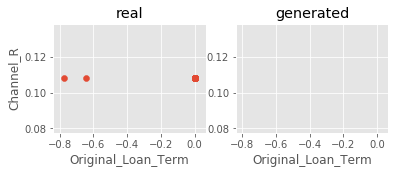

Iter: 31800; D loss: nan; G_loss: nan; xgb_loss: 1.0


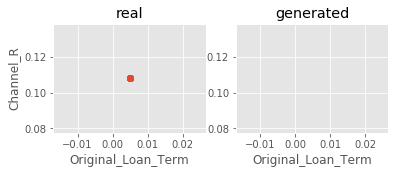

Iter: 31900; D loss: nan; G_loss: nan; xgb_loss: 1.0


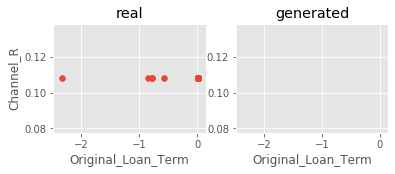

Iter: 32000; D loss: nan; G_loss: nan; xgb_loss: 1.0


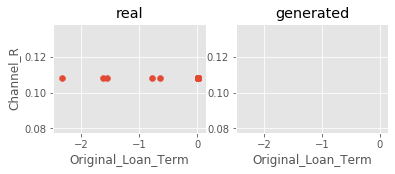

Iter: 32100; D loss: nan; G_loss: nan; xgb_loss: 0.9959


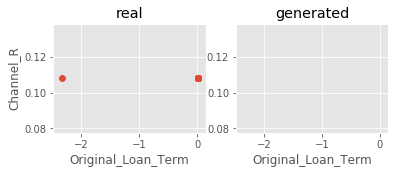

Iter: 32200; D loss: nan; G_loss: nan; xgb_loss: 1.0


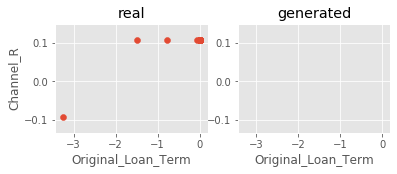

Iter: 32300; D loss: nan; G_loss: nan; xgb_loss: 1.0


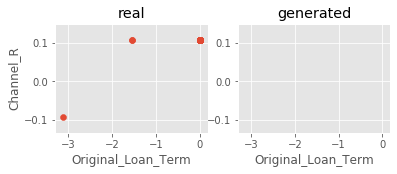

Iter: 32400; D loss: nan; G_loss: nan; xgb_loss: 0.9959


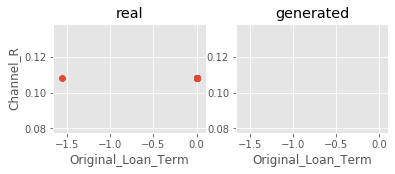

Iter: 32500; D loss: nan; G_loss: nan; xgb_loss: 1.0


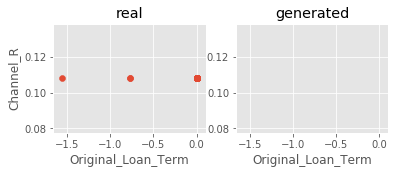

Iter: 32600; D loss: nan; G_loss: nan; xgb_loss: 0.9939


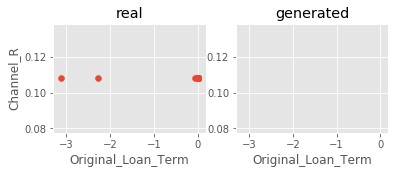

Iter: 32700; D loss: nan; G_loss: nan; xgb_loss: 1.0


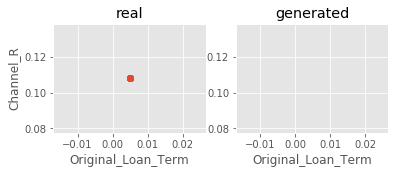

Iter: 32800; D loss: nan; G_loss: nan; xgb_loss: 1.0


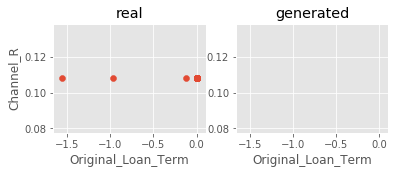

Iter: 32900; D loss: nan; G_loss: nan; xgb_loss: 1.0


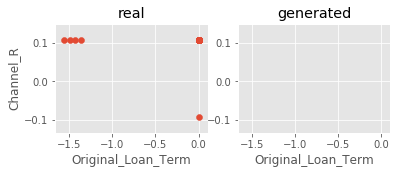

Iter: 33000; D loss: nan; G_loss: nan; xgb_loss: 1.0


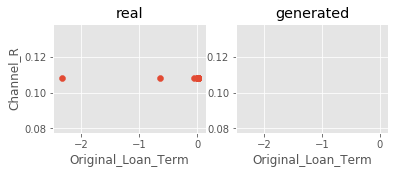

Iter: 33100; D loss: nan; G_loss: nan; xgb_loss: 1.0


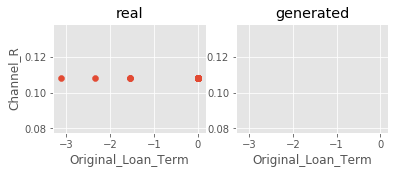

Iter: 33200; D loss: nan; G_loss: nan; xgb_loss: 1.0


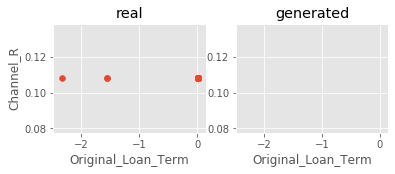

Iter: 33300; D loss: nan; G_loss: nan; xgb_loss: 0.998


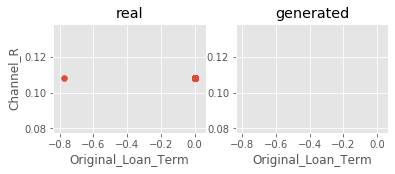

Iter: 33400; D loss: nan; G_loss: nan; xgb_loss: 1.0


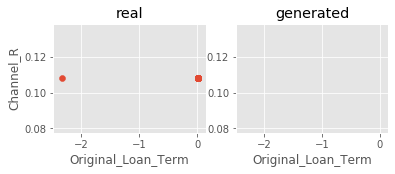

Iter: 33500; D loss: nan; G_loss: nan; xgb_loss: 0.998


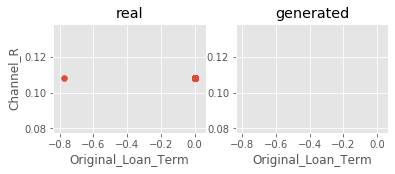

Iter: 33600; D loss: nan; G_loss: nan; xgb_loss: 1.0


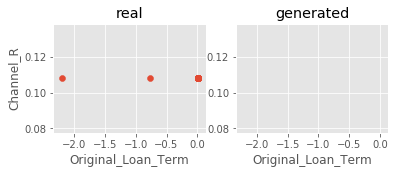

Iter: 33700; D loss: nan; G_loss: nan; xgb_loss: 1.0


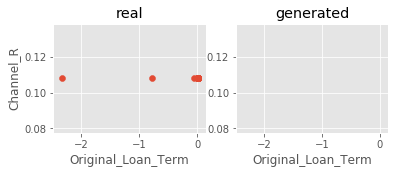

Iter: 33800; D loss: nan; G_loss: nan; xgb_loss: 1.0


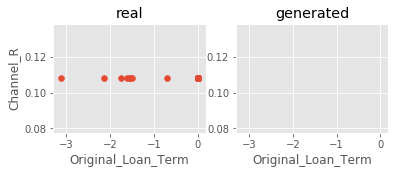

Iter: 33900; D loss: nan; G_loss: nan; xgb_loss: 0.998


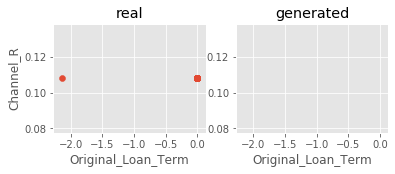

Iter: 34000; D loss: nan; G_loss: nan; xgb_loss: 0.998


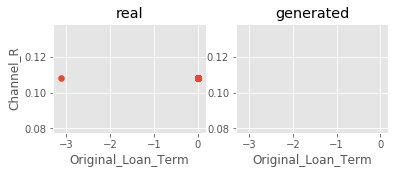

Iter: 34100; D loss: nan; G_loss: nan; xgb_loss: 0.998


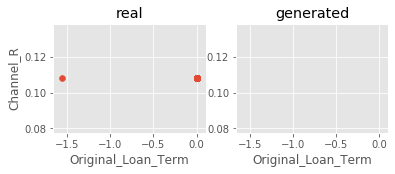

Iter: 34200; D loss: nan; G_loss: nan; xgb_loss: 0.9959


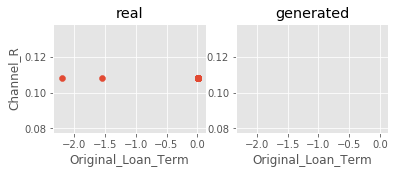

Iter: 34300; D loss: nan; G_loss: nan; xgb_loss: 1.0


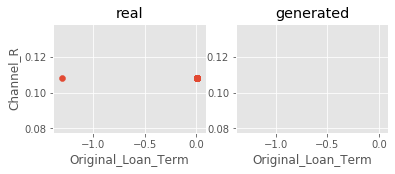

Iter: 34400; D loss: nan; G_loss: nan; xgb_loss: 1.0


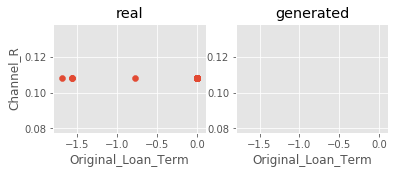

Iter: 34500; D loss: nan; G_loss: nan; xgb_loss: 1.0


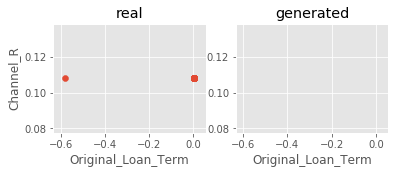

Iter: 34600; D loss: nan; G_loss: nan; xgb_loss: 1.0


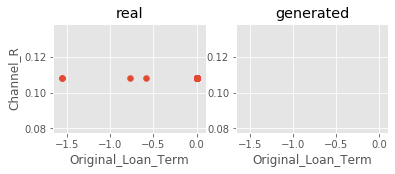

Iter: 34700; D loss: nan; G_loss: nan; xgb_loss: 1.0


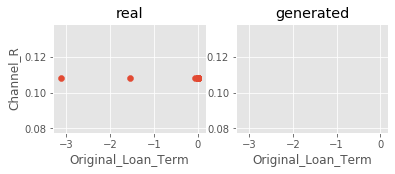

Iter: 34800; D loss: nan; G_loss: nan; xgb_loss: 1.0


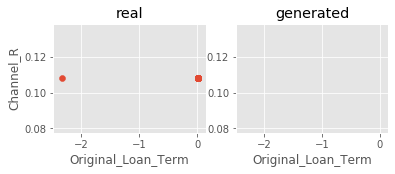

Iter: 34900; D loss: nan; G_loss: nan; xgb_loss: 0.9919


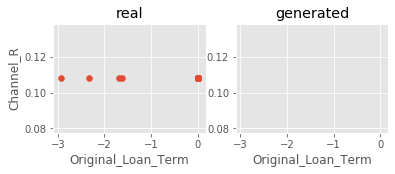

Iter: 35000; D loss: nan; G_loss: nan; xgb_loss: 1.0


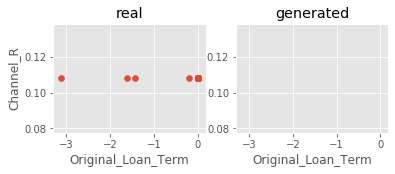

Iter: 35100; D loss: nan; G_loss: nan; xgb_loss: 1.0


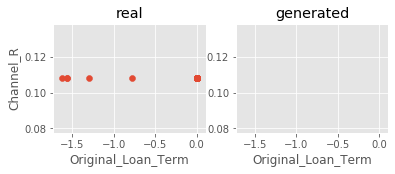

Iter: 35200; D loss: nan; G_loss: nan; xgb_loss: 0.9878


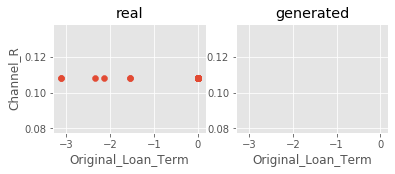

Iter: 35300; D loss: nan; G_loss: nan; xgb_loss: 1.0


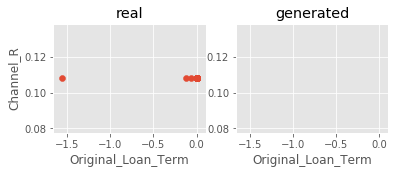

Iter: 35400; D loss: nan; G_loss: nan; xgb_loss: 0.998


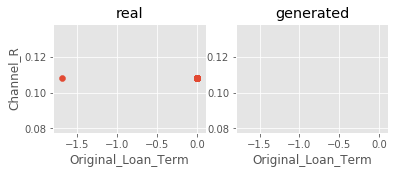

Iter: 35500; D loss: nan; G_loss: nan; xgb_loss: 1.0


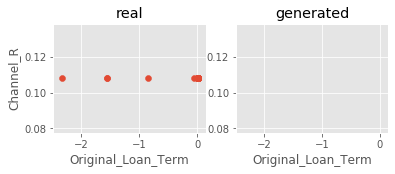

Iter: 35600; D loss: nan; G_loss: nan; xgb_loss: 1.0


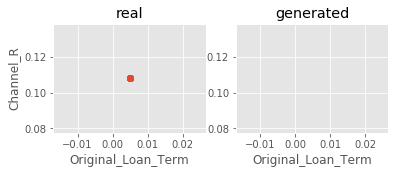

KeyboardInterrupt: 

In [279]:
%%time

# Now we train the DRAGAN
# We'll xgboost test it at intervals
# We'll also save the graph weights and losses at intervals as well
# We also dump the training result in the folder.

for it in range(0, 50000+1):
    
    X_mb = get_data_batch(train, mb_size, seed=it)
    X_mb_p = get_perturbed_batch(X_mb) # DRAGAN

    _, D_loss_curr, d_l_r, d_l_g = sess.run(
        [D_solver, disc_cost, D_loss_real, D_loss_fake],
        feed_dict={X: X_mb, X_p: X_mb_p, z: sample_z(mb_size, z_dim)}
    )

    _, G_loss_curr = sess.run(
        [G_solver, gen_cost],
        feed_dict={z: sample_z(mb_size, z_dim)}
    )

    disc_loss_real.append(d_l_r)
    disc_loss_generated.append(d_l_g)
    combined_loss.append(G_loss_curr)
    
    if it % 100 == 0:
        test_size = 492 # The total number of fraud cases
        x = get_data_batch(train, test_size, seed=it)
        g_z = sess.run(G_sample, feed_dict={z: sample_z(test_size, z_dim)})
        xgb_loss = CheckAccuracy( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim )
        xgb_losses.append(xgb_loss)
        if xgb_loss < best_xgb: 
            best_xgb = xgb_loss
            saver.save(sess, data_dir + cache_prefix, global_step=it, write_meta_graph=False )
            
    if it % log_interval == 0:
        print('Iter: {}; D loss: {:.4}; G_loss: {:.4}; xgb_loss: {:.4}'
              .format(it, D_loss_curr, G_loss_curr, xgb_loss))
        if show:
            PlotData( x, g_z, data_cols, label_cols, seed=0, with_class=with_class, data_dim=data_dim ) 
            
        saver.save(sess, data_dir + cache_prefix, global_step=it, write_meta_graph=False )

        pickle.dump([combined_loss, disc_loss_generated, disc_loss_real, xgb_losses], 
                        open( data_dir + cache_prefix + '_losses_step_{}.pkl'.format(it) ,'wb'))
    

In [280]:
tf.reset_default_graph()
sess = tf.Session()
print( len( sess.graph.get_operations() ) )

[ D_solver, disc_cost, D_loss_real, D_loss_fake,
 X, X_p, z,
 G_solver, gen_cost, G_sample ] = \
    define_DRAGAN_network( X_dim=X_dim, h_dim=h_dim, z_dim=z_dim, learning_rate=learning_rate, mb_size=mb_size, seed=global_seed ) ;

sess = tf.Session()

np.random.seed(global_seed)
tf.set_random_seed(global_seed)
sess.graph.seed = global_seed

sess.run(tf.global_variables_initializer())

saver = tf.train.Saver( max_to_keep=10000 ) # 20 Mb+ for all, 1.5 Mb for thetas only

print( len( sess.graph.get_operations() ) )

0
1107


In [281]:
saver.restore(sess, data_dir + cache_prefix + '-27600' )

print( len( sess.graph.get_operations() ) )

g_z = sess.run(G_sample, feed_dict={z: sample_z(test_size, z_dim)})
# g_z

Instructions for updating:
Use standard file APIs to check for files with this prefix.
INFO:tensorflow:Restoring parameters from cache_updated/DRAGAN-27600
1107


In [285]:
data.columns
len(data_cols)
print(len(g_z))

492


In [287]:
# %%time

# We can test the generated data using the functions from the 'GAN Data Testing' Section
# You'll need to load the functions from that section for this to work

# The labels for the generate data will all be 1, as they are supposed to be fraud data
#g_z_df = pd.DataFrame( np.hstack( [g_z[:,:len(data_cols)], np.ones((len(g_z),1))] ), columns=data.columns )
g_z_df = pd.DataFrame( np.hstack( [g_z[:,:len(data_cols)], np.ones((len(g_z),1))] ), columns=sorted_cols )
n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set = MakeCrossFolds(g_z_df)
    
t_DRAGAN = Run_CV_Xgb(n_train_fraud, train_real_set, test_real_set, train_fraud_set, test_fraud_set)


100
151364
492
592
148
176230
123360
52870
# additional generated data tested: 0
# additional generated data tested: 36
# additional generated data tested: 85
# additional generated data tested: 152
# additional generated data tested: 243


In [288]:
# Looks like still no increase in recall

# here, ratio is normed data / generated data. 

t_DRAGAN.groupby('ratio')[['recall']].aggregate(['mean','std'])

recall     
           mean  std
ratio               
1.000000    1.0  0.0
1.361882    1.0  0.0
1.854724    1.0  0.0
2.525916    1.0  0.0
3.440000    1.0  0.0

In [289]:
prefix = 'DRAGAN'

[combined_loss, disc_loss_generated, disc_loss_real, xgb_losses] = pickle.load(open(data_dir+prefix+'_losses_step_10000.pkl','rb'))


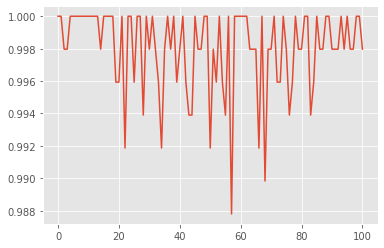

In [290]:
# Let's look at the xgboost losses
# Unsmoothed with w set to 1

w = 1
plt.plot( pd.DataFrame(xgb_losses[:]).rolling(w).mean() ) ;
# plt.savefig('plots/171031_xgb_loss_DRAGAN_lr1e-4_mb128_hdim128.png')

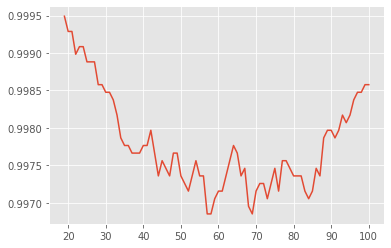

In [291]:
# Let's look at the smoothed xgboost losses

# Smoothed with w set to 20.
w = 20
plt.plot( pd.DataFrame(xgb_losses[:]).rolling(w).mean() ) ;

In [292]:
# Let's find the best xgboost loss
# found to be at step 45400 with 0.62 as the best xgboost loss.

best_step = xgb_losses.index( np.array(xgb_losses).min() ) * 100
print( best_step, np.array(xgb_losses).min() )

xgb100 = [ xgb_losses[i] for i in range(0, len(xgb_losses), 1) ]
best_step = xgb100.index( min(xgb100) ) * log_interval
print( best_step, min(xgb100) )

5700 0.9878048780487805
5700 0.9878048780487805


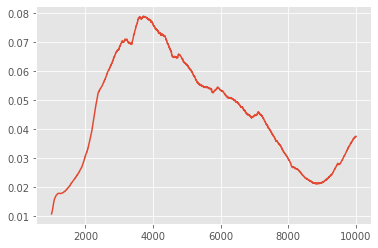

In [293]:

# Let's look at training losses

# plt.plot( (np.array(disc_loss_real) - np.array(disc_loss_generated)) )

# smooth with w to be 1000

w = 1000
# plt.plot( list(range(0,5001,1)), pd.rolling_mean((np.array(disc_loss_real) - np.array(disc_loss_generated)),w) )
plt.plot( pd.DataFrame(disc_loss_real[:]).rolling(w).mean() - pd.DataFrame(disc_loss_generated[:]).rolling(w).mean() ) ;

# plt.ylim([-0.005,0.015])

# plt.xlim([50000,110000])
# plt.ylim([-0.001,0.002])